In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

# gpu_options = tf.GPUOptions(allow_growth=True)
# session = tf.InteractiveSession(config=tf.ConfigProto(gpu_options=gpu_options))
print(tf.__version__)
#Read the sonar dataset
df = pd.read_csv('YearPredictionMSD.txt', header=None)
df

2.4.1


,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,90
0,2001,49.94357,21.47114,73.07750,8.74861,-17.40628,-13.09905,-25.01202,-12.23257,7.83089,...,13.01620,-54.40548,58.99367,15.37344,1.11144,-23.08793,68.40795,-1.82223,-27.46348,2.26327
1,2001,48.73215,18.42930,70.32679,12.94636,-10.32437,-24.83777,8.76630,-0.92019,18.76548,...,5.66812,-19.68073,33.04964,42.87836,-9.90378,-32.22788,70.49388,12.04941,58.43453,26.92061
2,2001,50.95714,31.85602,55.81851,13.41693,-6.57898,-18.54940,-3.27872,-2.35035,16.07017,...,3.03800,26.05866,-50.92779,10.93792,-0.07568,43.20130,-115.00698,-0.05859,39.67068,-0.66345
3,2001,48.24750,-1.89837,36.29772,2.58776,0.97170,-26.21683,5.05097,-10.34124,3.55005,...,34.57337,-171.70734,-16.96705,-46.67617,-12.51516,82.58061,-72.08993,9.90558,199.62971,18.85382
4,2001,50.97020,42.20998,67.09964,8.46791,-15.85279,-16.81409,-12.48207,-9.37636,12.63699,...,9.92661,-55.95724,64.92712,-17.72522,-1.49237,-7.50035,51.76631,7.88713,55.66926,28.74903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515340,2006,51.28467,45.88068,22.19582,-5.53319,-3.61835,-16.36914,2.12652,5.18160,-8.66890,...,4.81440,-3.75991,-30.92584,26.33968,-5.03390,21.86037,-142.29410,3.42901,-41.14721,-15.46052
515341,2006,49.87870,37.93125,18.65987,-3.63581,-27.75665,-18.52988,7.76108,3.56109,-2.50351,...,32.38589,-32.75535,-61.05473,56.65182,15.29965,95.88193,-10.63242,12.96552,92.11633,10.88815
515342,2006,45.12852,12.65758,-38.72018,8.80882,-29.29985,-2.28706,-18.40424,-22.28726,-4.52429,...,-18.73598,-71.15954,-123.98443,121.26989,10.89629,34.62409,-248.61020,-6.07171,53.96319,-8.09364
515343,2006,44.16614,32.38368,-3.34971,-2.49165,-19.59278,-18.67098,8.78428,4.02039,-12.01230,...,67.16763,282.77624,-4.63677,144.00125,21.62652,-29.72432,71.47198,20.32240,14.83107,39.74909


In [2]:
print(len(df.columns))
# X = df[df.columns[1:]].values
# 1 and 2 are skewed data
X = df[set(df.columns) - set(df.columns[0:1])].values # - set(df.columns[21:25]) - set(df.columns[53:54])].values
       
Y=df[df.columns[0]]

91


In [3]:
# y_t = tf.one_hot(tf.constant(Y[:1000]-1930), depth=89)
# for i in range(len(y_t)):
#     print(Y[i],y_t[i])

In [4]:
#Transform the data in training and testing
# train_x=X[:1000]
# test_x=X[-200:]
# train_y = tf.one_hot(tf.constant(Y[:1000]-1930), depth=89)
# test_y=tf.one_hot(tf.constant(Y[-200:]-1930), depth=89)
train_x=X[:463715]
test_x=X[463716:]
train_y = tf.one_hot(tf.constant(Y[:463715]-1930), depth=89)
test_y=tf.one_hot(tf.constant(Y[463716:]-1930), depth=89)

In [5]:
normalizer = preprocessing.Normalization()
normalizer.adapt(np.array(train_x))
print(normalizer.mean.numpy())

[ 4.33854866e+01  1.26109099e+00  8.65019512e+00  1.13076329e+00
 -6.51272440e+00 -9.56552696e+00 -2.38460946e+00 -1.79372156e+00
  3.71458435e+00  1.87249458e+00 -1.43124983e-01  2.54142308e+00
  3.36688843e+01  2.43589648e+03  1.96510181e+03  1.51205066e+03
  9.10432800e+02  8.77598877e+02  6.03197083e+02  5.16171631e+02
  3.93807373e+02  3.25034698e+02  2.88237366e+02  2.92140930e+02
  4.30846825e+01  4.32472916e+01 -4.63454590e+01 -2.79639130e+01
  1.46140184e+01  4.46637688e+01  5.33815384e+00  2.39861679e+01
  9.84432602e+00 -4.15316725e+00  6.36737049e-01  7.27213135e+01
 -5.17048225e+01  1.17332413e+02 -1.89741058e+02  2.32635460e+01
 -1.19240272e+00  1.84593563e+01 -5.18602562e+01  3.17096686e+00
 -1.51814258e+00  6.36787844e+00  7.85528793e+01  1.43006653e+02
 -8.62206039e+01  2.53047314e+01  6.25004816e+00  2.83299007e+01
  1.26734419e+01  1.74636567e+00 -1.01378231e+01  6.40029221e+01
  1.04409782e+02 -2.29792744e-01  3.89656715e+01 -2.81401882e+01
  3.18316460e+00  3.62520

In [6]:
first = np.array(train_x[:1])

with np.printoptions(precision=2, suppress=True):
    print('First example:', first)
    print()
    print('Normalized:', normalizer(first).numpy())

First example: [[  49.94   21.47   73.08    8.75  -17.41  -13.1   -25.01  -12.23    7.83
    -2.47    3.32   -2.32   10.21  611.11  951.09  698.11  408.98  383.71
   326.52  238.11  251.42  187.17  100.43  179.19   -8.42 -317.87   95.86
    48.1   -95.66  -18.06    1.97   34.42   11.73    1.37    7.79   -0.37
  -133.68  -83.26  -37.3    73.05  -37.37   -3.14  -24.22  -13.23   15.94
   -18.6    82.15  240.58  -10.29   31.58  -25.38   -3.91   13.29   41.55
    -7.26  -21.01  105.51   64.3    26.08  -44.59   -8.31    7.94  -10.74
   -95.45  -82.03  -35.59    4.7    70.96   28.09    6.02  -37.14  -41.12
    -8.41    7.2    -8.6    -5.91  -12.32   14.69  -54.32   40.15   13.02
   -54.41   58.99   15.37    1.11  -23.09   68.41   -1.82  -27.46    2.26]]

Normalized: [[ 1.08  0.39  1.83  0.47 -0.48 -0.28 -1.55 -1.31  0.39 -0.67  0.79 -0.58
  -1.06 -1.04 -0.8  -0.74 -1.05 -0.86 -0.87 -0.9  -0.67 -0.83 -1.01 -0.73
  -0.42 -0.5   0.26  0.35 -0.68 -0.47 -0.03  0.15  0.03  0.1   0.17 -0.68
  -0.2  

In [7]:
learning_rate=0.1
epoch=10
def build_and_compile_model(norm):
    model = keras.Sequential([
      norm,
      layers.Dense(90, activation='relu'),
#       layers.Dense(180, activation='relu'),
      layers.Dense(135, activation='relu'),
      layers.Dense(91, activation='relu'),
      layers.Dense(89)
    ])

    model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(learning_rate))
    return model

In [8]:
dnn_model = build_and_compile_model(normalizer)
dnn_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization (Normalization (None, 90)                181       
_________________________________________________________________
dense (Dense)                (None, 90)                8190      
_________________________________________________________________
dense_1 (Dense)              (None, 135)               12285     
_________________________________________________________________
dense_2 (Dense)              (None, 91)                12376     
_________________________________________________________________
dense_3 (Dense)              (None, 89)                8188      
Total params: 41,220
Trainable params: 41,039
Non-trainable params: 181
_________________________________________________________________


In [9]:
history = dnn_model.fit(
    train_x, train_y,
    validation_split=0.2,
    verbose=0, epochs=epoch)

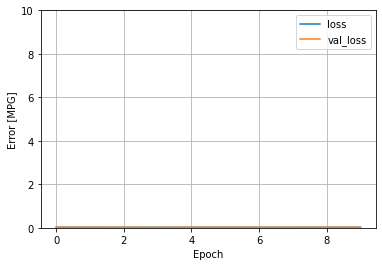

In [10]:
import matplotlib.pyplot as plt

def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 10])
    plt.xlabel('Epoch')
    plt.ylabel('Error [MPG]')
    plt.legend()
    plt.grid(True)
plot_loss(history)

In [11]:
dnn_model.evaluate(test_x, test_y, verbose=0)

0.02325352653861046

In [19]:
train_predictions = dnn_model.predict(train_x)
error = train_predictions - train_y
sum(sum(np.square(error)))/2/len(train_y)

0.02325275167822838

In [12]:
test_predictions = dnn_model.predict(test_x)
error = test_predictions - test_y
error

<tf.Tensor: shape=(51629, 89), dtype=float32, numpy=
array([[ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       ...,
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284]], dtype=float32)>

In [13]:
sum(sum(np.square(error)))/2/len(test_y)

0.5059558361035429

In [14]:
test_predictions - test_y

<tf.Tensor: shape=(51629, 89), dtype=float32, numpy=
array([[ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       ...,
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284]], dtype=float32)>

In [20]:
train_predictions

array([[ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       ...,
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284],
       [ 0.00643276, -0.0265297 , -0.01966302, ...,  0.02091279,
         0.00168071,  0.00062284]], dtype=float32)

In [28]:
# np.amax(train_predictions,axis=0)
# np.where(train_predictions == np.amax(train_predictions))[0]
result = np.where(train_predictions == np.amax(train_predictions))
listOfCordinates = list(zip(result[0], result[1]))
for cord in listOfCordinates:
    print(cord)

(0, 50)
(1, 50)
(2, 50)
(3, 50)
(4, 50)
(5, 50)
(6, 50)
(7, 50)
(8, 50)
(9, 50)
(10, 50)
(11, 50)
(12, 50)
(13, 50)
(14, 50)
(15, 50)
(16, 50)
(17, 50)
(18, 50)
(19, 50)
(20, 50)
(21, 50)
(22, 50)
(23, 50)
(24, 50)
(25, 50)
(26, 50)
(27, 50)
(28, 50)
(29, 50)
(30, 50)
(31, 50)
(32, 50)
(33, 50)
(34, 50)
(35, 50)
(36, 50)
(37, 50)
(38, 50)
(39, 50)
(40, 50)
(41, 50)
(42, 50)
(43, 50)
(44, 50)
(45, 50)
(46, 50)
(47, 50)
(48, 50)
(49, 50)
(50, 50)
(51, 50)
(52, 50)
(53, 50)
(54, 50)
(55, 50)
(56, 50)
(57, 50)
(58, 50)
(59, 50)
(60, 50)
(61, 50)
(62, 50)
(63, 50)
(64, 50)
(65, 50)
(66, 50)
(67, 50)
(68, 50)
(69, 50)
(70, 50)
(71, 50)
(72, 50)
(73, 50)
(74, 50)
(75, 50)
(76, 50)
(77, 50)
(78, 50)
(79, 50)
(80, 50)
(81, 50)
(82, 50)
(83, 50)
(84, 50)
(85, 50)
(86, 50)
(87, 50)
(88, 50)
(89, 50)
(90, 50)
(91, 50)
(92, 50)
(93, 50)
(94, 50)
(95, 50)
(96, 50)
(97, 50)
(98, 50)
(99, 50)
(100, 50)
(101, 50)
(102, 50)
(103, 50)
(104, 50)
(105, 50)
(106, 50)
(107, 50)
(108, 50)
(109, 50)
(110, 50)


(1902, 50)
(1903, 50)
(1904, 50)
(1905, 50)
(1906, 50)
(1907, 50)
(1908, 50)
(1909, 50)
(1910, 50)
(1911, 50)
(1912, 50)
(1913, 50)
(1914, 50)
(1915, 50)
(1916, 50)
(1917, 50)
(1918, 50)
(1919, 50)
(1920, 50)
(1921, 50)
(1922, 50)
(1923, 50)
(1924, 50)
(1925, 50)
(1926, 50)
(1927, 50)
(1928, 50)
(1929, 50)
(1930, 50)
(1931, 50)
(1932, 50)
(1933, 50)
(1934, 50)
(1935, 50)
(1936, 50)
(1937, 50)
(1938, 50)
(1939, 50)
(1940, 50)
(1941, 50)
(1942, 50)
(1943, 50)
(1944, 50)
(1945, 50)
(1946, 50)
(1947, 50)
(1948, 50)
(1949, 50)
(1950, 50)
(1951, 50)
(1952, 50)
(1953, 50)
(1954, 50)
(1955, 50)
(1956, 50)
(1957, 50)
(1958, 50)
(1959, 50)
(1960, 50)
(1961, 50)
(1962, 50)
(1963, 50)
(1964, 50)
(1965, 50)
(1966, 50)
(1967, 50)
(1968, 50)
(1969, 50)
(1970, 50)
(1971, 50)
(1972, 50)
(1973, 50)
(1974, 50)
(1975, 50)
(1976, 50)
(1977, 50)
(1978, 50)
(1979, 50)
(1980, 50)
(1981, 50)
(1982, 50)
(1983, 50)
(1984, 50)
(1985, 50)
(1986, 50)
(1987, 50)
(1988, 50)
(1989, 50)
(1990, 50)
(1991, 50)
(1992, 50)

(4752, 50)
(4753, 50)
(4754, 50)
(4755, 50)
(4756, 50)
(4757, 50)
(4758, 50)
(4759, 50)
(4760, 50)
(4761, 50)
(4762, 50)
(4763, 50)
(4764, 50)
(4765, 50)
(4766, 50)
(4767, 50)
(4768, 50)
(4769, 50)
(4770, 50)
(4771, 50)
(4772, 50)
(4773, 50)
(4774, 50)
(4775, 50)
(4776, 50)
(4777, 50)
(4778, 50)
(4779, 50)
(4780, 50)
(4781, 50)
(4782, 50)
(4783, 50)
(4784, 50)
(4785, 50)
(4786, 50)
(4787, 50)
(4788, 50)
(4789, 50)
(4790, 50)
(4791, 50)
(4792, 50)
(4793, 50)
(4794, 50)
(4795, 50)
(4796, 50)
(4797, 50)
(4798, 50)
(4799, 50)
(4800, 50)
(4801, 50)
(4802, 50)
(4803, 50)
(4804, 50)
(4805, 50)
(4806, 50)
(4807, 50)
(4808, 50)
(4809, 50)
(4810, 50)
(4811, 50)
(4812, 50)
(4813, 50)
(4814, 50)
(4815, 50)
(4816, 50)
(4817, 50)
(4818, 50)
(4819, 50)
(4820, 50)
(4821, 50)
(4822, 50)
(4823, 50)
(4824, 50)
(4825, 50)
(4826, 50)
(4827, 50)
(4828, 50)
(4829, 50)
(4830, 50)
(4831, 50)
(4832, 50)
(4833, 50)
(4834, 50)
(4835, 50)
(4836, 50)
(4837, 50)
(4838, 50)
(4839, 50)
(4840, 50)
(4841, 50)
(4842, 50)

(6790, 50)
(6791, 50)
(6792, 50)
(6793, 50)
(6794, 50)
(6795, 50)
(6796, 50)
(6797, 50)
(6798, 50)
(6799, 50)
(6800, 50)
(6801, 50)
(6802, 50)
(6803, 50)
(6804, 50)
(6805, 50)
(6806, 50)
(6807, 50)
(6808, 50)
(6809, 50)
(6810, 50)
(6811, 50)
(6812, 50)
(6813, 50)
(6814, 50)
(6815, 50)
(6816, 50)
(6817, 50)
(6818, 50)
(6819, 50)
(6820, 50)
(6821, 50)
(6822, 50)
(6823, 50)
(6824, 50)
(6825, 50)
(6826, 50)
(6827, 50)
(6828, 50)
(6829, 50)
(6830, 50)
(6831, 50)
(6832, 50)
(6833, 50)
(6834, 50)
(6835, 50)
(6836, 50)
(6837, 50)
(6838, 50)
(6839, 50)
(6840, 50)
(6841, 50)
(6842, 50)
(6843, 50)
(6844, 50)
(6845, 50)
(6846, 50)
(6847, 50)
(6848, 50)
(6849, 50)
(6850, 50)
(6851, 50)
(6852, 50)
(6853, 50)
(6854, 50)
(6855, 50)
(6856, 50)
(6857, 50)
(6858, 50)
(6859, 50)
(6860, 50)
(6861, 50)
(6862, 50)
(6863, 50)
(6864, 50)
(6865, 50)
(6866, 50)
(6867, 50)
(6868, 50)
(6869, 50)
(6870, 50)
(6871, 50)
(6872, 50)
(6873, 50)
(6874, 50)
(6875, 50)
(6876, 50)
(6877, 50)
(6878, 50)
(6879, 50)
(6880, 50)

(9751, 50)
(9752, 50)
(9753, 50)
(9754, 50)
(9755, 50)
(9756, 50)
(9757, 50)
(9758, 50)
(9759, 50)
(9760, 50)
(9761, 50)
(9762, 50)
(9763, 50)
(9764, 50)
(9765, 50)
(9766, 50)
(9767, 50)
(9768, 50)
(9769, 50)
(9770, 50)
(9771, 50)
(9772, 50)
(9773, 50)
(9774, 50)
(9775, 50)
(9776, 50)
(9777, 50)
(9778, 50)
(9779, 50)
(9780, 50)
(9781, 50)
(9782, 50)
(9783, 50)
(9784, 50)
(9785, 50)
(9786, 50)
(9787, 50)
(9788, 50)
(9789, 50)
(9790, 50)
(9791, 50)
(9792, 50)
(9793, 50)
(9794, 50)
(9795, 50)
(9796, 50)
(9797, 50)
(9798, 50)
(9799, 50)
(9800, 50)
(9801, 50)
(9802, 50)
(9803, 50)
(9804, 50)
(9805, 50)
(9806, 50)
(9807, 50)
(9808, 50)
(9809, 50)
(9810, 50)
(9811, 50)
(9812, 50)
(9813, 50)
(9814, 50)
(9815, 50)
(9816, 50)
(9817, 50)
(9818, 50)
(9819, 50)
(9820, 50)
(9821, 50)
(9822, 50)
(9823, 50)
(9824, 50)
(9825, 50)
(9826, 50)
(9827, 50)
(9828, 50)
(9829, 50)
(9830, 50)
(9831, 50)
(9832, 50)
(9833, 50)
(9834, 50)
(9835, 50)
(9836, 50)
(9837, 50)
(9838, 50)
(9839, 50)
(9840, 50)
(9841, 50)

(12250, 50)
(12251, 50)
(12252, 50)
(12253, 50)
(12254, 50)
(12255, 50)
(12256, 50)
(12257, 50)
(12258, 50)
(12259, 50)
(12260, 50)
(12261, 50)
(12262, 50)
(12263, 50)
(12264, 50)
(12265, 50)
(12266, 50)
(12267, 50)
(12268, 50)
(12269, 50)
(12270, 50)
(12271, 50)
(12272, 50)
(12273, 50)
(12274, 50)
(12275, 50)
(12276, 50)
(12277, 50)
(12278, 50)
(12279, 50)
(12280, 50)
(12281, 50)
(12282, 50)
(12283, 50)
(12284, 50)
(12285, 50)
(12286, 50)
(12287, 50)
(12288, 50)
(12289, 50)
(12290, 50)
(12291, 50)
(12292, 50)
(12293, 50)
(12294, 50)
(12295, 50)
(12296, 50)
(12297, 50)
(12298, 50)
(12299, 50)
(12300, 50)
(12301, 50)
(12302, 50)
(12303, 50)
(12304, 50)
(12305, 50)
(12306, 50)
(12307, 50)
(12308, 50)
(12309, 50)
(12310, 50)
(12311, 50)
(12312, 50)
(12313, 50)
(12314, 50)
(12315, 50)
(12316, 50)
(12317, 50)
(12318, 50)
(12319, 50)
(12320, 50)
(12321, 50)
(12322, 50)
(12323, 50)
(12324, 50)
(12325, 50)
(12326, 50)
(12327, 50)
(12328, 50)
(12329, 50)
(12330, 50)
(12331, 50)
(12332, 50)
(123

(14750, 50)
(14751, 50)
(14752, 50)
(14753, 50)
(14754, 50)
(14755, 50)
(14756, 50)
(14757, 50)
(14758, 50)
(14759, 50)
(14760, 50)
(14761, 50)
(14762, 50)
(14763, 50)
(14764, 50)
(14765, 50)
(14766, 50)
(14767, 50)
(14768, 50)
(14769, 50)
(14770, 50)
(14771, 50)
(14772, 50)
(14773, 50)
(14774, 50)
(14775, 50)
(14776, 50)
(14777, 50)
(14778, 50)
(14779, 50)
(14780, 50)
(14781, 50)
(14782, 50)
(14783, 50)
(14784, 50)
(14785, 50)
(14786, 50)
(14787, 50)
(14788, 50)
(14789, 50)
(14790, 50)
(14791, 50)
(14792, 50)
(14793, 50)
(14794, 50)
(14795, 50)
(14796, 50)
(14797, 50)
(14798, 50)
(14799, 50)
(14800, 50)
(14801, 50)
(14802, 50)
(14803, 50)
(14804, 50)
(14805, 50)
(14806, 50)
(14807, 50)
(14808, 50)
(14809, 50)
(14810, 50)
(14811, 50)
(14812, 50)
(14813, 50)
(14814, 50)
(14815, 50)
(14816, 50)
(14817, 50)
(14818, 50)
(14819, 50)
(14820, 50)
(14821, 50)
(14822, 50)
(14823, 50)
(14824, 50)
(14825, 50)
(14826, 50)
(14827, 50)
(14828, 50)
(14829, 50)
(14830, 50)
(14831, 50)
(14832, 50)
(148

(17749, 50)
(17750, 50)
(17751, 50)
(17752, 50)
(17753, 50)
(17754, 50)
(17755, 50)
(17756, 50)
(17757, 50)
(17758, 50)
(17759, 50)
(17760, 50)
(17761, 50)
(17762, 50)
(17763, 50)
(17764, 50)
(17765, 50)
(17766, 50)
(17767, 50)
(17768, 50)
(17769, 50)
(17770, 50)
(17771, 50)
(17772, 50)
(17773, 50)
(17774, 50)
(17775, 50)
(17776, 50)
(17777, 50)
(17778, 50)
(17779, 50)
(17780, 50)
(17781, 50)
(17782, 50)
(17783, 50)
(17784, 50)
(17785, 50)
(17786, 50)
(17787, 50)
(17788, 50)
(17789, 50)
(17790, 50)
(17791, 50)
(17792, 50)
(17793, 50)
(17794, 50)
(17795, 50)
(17796, 50)
(17797, 50)
(17798, 50)
(17799, 50)
(17800, 50)
(17801, 50)
(17802, 50)
(17803, 50)
(17804, 50)
(17805, 50)
(17806, 50)
(17807, 50)
(17808, 50)
(17809, 50)
(17810, 50)
(17811, 50)
(17812, 50)
(17813, 50)
(17814, 50)
(17815, 50)
(17816, 50)
(17817, 50)
(17818, 50)
(17819, 50)
(17820, 50)
(17821, 50)
(17822, 50)
(17823, 50)
(17824, 50)
(17825, 50)
(17826, 50)
(17827, 50)
(17828, 50)
(17829, 50)
(17830, 50)
(17831, 50)
(178

(20996, 50)
(20997, 50)
(20998, 50)
(20999, 50)
(21000, 50)
(21001, 50)
(21002, 50)
(21003, 50)
(21004, 50)
(21005, 50)
(21006, 50)
(21007, 50)
(21008, 50)
(21009, 50)
(21010, 50)
(21011, 50)
(21012, 50)
(21013, 50)
(21014, 50)
(21015, 50)
(21016, 50)
(21017, 50)
(21018, 50)
(21019, 50)
(21020, 50)
(21021, 50)
(21022, 50)
(21023, 50)
(21024, 50)
(21025, 50)
(21026, 50)
(21027, 50)
(21028, 50)
(21029, 50)
(21030, 50)
(21031, 50)
(21032, 50)
(21033, 50)
(21034, 50)
(21035, 50)
(21036, 50)
(21037, 50)
(21038, 50)
(21039, 50)
(21040, 50)
(21041, 50)
(21042, 50)
(21043, 50)
(21044, 50)
(21045, 50)
(21046, 50)
(21047, 50)
(21048, 50)
(21049, 50)
(21050, 50)
(21051, 50)
(21052, 50)
(21053, 50)
(21054, 50)
(21055, 50)
(21056, 50)
(21057, 50)
(21058, 50)
(21059, 50)
(21060, 50)
(21061, 50)
(21062, 50)
(21063, 50)
(21064, 50)
(21065, 50)
(21066, 50)
(21067, 50)
(21068, 50)
(21069, 50)
(21070, 50)
(21071, 50)
(21072, 50)
(21073, 50)
(21074, 50)
(21075, 50)
(21076, 50)
(21077, 50)
(21078, 50)
(210

(24248, 50)
(24249, 50)
(24250, 50)
(24251, 50)
(24252, 50)
(24253, 50)
(24254, 50)
(24255, 50)
(24256, 50)
(24257, 50)
(24258, 50)
(24259, 50)
(24260, 50)
(24261, 50)
(24262, 50)
(24263, 50)
(24264, 50)
(24265, 50)
(24266, 50)
(24267, 50)
(24268, 50)
(24269, 50)
(24270, 50)
(24271, 50)
(24272, 50)
(24273, 50)
(24274, 50)
(24275, 50)
(24276, 50)
(24277, 50)
(24278, 50)
(24279, 50)
(24280, 50)
(24281, 50)
(24282, 50)
(24283, 50)
(24284, 50)
(24285, 50)
(24286, 50)
(24287, 50)
(24288, 50)
(24289, 50)
(24290, 50)
(24291, 50)
(24292, 50)
(24293, 50)
(24294, 50)
(24295, 50)
(24296, 50)
(24297, 50)
(24298, 50)
(24299, 50)
(24300, 50)
(24301, 50)
(24302, 50)
(24303, 50)
(24304, 50)
(24305, 50)
(24306, 50)
(24307, 50)
(24308, 50)
(24309, 50)
(24310, 50)
(24311, 50)
(24312, 50)
(24313, 50)
(24314, 50)
(24315, 50)
(24316, 50)
(24317, 50)
(24318, 50)
(24319, 50)
(24320, 50)
(24321, 50)
(24322, 50)
(24323, 50)
(24324, 50)
(24325, 50)
(24326, 50)
(24327, 50)
(24328, 50)
(24329, 50)
(24330, 50)
(243

(27395, 50)
(27396, 50)
(27397, 50)
(27398, 50)
(27399, 50)
(27400, 50)
(27401, 50)
(27402, 50)
(27403, 50)
(27404, 50)
(27405, 50)
(27406, 50)
(27407, 50)
(27408, 50)
(27409, 50)
(27410, 50)
(27411, 50)
(27412, 50)
(27413, 50)
(27414, 50)
(27415, 50)
(27416, 50)
(27417, 50)
(27418, 50)
(27419, 50)
(27420, 50)
(27421, 50)
(27422, 50)
(27423, 50)
(27424, 50)
(27425, 50)
(27426, 50)
(27427, 50)
(27428, 50)
(27429, 50)
(27430, 50)
(27431, 50)
(27432, 50)
(27433, 50)
(27434, 50)
(27435, 50)
(27436, 50)
(27437, 50)
(27438, 50)
(27439, 50)
(27440, 50)
(27441, 50)
(27442, 50)
(27443, 50)
(27444, 50)
(27445, 50)
(27446, 50)
(27447, 50)
(27448, 50)
(27449, 50)
(27450, 50)
(27451, 50)
(27452, 50)
(27453, 50)
(27454, 50)
(27455, 50)
(27456, 50)
(27457, 50)
(27458, 50)
(27459, 50)
(27460, 50)
(27461, 50)
(27462, 50)
(27463, 50)
(27464, 50)
(27465, 50)
(27466, 50)
(27467, 50)
(27468, 50)
(27469, 50)
(27470, 50)
(27471, 50)
(27472, 50)
(27473, 50)
(27474, 50)
(27475, 50)
(27476, 50)
(27477, 50)
(274

(30466, 50)
(30467, 50)
(30468, 50)
(30469, 50)
(30470, 50)
(30471, 50)
(30472, 50)
(30473, 50)
(30474, 50)
(30475, 50)
(30476, 50)
(30477, 50)
(30478, 50)
(30479, 50)
(30480, 50)
(30481, 50)
(30482, 50)
(30483, 50)
(30484, 50)
(30485, 50)
(30486, 50)
(30487, 50)
(30488, 50)
(30489, 50)
(30490, 50)
(30491, 50)
(30492, 50)
(30493, 50)
(30494, 50)
(30495, 50)
(30496, 50)
(30497, 50)
(30498, 50)
(30499, 50)
(30500, 50)
(30501, 50)
(30502, 50)
(30503, 50)
(30504, 50)
(30505, 50)
(30506, 50)
(30507, 50)
(30508, 50)
(30509, 50)
(30510, 50)
(30511, 50)
(30512, 50)
(30513, 50)
(30514, 50)
(30515, 50)
(30516, 50)
(30517, 50)
(30518, 50)
(30519, 50)
(30520, 50)
(30521, 50)
(30522, 50)
(30523, 50)
(30524, 50)
(30525, 50)
(30526, 50)
(30527, 50)
(30528, 50)
(30529, 50)
(30530, 50)
(30531, 50)
(30532, 50)
(30533, 50)
(30534, 50)
(30535, 50)
(30536, 50)
(30537, 50)
(30538, 50)
(30539, 50)
(30540, 50)
(30541, 50)
(30542, 50)
(30543, 50)
(30544, 50)
(30545, 50)
(30546, 50)
(30547, 50)
(30548, 50)
(305

(34747, 50)
(34748, 50)
(34749, 50)
(34750, 50)
(34751, 50)
(34752, 50)
(34753, 50)
(34754, 50)
(34755, 50)
(34756, 50)
(34757, 50)
(34758, 50)
(34759, 50)
(34760, 50)
(34761, 50)
(34762, 50)
(34763, 50)
(34764, 50)
(34765, 50)
(34766, 50)
(34767, 50)
(34768, 50)
(34769, 50)
(34770, 50)
(34771, 50)
(34772, 50)
(34773, 50)
(34774, 50)
(34775, 50)
(34776, 50)
(34777, 50)
(34778, 50)
(34779, 50)
(34780, 50)
(34781, 50)
(34782, 50)
(34783, 50)
(34784, 50)
(34785, 50)
(34786, 50)
(34787, 50)
(34788, 50)
(34789, 50)
(34790, 50)
(34791, 50)
(34792, 50)
(34793, 50)
(34794, 50)
(34795, 50)
(34796, 50)
(34797, 50)
(34798, 50)
(34799, 50)
(34800, 50)
(34801, 50)
(34802, 50)
(34803, 50)
(34804, 50)
(34805, 50)
(34806, 50)
(34807, 50)
(34808, 50)
(34809, 50)
(34810, 50)
(34811, 50)
(34812, 50)
(34813, 50)
(34814, 50)
(34815, 50)
(34816, 50)
(34817, 50)
(34818, 50)
(34819, 50)
(34820, 50)
(34821, 50)
(34822, 50)
(34823, 50)
(34824, 50)
(34825, 50)
(34826, 50)
(34827, 50)
(34828, 50)
(34829, 50)
(348

(38209, 50)
(38210, 50)
(38211, 50)
(38212, 50)
(38213, 50)
(38214, 50)
(38215, 50)
(38216, 50)
(38217, 50)
(38218, 50)
(38219, 50)
(38220, 50)
(38221, 50)
(38222, 50)
(38223, 50)
(38224, 50)
(38225, 50)
(38226, 50)
(38227, 50)
(38228, 50)
(38229, 50)
(38230, 50)
(38231, 50)
(38232, 50)
(38233, 50)
(38234, 50)
(38235, 50)
(38236, 50)
(38237, 50)
(38238, 50)
(38239, 50)
(38240, 50)
(38241, 50)
(38242, 50)
(38243, 50)
(38244, 50)
(38245, 50)
(38246, 50)
(38247, 50)
(38248, 50)
(38249, 50)
(38250, 50)
(38251, 50)
(38252, 50)
(38253, 50)
(38254, 50)
(38255, 50)
(38256, 50)
(38257, 50)
(38258, 50)
(38259, 50)
(38260, 50)
(38261, 50)
(38262, 50)
(38263, 50)
(38264, 50)
(38265, 50)
(38266, 50)
(38267, 50)
(38268, 50)
(38269, 50)
(38270, 50)
(38271, 50)
(38272, 50)
(38273, 50)
(38274, 50)
(38275, 50)
(38276, 50)
(38277, 50)
(38278, 50)
(38279, 50)
(38280, 50)
(38281, 50)
(38282, 50)
(38283, 50)
(38284, 50)
(38285, 50)
(38286, 50)
(38287, 50)
(38288, 50)
(38289, 50)
(38290, 50)
(38291, 50)
(382

(41746, 50)
(41747, 50)
(41748, 50)
(41749, 50)
(41750, 50)
(41751, 50)
(41752, 50)
(41753, 50)
(41754, 50)
(41755, 50)
(41756, 50)
(41757, 50)
(41758, 50)
(41759, 50)
(41760, 50)
(41761, 50)
(41762, 50)
(41763, 50)
(41764, 50)
(41765, 50)
(41766, 50)
(41767, 50)
(41768, 50)
(41769, 50)
(41770, 50)
(41771, 50)
(41772, 50)
(41773, 50)
(41774, 50)
(41775, 50)
(41776, 50)
(41777, 50)
(41778, 50)
(41779, 50)
(41780, 50)
(41781, 50)
(41782, 50)
(41783, 50)
(41784, 50)
(41785, 50)
(41786, 50)
(41787, 50)
(41788, 50)
(41789, 50)
(41790, 50)
(41791, 50)
(41792, 50)
(41793, 50)
(41794, 50)
(41795, 50)
(41796, 50)
(41797, 50)
(41798, 50)
(41799, 50)
(41800, 50)
(41801, 50)
(41802, 50)
(41803, 50)
(41804, 50)
(41805, 50)
(41806, 50)
(41807, 50)
(41808, 50)
(41809, 50)
(41810, 50)
(41811, 50)
(41812, 50)
(41813, 50)
(41814, 50)
(41815, 50)
(41816, 50)
(41817, 50)
(41818, 50)
(41819, 50)
(41820, 50)
(41821, 50)
(41822, 50)
(41823, 50)
(41824, 50)
(41825, 50)
(41826, 50)
(41827, 50)
(41828, 50)
(418

(44928, 50)
(44929, 50)
(44930, 50)
(44931, 50)
(44932, 50)
(44933, 50)
(44934, 50)
(44935, 50)
(44936, 50)
(44937, 50)
(44938, 50)
(44939, 50)
(44940, 50)
(44941, 50)
(44942, 50)
(44943, 50)
(44944, 50)
(44945, 50)
(44946, 50)
(44947, 50)
(44948, 50)
(44949, 50)
(44950, 50)
(44951, 50)
(44952, 50)
(44953, 50)
(44954, 50)
(44955, 50)
(44956, 50)
(44957, 50)
(44958, 50)
(44959, 50)
(44960, 50)
(44961, 50)
(44962, 50)
(44963, 50)
(44964, 50)
(44965, 50)
(44966, 50)
(44967, 50)
(44968, 50)
(44969, 50)
(44970, 50)
(44971, 50)
(44972, 50)
(44973, 50)
(44974, 50)
(44975, 50)
(44976, 50)
(44977, 50)
(44978, 50)
(44979, 50)
(44980, 50)
(44981, 50)
(44982, 50)
(44983, 50)
(44984, 50)
(44985, 50)
(44986, 50)
(44987, 50)
(44988, 50)
(44989, 50)
(44990, 50)
(44991, 50)
(44992, 50)
(44993, 50)
(44994, 50)
(44995, 50)
(44996, 50)
(44997, 50)
(44998, 50)
(44999, 50)
(45000, 50)
(45001, 50)
(45002, 50)
(45003, 50)
(45004, 50)
(45005, 50)
(45006, 50)
(45007, 50)
(45008, 50)
(45009, 50)
(45010, 50)
(450

(46914, 50)
(46915, 50)
(46916, 50)
(46917, 50)
(46918, 50)
(46919, 50)
(46920, 50)
(46921, 50)
(46922, 50)
(46923, 50)
(46924, 50)
(46925, 50)
(46926, 50)
(46927, 50)
(46928, 50)
(46929, 50)
(46930, 50)
(46931, 50)
(46932, 50)
(46933, 50)
(46934, 50)
(46935, 50)
(46936, 50)
(46937, 50)
(46938, 50)
(46939, 50)
(46940, 50)
(46941, 50)
(46942, 50)
(46943, 50)
(46944, 50)
(46945, 50)
(46946, 50)
(46947, 50)
(46948, 50)
(46949, 50)
(46950, 50)
(46951, 50)
(46952, 50)
(46953, 50)
(46954, 50)
(46955, 50)
(46956, 50)
(46957, 50)
(46958, 50)
(46959, 50)
(46960, 50)
(46961, 50)
(46962, 50)
(46963, 50)
(46964, 50)
(46965, 50)
(46966, 50)
(46967, 50)
(46968, 50)
(46969, 50)
(46970, 50)
(46971, 50)
(46972, 50)
(46973, 50)
(46974, 50)
(46975, 50)
(46976, 50)
(46977, 50)
(46978, 50)
(46979, 50)
(46980, 50)
(46981, 50)
(46982, 50)
(46983, 50)
(46984, 50)
(46985, 50)
(46986, 50)
(46987, 50)
(46988, 50)
(46989, 50)
(46990, 50)
(46991, 50)
(46992, 50)
(46993, 50)
(46994, 50)
(46995, 50)
(46996, 50)
(469

(50943, 50)
(50944, 50)
(50945, 50)
(50946, 50)
(50947, 50)
(50948, 50)
(50949, 50)
(50950, 50)
(50951, 50)
(50952, 50)
(50953, 50)
(50954, 50)
(50955, 50)
(50956, 50)
(50957, 50)
(50958, 50)
(50959, 50)
(50960, 50)
(50961, 50)
(50962, 50)
(50963, 50)
(50964, 50)
(50965, 50)
(50966, 50)
(50967, 50)
(50968, 50)
(50969, 50)
(50970, 50)
(50971, 50)
(50972, 50)
(50973, 50)
(50974, 50)
(50975, 50)
(50976, 50)
(50977, 50)
(50978, 50)
(50979, 50)
(50980, 50)
(50981, 50)
(50982, 50)
(50983, 50)
(50984, 50)
(50985, 50)
(50986, 50)
(50987, 50)
(50988, 50)
(50989, 50)
(50990, 50)
(50991, 50)
(50992, 50)
(50993, 50)
(50994, 50)
(50995, 50)
(50996, 50)
(50997, 50)
(50998, 50)
(50999, 50)
(51000, 50)
(51001, 50)
(51002, 50)
(51003, 50)
(51004, 50)
(51005, 50)
(51006, 50)
(51007, 50)
(51008, 50)
(51009, 50)
(51010, 50)
(51011, 50)
(51012, 50)
(51013, 50)
(51014, 50)
(51015, 50)
(51016, 50)
(51017, 50)
(51018, 50)
(51019, 50)
(51020, 50)
(51021, 50)
(51022, 50)
(51023, 50)
(51024, 50)
(51025, 50)
(510

(54744, 50)
(54745, 50)
(54746, 50)
(54747, 50)
(54748, 50)
(54749, 50)
(54750, 50)
(54751, 50)
(54752, 50)
(54753, 50)
(54754, 50)
(54755, 50)
(54756, 50)
(54757, 50)
(54758, 50)
(54759, 50)
(54760, 50)
(54761, 50)
(54762, 50)
(54763, 50)
(54764, 50)
(54765, 50)
(54766, 50)
(54767, 50)
(54768, 50)
(54769, 50)
(54770, 50)
(54771, 50)
(54772, 50)
(54773, 50)
(54774, 50)
(54775, 50)
(54776, 50)
(54777, 50)
(54778, 50)
(54779, 50)
(54780, 50)
(54781, 50)
(54782, 50)
(54783, 50)
(54784, 50)
(54785, 50)
(54786, 50)
(54787, 50)
(54788, 50)
(54789, 50)
(54790, 50)
(54791, 50)
(54792, 50)
(54793, 50)
(54794, 50)
(54795, 50)
(54796, 50)
(54797, 50)
(54798, 50)
(54799, 50)
(54800, 50)
(54801, 50)
(54802, 50)
(54803, 50)
(54804, 50)
(54805, 50)
(54806, 50)
(54807, 50)
(54808, 50)
(54809, 50)
(54810, 50)
(54811, 50)
(54812, 50)
(54813, 50)
(54814, 50)
(54815, 50)
(54816, 50)
(54817, 50)
(54818, 50)
(54819, 50)
(54820, 50)
(54821, 50)
(54822, 50)
(54823, 50)
(54824, 50)
(54825, 50)
(54826, 50)
(548

(58743, 50)
(58744, 50)
(58745, 50)
(58746, 50)
(58747, 50)
(58748, 50)
(58749, 50)
(58750, 50)
(58751, 50)
(58752, 50)
(58753, 50)
(58754, 50)
(58755, 50)
(58756, 50)
(58757, 50)
(58758, 50)
(58759, 50)
(58760, 50)
(58761, 50)
(58762, 50)
(58763, 50)
(58764, 50)
(58765, 50)
(58766, 50)
(58767, 50)
(58768, 50)
(58769, 50)
(58770, 50)
(58771, 50)
(58772, 50)
(58773, 50)
(58774, 50)
(58775, 50)
(58776, 50)
(58777, 50)
(58778, 50)
(58779, 50)
(58780, 50)
(58781, 50)
(58782, 50)
(58783, 50)
(58784, 50)
(58785, 50)
(58786, 50)
(58787, 50)
(58788, 50)
(58789, 50)
(58790, 50)
(58791, 50)
(58792, 50)
(58793, 50)
(58794, 50)
(58795, 50)
(58796, 50)
(58797, 50)
(58798, 50)
(58799, 50)
(58800, 50)
(58801, 50)
(58802, 50)
(58803, 50)
(58804, 50)
(58805, 50)
(58806, 50)
(58807, 50)
(58808, 50)
(58809, 50)
(58810, 50)
(58811, 50)
(58812, 50)
(58813, 50)
(58814, 50)
(58815, 50)
(58816, 50)
(58817, 50)
(58818, 50)
(58819, 50)
(58820, 50)
(58821, 50)
(58822, 50)
(58823, 50)
(58824, 50)
(58825, 50)
(588

(62078, 50)
(62079, 50)
(62080, 50)
(62081, 50)
(62082, 50)
(62083, 50)
(62084, 50)
(62085, 50)
(62086, 50)
(62087, 50)
(62088, 50)
(62089, 50)
(62090, 50)
(62091, 50)
(62092, 50)
(62093, 50)
(62094, 50)
(62095, 50)
(62096, 50)
(62097, 50)
(62098, 50)
(62099, 50)
(62100, 50)
(62101, 50)
(62102, 50)
(62103, 50)
(62104, 50)
(62105, 50)
(62106, 50)
(62107, 50)
(62108, 50)
(62109, 50)
(62110, 50)
(62111, 50)
(62112, 50)
(62113, 50)
(62114, 50)
(62115, 50)
(62116, 50)
(62117, 50)
(62118, 50)
(62119, 50)
(62120, 50)
(62121, 50)
(62122, 50)
(62123, 50)
(62124, 50)
(62125, 50)
(62126, 50)
(62127, 50)
(62128, 50)
(62129, 50)
(62130, 50)
(62131, 50)
(62132, 50)
(62133, 50)
(62134, 50)
(62135, 50)
(62136, 50)
(62137, 50)
(62138, 50)
(62139, 50)
(62140, 50)
(62141, 50)
(62142, 50)
(62143, 50)
(62144, 50)
(62145, 50)
(62146, 50)
(62147, 50)
(62148, 50)
(62149, 50)
(62150, 50)
(62151, 50)
(62152, 50)
(62153, 50)
(62154, 50)
(62155, 50)
(62156, 50)
(62157, 50)
(62158, 50)
(62159, 50)
(62160, 50)
(621

(65405, 50)
(65406, 50)
(65407, 50)
(65408, 50)
(65409, 50)
(65410, 50)
(65411, 50)
(65412, 50)
(65413, 50)
(65414, 50)
(65415, 50)
(65416, 50)
(65417, 50)
(65418, 50)
(65419, 50)
(65420, 50)
(65421, 50)
(65422, 50)
(65423, 50)
(65424, 50)
(65425, 50)
(65426, 50)
(65427, 50)
(65428, 50)
(65429, 50)
(65430, 50)
(65431, 50)
(65432, 50)
(65433, 50)
(65434, 50)
(65435, 50)
(65436, 50)
(65437, 50)
(65438, 50)
(65439, 50)
(65440, 50)
(65441, 50)
(65442, 50)
(65443, 50)
(65444, 50)
(65445, 50)
(65446, 50)
(65447, 50)
(65448, 50)
(65449, 50)
(65450, 50)
(65451, 50)
(65452, 50)
(65453, 50)
(65454, 50)
(65455, 50)
(65456, 50)
(65457, 50)
(65458, 50)
(65459, 50)
(65460, 50)
(65461, 50)
(65462, 50)
(65463, 50)
(65464, 50)
(65465, 50)
(65466, 50)
(65467, 50)
(65468, 50)
(65469, 50)
(65470, 50)
(65471, 50)
(65472, 50)
(65473, 50)
(65474, 50)
(65475, 50)
(65476, 50)
(65477, 50)
(65478, 50)
(65479, 50)
(65480, 50)
(65481, 50)
(65482, 50)
(65483, 50)
(65484, 50)
(65485, 50)
(65486, 50)
(65487, 50)
(654

(68496, 50)
(68497, 50)
(68498, 50)
(68499, 50)
(68500, 50)
(68501, 50)
(68502, 50)
(68503, 50)
(68504, 50)
(68505, 50)
(68506, 50)
(68507, 50)
(68508, 50)
(68509, 50)
(68510, 50)
(68511, 50)
(68512, 50)
(68513, 50)
(68514, 50)
(68515, 50)
(68516, 50)
(68517, 50)
(68518, 50)
(68519, 50)
(68520, 50)
(68521, 50)
(68522, 50)
(68523, 50)
(68524, 50)
(68525, 50)
(68526, 50)
(68527, 50)
(68528, 50)
(68529, 50)
(68530, 50)
(68531, 50)
(68532, 50)
(68533, 50)
(68534, 50)
(68535, 50)
(68536, 50)
(68537, 50)
(68538, 50)
(68539, 50)
(68540, 50)
(68541, 50)
(68542, 50)
(68543, 50)
(68544, 50)
(68545, 50)
(68546, 50)
(68547, 50)
(68548, 50)
(68549, 50)
(68550, 50)
(68551, 50)
(68552, 50)
(68553, 50)
(68554, 50)
(68555, 50)
(68556, 50)
(68557, 50)
(68558, 50)
(68559, 50)
(68560, 50)
(68561, 50)
(68562, 50)
(68563, 50)
(68564, 50)
(68565, 50)
(68566, 50)
(68567, 50)
(68568, 50)
(68569, 50)
(68570, 50)
(68571, 50)
(68572, 50)
(68573, 50)
(68574, 50)
(68575, 50)
(68576, 50)
(68577, 50)
(68578, 50)
(685

(72188, 50)
(72189, 50)
(72190, 50)
(72191, 50)
(72192, 50)
(72193, 50)
(72194, 50)
(72195, 50)
(72196, 50)
(72197, 50)
(72198, 50)
(72199, 50)
(72200, 50)
(72201, 50)
(72202, 50)
(72203, 50)
(72204, 50)
(72205, 50)
(72206, 50)
(72207, 50)
(72208, 50)
(72209, 50)
(72210, 50)
(72211, 50)
(72212, 50)
(72213, 50)
(72214, 50)
(72215, 50)
(72216, 50)
(72217, 50)
(72218, 50)
(72219, 50)
(72220, 50)
(72221, 50)
(72222, 50)
(72223, 50)
(72224, 50)
(72225, 50)
(72226, 50)
(72227, 50)
(72228, 50)
(72229, 50)
(72230, 50)
(72231, 50)
(72232, 50)
(72233, 50)
(72234, 50)
(72235, 50)
(72236, 50)
(72237, 50)
(72238, 50)
(72239, 50)
(72240, 50)
(72241, 50)
(72242, 50)
(72243, 50)
(72244, 50)
(72245, 50)
(72246, 50)
(72247, 50)
(72248, 50)
(72249, 50)
(72250, 50)
(72251, 50)
(72252, 50)
(72253, 50)
(72254, 50)
(72255, 50)
(72256, 50)
(72257, 50)
(72258, 50)
(72259, 50)
(72260, 50)
(72261, 50)
(72262, 50)
(72263, 50)
(72264, 50)
(72265, 50)
(72266, 50)
(72267, 50)
(72268, 50)
(72269, 50)
(72270, 50)
(722

(74876, 50)
(74877, 50)
(74878, 50)
(74879, 50)
(74880, 50)
(74881, 50)
(74882, 50)
(74883, 50)
(74884, 50)
(74885, 50)
(74886, 50)
(74887, 50)
(74888, 50)
(74889, 50)
(74890, 50)
(74891, 50)
(74892, 50)
(74893, 50)
(74894, 50)
(74895, 50)
(74896, 50)
(74897, 50)
(74898, 50)
(74899, 50)
(74900, 50)
(74901, 50)
(74902, 50)
(74903, 50)
(74904, 50)
(74905, 50)
(74906, 50)
(74907, 50)
(74908, 50)
(74909, 50)
(74910, 50)
(74911, 50)
(74912, 50)
(74913, 50)
(74914, 50)
(74915, 50)
(74916, 50)
(74917, 50)
(74918, 50)
(74919, 50)
(74920, 50)
(74921, 50)
(74922, 50)
(74923, 50)
(74924, 50)
(74925, 50)
(74926, 50)
(74927, 50)
(74928, 50)
(74929, 50)
(74930, 50)
(74931, 50)
(74932, 50)
(74933, 50)
(74934, 50)
(74935, 50)
(74936, 50)
(74937, 50)
(74938, 50)
(74939, 50)
(74940, 50)
(74941, 50)
(74942, 50)
(74943, 50)
(74944, 50)
(74945, 50)
(74946, 50)
(74947, 50)
(74948, 50)
(74949, 50)
(74950, 50)
(74951, 50)
(74952, 50)
(74953, 50)
(74954, 50)
(74955, 50)
(74956, 50)
(74957, 50)
(74958, 50)
(749

(77948, 50)
(77949, 50)
(77950, 50)
(77951, 50)
(77952, 50)
(77953, 50)
(77954, 50)
(77955, 50)
(77956, 50)
(77957, 50)
(77958, 50)
(77959, 50)
(77960, 50)
(77961, 50)
(77962, 50)
(77963, 50)
(77964, 50)
(77965, 50)
(77966, 50)
(77967, 50)
(77968, 50)
(77969, 50)
(77970, 50)
(77971, 50)
(77972, 50)
(77973, 50)
(77974, 50)
(77975, 50)
(77976, 50)
(77977, 50)
(77978, 50)
(77979, 50)
(77980, 50)
(77981, 50)
(77982, 50)
(77983, 50)
(77984, 50)
(77985, 50)
(77986, 50)
(77987, 50)
(77988, 50)
(77989, 50)
(77990, 50)
(77991, 50)
(77992, 50)
(77993, 50)
(77994, 50)
(77995, 50)
(77996, 50)
(77997, 50)
(77998, 50)
(77999, 50)
(78000, 50)
(78001, 50)
(78002, 50)
(78003, 50)
(78004, 50)
(78005, 50)
(78006, 50)
(78007, 50)
(78008, 50)
(78009, 50)
(78010, 50)
(78011, 50)
(78012, 50)
(78013, 50)
(78014, 50)
(78015, 50)
(78016, 50)
(78017, 50)
(78018, 50)
(78019, 50)
(78020, 50)
(78021, 50)
(78022, 50)
(78023, 50)
(78024, 50)
(78025, 50)
(78026, 50)
(78027, 50)
(78028, 50)
(78029, 50)
(78030, 50)
(780

(81531, 50)
(81532, 50)
(81533, 50)
(81534, 50)
(81535, 50)
(81536, 50)
(81537, 50)
(81538, 50)
(81539, 50)
(81540, 50)
(81541, 50)
(81542, 50)
(81543, 50)
(81544, 50)
(81545, 50)
(81546, 50)
(81547, 50)
(81548, 50)
(81549, 50)
(81550, 50)
(81551, 50)
(81552, 50)
(81553, 50)
(81554, 50)
(81555, 50)
(81556, 50)
(81557, 50)
(81558, 50)
(81559, 50)
(81560, 50)
(81561, 50)
(81562, 50)
(81563, 50)
(81564, 50)
(81565, 50)
(81566, 50)
(81567, 50)
(81568, 50)
(81569, 50)
(81570, 50)
(81571, 50)
(81572, 50)
(81573, 50)
(81574, 50)
(81575, 50)
(81576, 50)
(81577, 50)
(81578, 50)
(81579, 50)
(81580, 50)
(81581, 50)
(81582, 50)
(81583, 50)
(81584, 50)
(81585, 50)
(81586, 50)
(81587, 50)
(81588, 50)
(81589, 50)
(81590, 50)
(81591, 50)
(81592, 50)
(81593, 50)
(81594, 50)
(81595, 50)
(81596, 50)
(81597, 50)
(81598, 50)
(81599, 50)
(81600, 50)
(81601, 50)
(81602, 50)
(81603, 50)
(81604, 50)
(81605, 50)
(81606, 50)
(81607, 50)
(81608, 50)
(81609, 50)
(81610, 50)
(81611, 50)
(81612, 50)
(81613, 50)
(816

(85677, 50)
(85678, 50)
(85679, 50)
(85680, 50)
(85681, 50)
(85682, 50)
(85683, 50)
(85684, 50)
(85685, 50)
(85686, 50)
(85687, 50)
(85688, 50)
(85689, 50)
(85690, 50)
(85691, 50)
(85692, 50)
(85693, 50)
(85694, 50)
(85695, 50)
(85696, 50)
(85697, 50)
(85698, 50)
(85699, 50)
(85700, 50)
(85701, 50)
(85702, 50)
(85703, 50)
(85704, 50)
(85705, 50)
(85706, 50)
(85707, 50)
(85708, 50)
(85709, 50)
(85710, 50)
(85711, 50)
(85712, 50)
(85713, 50)
(85714, 50)
(85715, 50)
(85716, 50)
(85717, 50)
(85718, 50)
(85719, 50)
(85720, 50)
(85721, 50)
(85722, 50)
(85723, 50)
(85724, 50)
(85725, 50)
(85726, 50)
(85727, 50)
(85728, 50)
(85729, 50)
(85730, 50)
(85731, 50)
(85732, 50)
(85733, 50)
(85734, 50)
(85735, 50)
(85736, 50)
(85737, 50)
(85738, 50)
(85739, 50)
(85740, 50)
(85741, 50)
(85742, 50)
(85743, 50)
(85744, 50)
(85745, 50)
(85746, 50)
(85747, 50)
(85748, 50)
(85749, 50)
(85750, 50)
(85751, 50)
(85752, 50)
(85753, 50)
(85754, 50)
(85755, 50)
(85756, 50)
(85757, 50)
(85758, 50)
(85759, 50)
(857

(88246, 50)
(88247, 50)
(88248, 50)
(88249, 50)
(88250, 50)
(88251, 50)
(88252, 50)
(88253, 50)
(88254, 50)
(88255, 50)
(88256, 50)
(88257, 50)
(88258, 50)
(88259, 50)
(88260, 50)
(88261, 50)
(88262, 50)
(88263, 50)
(88264, 50)
(88265, 50)
(88266, 50)
(88267, 50)
(88268, 50)
(88269, 50)
(88270, 50)
(88271, 50)
(88272, 50)
(88273, 50)
(88274, 50)
(88275, 50)
(88276, 50)
(88277, 50)
(88278, 50)
(88279, 50)
(88280, 50)
(88281, 50)
(88282, 50)
(88283, 50)
(88284, 50)
(88285, 50)
(88286, 50)
(88287, 50)
(88288, 50)
(88289, 50)
(88290, 50)
(88291, 50)
(88292, 50)
(88293, 50)
(88294, 50)
(88295, 50)
(88296, 50)
(88297, 50)
(88298, 50)
(88299, 50)
(88300, 50)
(88301, 50)
(88302, 50)
(88303, 50)
(88304, 50)
(88305, 50)
(88306, 50)
(88307, 50)
(88308, 50)
(88309, 50)
(88310, 50)
(88311, 50)
(88312, 50)
(88313, 50)
(88314, 50)
(88315, 50)
(88316, 50)
(88317, 50)
(88318, 50)
(88319, 50)
(88320, 50)
(88321, 50)
(88322, 50)
(88323, 50)
(88324, 50)
(88325, 50)
(88326, 50)
(88327, 50)
(88328, 50)
(883

(90233, 50)
(90234, 50)
(90235, 50)
(90236, 50)
(90237, 50)
(90238, 50)
(90239, 50)
(90240, 50)
(90241, 50)
(90242, 50)
(90243, 50)
(90244, 50)
(90245, 50)
(90246, 50)
(90247, 50)
(90248, 50)
(90249, 50)
(90250, 50)
(90251, 50)
(90252, 50)
(90253, 50)
(90254, 50)
(90255, 50)
(90256, 50)
(90257, 50)
(90258, 50)
(90259, 50)
(90260, 50)
(90261, 50)
(90262, 50)
(90263, 50)
(90264, 50)
(90265, 50)
(90266, 50)
(90267, 50)
(90268, 50)
(90269, 50)
(90270, 50)
(90271, 50)
(90272, 50)
(90273, 50)
(90274, 50)
(90275, 50)
(90276, 50)
(90277, 50)
(90278, 50)
(90279, 50)
(90280, 50)
(90281, 50)
(90282, 50)
(90283, 50)
(90284, 50)
(90285, 50)
(90286, 50)
(90287, 50)
(90288, 50)
(90289, 50)
(90290, 50)
(90291, 50)
(90292, 50)
(90293, 50)
(90294, 50)
(90295, 50)
(90296, 50)
(90297, 50)
(90298, 50)
(90299, 50)
(90300, 50)
(90301, 50)
(90302, 50)
(90303, 50)
(90304, 50)
(90305, 50)
(90306, 50)
(90307, 50)
(90308, 50)
(90309, 50)
(90310, 50)
(90311, 50)
(90312, 50)
(90313, 50)
(90314, 50)
(90315, 50)
(903

(92738, 50)
(92739, 50)
(92740, 50)
(92741, 50)
(92742, 50)
(92743, 50)
(92744, 50)
(92745, 50)
(92746, 50)
(92747, 50)
(92748, 50)
(92749, 50)
(92750, 50)
(92751, 50)
(92752, 50)
(92753, 50)
(92754, 50)
(92755, 50)
(92756, 50)
(92757, 50)
(92758, 50)
(92759, 50)
(92760, 50)
(92761, 50)
(92762, 50)
(92763, 50)
(92764, 50)
(92765, 50)
(92766, 50)
(92767, 50)
(92768, 50)
(92769, 50)
(92770, 50)
(92771, 50)
(92772, 50)
(92773, 50)
(92774, 50)
(92775, 50)
(92776, 50)
(92777, 50)
(92778, 50)
(92779, 50)
(92780, 50)
(92781, 50)
(92782, 50)
(92783, 50)
(92784, 50)
(92785, 50)
(92786, 50)
(92787, 50)
(92788, 50)
(92789, 50)
(92790, 50)
(92791, 50)
(92792, 50)
(92793, 50)
(92794, 50)
(92795, 50)
(92796, 50)
(92797, 50)
(92798, 50)
(92799, 50)
(92800, 50)
(92801, 50)
(92802, 50)
(92803, 50)
(92804, 50)
(92805, 50)
(92806, 50)
(92807, 50)
(92808, 50)
(92809, 50)
(92810, 50)
(92811, 50)
(92812, 50)
(92813, 50)
(92814, 50)
(92815, 50)
(92816, 50)
(92817, 50)
(92818, 50)
(92819, 50)
(92820, 50)
(928

(96737, 50)
(96738, 50)
(96739, 50)
(96740, 50)
(96741, 50)
(96742, 50)
(96743, 50)
(96744, 50)
(96745, 50)
(96746, 50)
(96747, 50)
(96748, 50)
(96749, 50)
(96750, 50)
(96751, 50)
(96752, 50)
(96753, 50)
(96754, 50)
(96755, 50)
(96756, 50)
(96757, 50)
(96758, 50)
(96759, 50)
(96760, 50)
(96761, 50)
(96762, 50)
(96763, 50)
(96764, 50)
(96765, 50)
(96766, 50)
(96767, 50)
(96768, 50)
(96769, 50)
(96770, 50)
(96771, 50)
(96772, 50)
(96773, 50)
(96774, 50)
(96775, 50)
(96776, 50)
(96777, 50)
(96778, 50)
(96779, 50)
(96780, 50)
(96781, 50)
(96782, 50)
(96783, 50)
(96784, 50)
(96785, 50)
(96786, 50)
(96787, 50)
(96788, 50)
(96789, 50)
(96790, 50)
(96791, 50)
(96792, 50)
(96793, 50)
(96794, 50)
(96795, 50)
(96796, 50)
(96797, 50)
(96798, 50)
(96799, 50)
(96800, 50)
(96801, 50)
(96802, 50)
(96803, 50)
(96804, 50)
(96805, 50)
(96806, 50)
(96807, 50)
(96808, 50)
(96809, 50)
(96810, 50)
(96811, 50)
(96812, 50)
(96813, 50)
(96814, 50)
(96815, 50)
(96816, 50)
(96817, 50)
(96818, 50)
(96819, 50)
(968

(100472, 50)
(100473, 50)
(100474, 50)
(100475, 50)
(100476, 50)
(100477, 50)
(100478, 50)
(100479, 50)
(100480, 50)
(100481, 50)
(100482, 50)
(100483, 50)
(100484, 50)
(100485, 50)
(100486, 50)
(100487, 50)
(100488, 50)
(100489, 50)
(100490, 50)
(100491, 50)
(100492, 50)
(100493, 50)
(100494, 50)
(100495, 50)
(100496, 50)
(100497, 50)
(100498, 50)
(100499, 50)
(100500, 50)
(100501, 50)
(100502, 50)
(100503, 50)
(100504, 50)
(100505, 50)
(100506, 50)
(100507, 50)
(100508, 50)
(100509, 50)
(100510, 50)
(100511, 50)
(100512, 50)
(100513, 50)
(100514, 50)
(100515, 50)
(100516, 50)
(100517, 50)
(100518, 50)
(100519, 50)
(100520, 50)
(100521, 50)
(100522, 50)
(100523, 50)
(100524, 50)
(100525, 50)
(100526, 50)
(100527, 50)
(100528, 50)
(100529, 50)
(100530, 50)
(100531, 50)
(100532, 50)
(100533, 50)
(100534, 50)
(100535, 50)
(100536, 50)
(100537, 50)
(100538, 50)
(100539, 50)
(100540, 50)
(100541, 50)
(100542, 50)
(100543, 50)
(100544, 50)
(100545, 50)
(100546, 50)
(100547, 50)
(100548, 50)

(104183, 50)
(104184, 50)
(104185, 50)
(104186, 50)
(104187, 50)
(104188, 50)
(104189, 50)
(104190, 50)
(104191, 50)
(104192, 50)
(104193, 50)
(104194, 50)
(104195, 50)
(104196, 50)
(104197, 50)
(104198, 50)
(104199, 50)
(104200, 50)
(104201, 50)
(104202, 50)
(104203, 50)
(104204, 50)
(104205, 50)
(104206, 50)
(104207, 50)
(104208, 50)
(104209, 50)
(104210, 50)
(104211, 50)
(104212, 50)
(104213, 50)
(104214, 50)
(104215, 50)
(104216, 50)
(104217, 50)
(104218, 50)
(104219, 50)
(104220, 50)
(104221, 50)
(104222, 50)
(104223, 50)
(104224, 50)
(104225, 50)
(104226, 50)
(104227, 50)
(104228, 50)
(104229, 50)
(104230, 50)
(104231, 50)
(104232, 50)
(104233, 50)
(104234, 50)
(104235, 50)
(104236, 50)
(104237, 50)
(104238, 50)
(104239, 50)
(104240, 50)
(104241, 50)
(104242, 50)
(104243, 50)
(104244, 50)
(104245, 50)
(104246, 50)
(104247, 50)
(104248, 50)
(104249, 50)
(104250, 50)
(104251, 50)
(104252, 50)
(104253, 50)
(104254, 50)
(104255, 50)
(104256, 50)
(104257, 50)
(104258, 50)
(104259, 50)

(107736, 50)
(107737, 50)
(107738, 50)
(107739, 50)
(107740, 50)
(107741, 50)
(107742, 50)
(107743, 50)
(107744, 50)
(107745, 50)
(107746, 50)
(107747, 50)
(107748, 50)
(107749, 50)
(107750, 50)
(107751, 50)
(107752, 50)
(107753, 50)
(107754, 50)
(107755, 50)
(107756, 50)
(107757, 50)
(107758, 50)
(107759, 50)
(107760, 50)
(107761, 50)
(107762, 50)
(107763, 50)
(107764, 50)
(107765, 50)
(107766, 50)
(107767, 50)
(107768, 50)
(107769, 50)
(107770, 50)
(107771, 50)
(107772, 50)
(107773, 50)
(107774, 50)
(107775, 50)
(107776, 50)
(107777, 50)
(107778, 50)
(107779, 50)
(107780, 50)
(107781, 50)
(107782, 50)
(107783, 50)
(107784, 50)
(107785, 50)
(107786, 50)
(107787, 50)
(107788, 50)
(107789, 50)
(107790, 50)
(107791, 50)
(107792, 50)
(107793, 50)
(107794, 50)
(107795, 50)
(107796, 50)
(107797, 50)
(107798, 50)
(107799, 50)
(107800, 50)
(107801, 50)
(107802, 50)
(107803, 50)
(107804, 50)
(107805, 50)
(107806, 50)
(107807, 50)
(107808, 50)
(107809, 50)
(107810, 50)
(107811, 50)
(107812, 50)

(111235, 50)
(111236, 50)
(111237, 50)
(111238, 50)
(111239, 50)
(111240, 50)
(111241, 50)
(111242, 50)
(111243, 50)
(111244, 50)
(111245, 50)
(111246, 50)
(111247, 50)
(111248, 50)
(111249, 50)
(111250, 50)
(111251, 50)
(111252, 50)
(111253, 50)
(111254, 50)
(111255, 50)
(111256, 50)
(111257, 50)
(111258, 50)
(111259, 50)
(111260, 50)
(111261, 50)
(111262, 50)
(111263, 50)
(111264, 50)
(111265, 50)
(111266, 50)
(111267, 50)
(111268, 50)
(111269, 50)
(111270, 50)
(111271, 50)
(111272, 50)
(111273, 50)
(111274, 50)
(111275, 50)
(111276, 50)
(111277, 50)
(111278, 50)
(111279, 50)
(111280, 50)
(111281, 50)
(111282, 50)
(111283, 50)
(111284, 50)
(111285, 50)
(111286, 50)
(111287, 50)
(111288, 50)
(111289, 50)
(111290, 50)
(111291, 50)
(111292, 50)
(111293, 50)
(111294, 50)
(111295, 50)
(111296, 50)
(111297, 50)
(111298, 50)
(111299, 50)
(111300, 50)
(111301, 50)
(111302, 50)
(111303, 50)
(111304, 50)
(111305, 50)
(111306, 50)
(111307, 50)
(111308, 50)
(111309, 50)
(111310, 50)
(111311, 50)

(115235, 50)
(115236, 50)
(115237, 50)
(115238, 50)
(115239, 50)
(115240, 50)
(115241, 50)
(115242, 50)
(115243, 50)
(115244, 50)
(115245, 50)
(115246, 50)
(115247, 50)
(115248, 50)
(115249, 50)
(115250, 50)
(115251, 50)
(115252, 50)
(115253, 50)
(115254, 50)
(115255, 50)
(115256, 50)
(115257, 50)
(115258, 50)
(115259, 50)
(115260, 50)
(115261, 50)
(115262, 50)
(115263, 50)
(115264, 50)
(115265, 50)
(115266, 50)
(115267, 50)
(115268, 50)
(115269, 50)
(115270, 50)
(115271, 50)
(115272, 50)
(115273, 50)
(115274, 50)
(115275, 50)
(115276, 50)
(115277, 50)
(115278, 50)
(115279, 50)
(115280, 50)
(115281, 50)
(115282, 50)
(115283, 50)
(115284, 50)
(115285, 50)
(115286, 50)
(115287, 50)
(115288, 50)
(115289, 50)
(115290, 50)
(115291, 50)
(115292, 50)
(115293, 50)
(115294, 50)
(115295, 50)
(115296, 50)
(115297, 50)
(115298, 50)
(115299, 50)
(115300, 50)
(115301, 50)
(115302, 50)
(115303, 50)
(115304, 50)
(115305, 50)
(115306, 50)
(115307, 50)
(115308, 50)
(115309, 50)
(115310, 50)
(115311, 50)

(119234, 50)
(119235, 50)
(119236, 50)
(119237, 50)
(119238, 50)
(119239, 50)
(119240, 50)
(119241, 50)
(119242, 50)
(119243, 50)
(119244, 50)
(119245, 50)
(119246, 50)
(119247, 50)
(119248, 50)
(119249, 50)
(119250, 50)
(119251, 50)
(119252, 50)
(119253, 50)
(119254, 50)
(119255, 50)
(119256, 50)
(119257, 50)
(119258, 50)
(119259, 50)
(119260, 50)
(119261, 50)
(119262, 50)
(119263, 50)
(119264, 50)
(119265, 50)
(119266, 50)
(119267, 50)
(119268, 50)
(119269, 50)
(119270, 50)
(119271, 50)
(119272, 50)
(119273, 50)
(119274, 50)
(119275, 50)
(119276, 50)
(119277, 50)
(119278, 50)
(119279, 50)
(119280, 50)
(119281, 50)
(119282, 50)
(119283, 50)
(119284, 50)
(119285, 50)
(119286, 50)
(119287, 50)
(119288, 50)
(119289, 50)
(119290, 50)
(119291, 50)
(119292, 50)
(119293, 50)
(119294, 50)
(119295, 50)
(119296, 50)
(119297, 50)
(119298, 50)
(119299, 50)
(119300, 50)
(119301, 50)
(119302, 50)
(119303, 50)
(119304, 50)
(119305, 50)
(119306, 50)
(119307, 50)
(119308, 50)
(119309, 50)
(119310, 50)

(122734, 50)
(122735, 50)
(122736, 50)
(122737, 50)
(122738, 50)
(122739, 50)
(122740, 50)
(122741, 50)
(122742, 50)
(122743, 50)
(122744, 50)
(122745, 50)
(122746, 50)
(122747, 50)
(122748, 50)
(122749, 50)
(122750, 50)
(122751, 50)
(122752, 50)
(122753, 50)
(122754, 50)
(122755, 50)
(122756, 50)
(122757, 50)
(122758, 50)
(122759, 50)
(122760, 50)
(122761, 50)
(122762, 50)
(122763, 50)
(122764, 50)
(122765, 50)
(122766, 50)
(122767, 50)
(122768, 50)
(122769, 50)
(122770, 50)
(122771, 50)
(122772, 50)
(122773, 50)
(122774, 50)
(122775, 50)
(122776, 50)
(122777, 50)
(122778, 50)
(122779, 50)
(122780, 50)
(122781, 50)
(122782, 50)
(122783, 50)
(122784, 50)
(122785, 50)
(122786, 50)
(122787, 50)
(122788, 50)
(122789, 50)
(122790, 50)
(122791, 50)
(122792, 50)
(122793, 50)
(122794, 50)
(122795, 50)
(122796, 50)
(122797, 50)
(122798, 50)
(122799, 50)
(122800, 50)
(122801, 50)
(122802, 50)
(122803, 50)
(122804, 50)
(122805, 50)
(122806, 50)
(122807, 50)
(122808, 50)
(122809, 50)
(122810, 50)

(126327, 50)
(126328, 50)
(126329, 50)
(126330, 50)
(126331, 50)
(126332, 50)
(126333, 50)
(126334, 50)
(126335, 50)
(126336, 50)
(126337, 50)
(126338, 50)
(126339, 50)
(126340, 50)
(126341, 50)
(126342, 50)
(126343, 50)
(126344, 50)
(126345, 50)
(126346, 50)
(126347, 50)
(126348, 50)
(126349, 50)
(126350, 50)
(126351, 50)
(126352, 50)
(126353, 50)
(126354, 50)
(126355, 50)
(126356, 50)
(126357, 50)
(126358, 50)
(126359, 50)
(126360, 50)
(126361, 50)
(126362, 50)
(126363, 50)
(126364, 50)
(126365, 50)
(126366, 50)
(126367, 50)
(126368, 50)
(126369, 50)
(126370, 50)
(126371, 50)
(126372, 50)
(126373, 50)
(126374, 50)
(126375, 50)
(126376, 50)
(126377, 50)
(126378, 50)
(126379, 50)
(126380, 50)
(126381, 50)
(126382, 50)
(126383, 50)
(126384, 50)
(126385, 50)
(126386, 50)
(126387, 50)
(126388, 50)
(126389, 50)
(126390, 50)
(126391, 50)
(126392, 50)
(126393, 50)
(126394, 50)
(126395, 50)
(126396, 50)
(126397, 50)
(126398, 50)
(126399, 50)
(126400, 50)
(126401, 50)
(126402, 50)
(126403, 50)

(130233, 50)
(130234, 50)
(130235, 50)
(130236, 50)
(130237, 50)
(130238, 50)
(130239, 50)
(130240, 50)
(130241, 50)
(130242, 50)
(130243, 50)
(130244, 50)
(130245, 50)
(130246, 50)
(130247, 50)
(130248, 50)
(130249, 50)
(130250, 50)
(130251, 50)
(130252, 50)
(130253, 50)
(130254, 50)
(130255, 50)
(130256, 50)
(130257, 50)
(130258, 50)
(130259, 50)
(130260, 50)
(130261, 50)
(130262, 50)
(130263, 50)
(130264, 50)
(130265, 50)
(130266, 50)
(130267, 50)
(130268, 50)
(130269, 50)
(130270, 50)
(130271, 50)
(130272, 50)
(130273, 50)
(130274, 50)
(130275, 50)
(130276, 50)
(130277, 50)
(130278, 50)
(130279, 50)
(130280, 50)
(130281, 50)
(130282, 50)
(130283, 50)
(130284, 50)
(130285, 50)
(130286, 50)
(130287, 50)
(130288, 50)
(130289, 50)
(130290, 50)
(130291, 50)
(130292, 50)
(130293, 50)
(130294, 50)
(130295, 50)
(130296, 50)
(130297, 50)
(130298, 50)
(130299, 50)
(130300, 50)
(130301, 50)
(130302, 50)
(130303, 50)
(130304, 50)
(130305, 50)
(130306, 50)
(130307, 50)
(130308, 50)
(130309, 50)

(133732, 50)
(133733, 50)
(133734, 50)
(133735, 50)
(133736, 50)
(133737, 50)
(133738, 50)
(133739, 50)
(133740, 50)
(133741, 50)
(133742, 50)
(133743, 50)
(133744, 50)
(133745, 50)
(133746, 50)
(133747, 50)
(133748, 50)
(133749, 50)
(133750, 50)
(133751, 50)
(133752, 50)
(133753, 50)
(133754, 50)
(133755, 50)
(133756, 50)
(133757, 50)
(133758, 50)
(133759, 50)
(133760, 50)
(133761, 50)
(133762, 50)
(133763, 50)
(133764, 50)
(133765, 50)
(133766, 50)
(133767, 50)
(133768, 50)
(133769, 50)
(133770, 50)
(133771, 50)
(133772, 50)
(133773, 50)
(133774, 50)
(133775, 50)
(133776, 50)
(133777, 50)
(133778, 50)
(133779, 50)
(133780, 50)
(133781, 50)
(133782, 50)
(133783, 50)
(133784, 50)
(133785, 50)
(133786, 50)
(133787, 50)
(133788, 50)
(133789, 50)
(133790, 50)
(133791, 50)
(133792, 50)
(133793, 50)
(133794, 50)
(133795, 50)
(133796, 50)
(133797, 50)
(133798, 50)
(133799, 50)
(133800, 50)
(133801, 50)
(133802, 50)
(133803, 50)
(133804, 50)
(133805, 50)
(133806, 50)
(133807, 50)
(133808, 50)

(137232, 50)
(137233, 50)
(137234, 50)
(137235, 50)
(137236, 50)
(137237, 50)
(137238, 50)
(137239, 50)
(137240, 50)
(137241, 50)
(137242, 50)
(137243, 50)
(137244, 50)
(137245, 50)
(137246, 50)
(137247, 50)
(137248, 50)
(137249, 50)
(137250, 50)
(137251, 50)
(137252, 50)
(137253, 50)
(137254, 50)
(137255, 50)
(137256, 50)
(137257, 50)
(137258, 50)
(137259, 50)
(137260, 50)
(137261, 50)
(137262, 50)
(137263, 50)
(137264, 50)
(137265, 50)
(137266, 50)
(137267, 50)
(137268, 50)
(137269, 50)
(137270, 50)
(137271, 50)
(137272, 50)
(137273, 50)
(137274, 50)
(137275, 50)
(137276, 50)
(137277, 50)
(137278, 50)
(137279, 50)
(137280, 50)
(137281, 50)
(137282, 50)
(137283, 50)
(137284, 50)
(137285, 50)
(137286, 50)
(137287, 50)
(137288, 50)
(137289, 50)
(137290, 50)
(137291, 50)
(137292, 50)
(137293, 50)
(137294, 50)
(137295, 50)
(137296, 50)
(137297, 50)
(137298, 50)
(137299, 50)
(137300, 50)
(137301, 50)
(137302, 50)
(137303, 50)
(137304, 50)
(137305, 50)
(137306, 50)
(137307, 50)
(137308, 50)

(141071, 50)
(141072, 50)
(141073, 50)
(141074, 50)
(141075, 50)
(141076, 50)
(141077, 50)
(141078, 50)
(141079, 50)
(141080, 50)
(141081, 50)
(141082, 50)
(141083, 50)
(141084, 50)
(141085, 50)
(141086, 50)
(141087, 50)
(141088, 50)
(141089, 50)
(141090, 50)
(141091, 50)
(141092, 50)
(141093, 50)
(141094, 50)
(141095, 50)
(141096, 50)
(141097, 50)
(141098, 50)
(141099, 50)
(141100, 50)
(141101, 50)
(141102, 50)
(141103, 50)
(141104, 50)
(141105, 50)
(141106, 50)
(141107, 50)
(141108, 50)
(141109, 50)
(141110, 50)
(141111, 50)
(141112, 50)
(141113, 50)
(141114, 50)
(141115, 50)
(141116, 50)
(141117, 50)
(141118, 50)
(141119, 50)
(141120, 50)
(141121, 50)
(141122, 50)
(141123, 50)
(141124, 50)
(141125, 50)
(141126, 50)
(141127, 50)
(141128, 50)
(141129, 50)
(141130, 50)
(141131, 50)
(141132, 50)
(141133, 50)
(141134, 50)
(141135, 50)
(141136, 50)
(141137, 50)
(141138, 50)
(141139, 50)
(141140, 50)
(141141, 50)
(141142, 50)
(141143, 50)
(141144, 50)
(141145, 50)
(141146, 50)
(141147, 50)

(144370, 50)
(144371, 50)
(144372, 50)
(144373, 50)
(144374, 50)
(144375, 50)
(144376, 50)
(144377, 50)
(144378, 50)
(144379, 50)
(144380, 50)
(144381, 50)
(144382, 50)
(144383, 50)
(144384, 50)
(144385, 50)
(144386, 50)
(144387, 50)
(144388, 50)
(144389, 50)
(144390, 50)
(144391, 50)
(144392, 50)
(144393, 50)
(144394, 50)
(144395, 50)
(144396, 50)
(144397, 50)
(144398, 50)
(144399, 50)
(144400, 50)
(144401, 50)
(144402, 50)
(144403, 50)
(144404, 50)
(144405, 50)
(144406, 50)
(144407, 50)
(144408, 50)
(144409, 50)
(144410, 50)
(144411, 50)
(144412, 50)
(144413, 50)
(144414, 50)
(144415, 50)
(144416, 50)
(144417, 50)
(144418, 50)
(144419, 50)
(144420, 50)
(144421, 50)
(144422, 50)
(144423, 50)
(144424, 50)
(144425, 50)
(144426, 50)
(144427, 50)
(144428, 50)
(144429, 50)
(144430, 50)
(144431, 50)
(144432, 50)
(144433, 50)
(144434, 50)
(144435, 50)
(144436, 50)
(144437, 50)
(144438, 50)
(144439, 50)
(144440, 50)
(144441, 50)
(144442, 50)
(144443, 50)
(144444, 50)
(144445, 50)
(144446, 50)

(147747, 50)
(147748, 50)
(147749, 50)
(147750, 50)
(147751, 50)
(147752, 50)
(147753, 50)
(147754, 50)
(147755, 50)
(147756, 50)
(147757, 50)
(147758, 50)
(147759, 50)
(147760, 50)
(147761, 50)
(147762, 50)
(147763, 50)
(147764, 50)
(147765, 50)
(147766, 50)
(147767, 50)
(147768, 50)
(147769, 50)
(147770, 50)
(147771, 50)
(147772, 50)
(147773, 50)
(147774, 50)
(147775, 50)
(147776, 50)
(147777, 50)
(147778, 50)
(147779, 50)
(147780, 50)
(147781, 50)
(147782, 50)
(147783, 50)
(147784, 50)
(147785, 50)
(147786, 50)
(147787, 50)
(147788, 50)
(147789, 50)
(147790, 50)
(147791, 50)
(147792, 50)
(147793, 50)
(147794, 50)
(147795, 50)
(147796, 50)
(147797, 50)
(147798, 50)
(147799, 50)
(147800, 50)
(147801, 50)
(147802, 50)
(147803, 50)
(147804, 50)
(147805, 50)
(147806, 50)
(147807, 50)
(147808, 50)
(147809, 50)
(147810, 50)
(147811, 50)
(147812, 50)
(147813, 50)
(147814, 50)
(147815, 50)
(147816, 50)
(147817, 50)
(147818, 50)
(147819, 50)
(147820, 50)
(147821, 50)
(147822, 50)
(147823, 50)

(149594, 50)
(149595, 50)
(149596, 50)
(149597, 50)
(149598, 50)
(149599, 50)
(149600, 50)
(149601, 50)
(149602, 50)
(149603, 50)
(149604, 50)
(149605, 50)
(149606, 50)
(149607, 50)
(149608, 50)
(149609, 50)
(149610, 50)
(149611, 50)
(149612, 50)
(149613, 50)
(149614, 50)
(149615, 50)
(149616, 50)
(149617, 50)
(149618, 50)
(149619, 50)
(149620, 50)
(149621, 50)
(149622, 50)
(149623, 50)
(149624, 50)
(149625, 50)
(149626, 50)
(149627, 50)
(149628, 50)
(149629, 50)
(149630, 50)
(149631, 50)
(149632, 50)
(149633, 50)
(149634, 50)
(149635, 50)
(149636, 50)
(149637, 50)
(149638, 50)
(149639, 50)
(149640, 50)
(149641, 50)
(149642, 50)
(149643, 50)
(149644, 50)
(149645, 50)
(149646, 50)
(149647, 50)
(149648, 50)
(149649, 50)
(149650, 50)
(149651, 50)
(149652, 50)
(149653, 50)
(149654, 50)
(149655, 50)
(149656, 50)
(149657, 50)
(149658, 50)
(149659, 50)
(149660, 50)
(149661, 50)
(149662, 50)
(149663, 50)
(149664, 50)
(149665, 50)
(149666, 50)
(149667, 50)
(149668, 50)
(149669, 50)
(149670, 50)

(153229, 50)
(153230, 50)
(153231, 50)
(153232, 50)
(153233, 50)
(153234, 50)
(153235, 50)
(153236, 50)
(153237, 50)
(153238, 50)
(153239, 50)
(153240, 50)
(153241, 50)
(153242, 50)
(153243, 50)
(153244, 50)
(153245, 50)
(153246, 50)
(153247, 50)
(153248, 50)
(153249, 50)
(153250, 50)
(153251, 50)
(153252, 50)
(153253, 50)
(153254, 50)
(153255, 50)
(153256, 50)
(153257, 50)
(153258, 50)
(153259, 50)
(153260, 50)
(153261, 50)
(153262, 50)
(153263, 50)
(153264, 50)
(153265, 50)
(153266, 50)
(153267, 50)
(153268, 50)
(153269, 50)
(153270, 50)
(153271, 50)
(153272, 50)
(153273, 50)
(153274, 50)
(153275, 50)
(153276, 50)
(153277, 50)
(153278, 50)
(153279, 50)
(153280, 50)
(153281, 50)
(153282, 50)
(153283, 50)
(153284, 50)
(153285, 50)
(153286, 50)
(153287, 50)
(153288, 50)
(153289, 50)
(153290, 50)
(153291, 50)
(153292, 50)
(153293, 50)
(153294, 50)
(153295, 50)
(153296, 50)
(153297, 50)
(153298, 50)
(153299, 50)
(153300, 50)
(153301, 50)
(153302, 50)
(153303, 50)
(153304, 50)
(153305, 50)

(157552, 50)
(157553, 50)
(157554, 50)
(157555, 50)
(157556, 50)
(157557, 50)
(157558, 50)
(157559, 50)
(157560, 50)
(157561, 50)
(157562, 50)
(157563, 50)
(157564, 50)
(157565, 50)
(157566, 50)
(157567, 50)
(157568, 50)
(157569, 50)
(157570, 50)
(157571, 50)
(157572, 50)
(157573, 50)
(157574, 50)
(157575, 50)
(157576, 50)
(157577, 50)
(157578, 50)
(157579, 50)
(157580, 50)
(157581, 50)
(157582, 50)
(157583, 50)
(157584, 50)
(157585, 50)
(157586, 50)
(157587, 50)
(157588, 50)
(157589, 50)
(157590, 50)
(157591, 50)
(157592, 50)
(157593, 50)
(157594, 50)
(157595, 50)
(157596, 50)
(157597, 50)
(157598, 50)
(157599, 50)
(157600, 50)
(157601, 50)
(157602, 50)
(157603, 50)
(157604, 50)
(157605, 50)
(157606, 50)
(157607, 50)
(157608, 50)
(157609, 50)
(157610, 50)
(157611, 50)
(157612, 50)
(157613, 50)
(157614, 50)
(157615, 50)
(157616, 50)
(157617, 50)
(157618, 50)
(157619, 50)
(157620, 50)
(157621, 50)
(157622, 50)
(157623, 50)
(157624, 50)
(157625, 50)
(157626, 50)
(157627, 50)
(157628, 50)

(160751, 50)
(160752, 50)
(160753, 50)
(160754, 50)
(160755, 50)
(160756, 50)
(160757, 50)
(160758, 50)
(160759, 50)
(160760, 50)
(160761, 50)
(160762, 50)
(160763, 50)
(160764, 50)
(160765, 50)
(160766, 50)
(160767, 50)
(160768, 50)
(160769, 50)
(160770, 50)
(160771, 50)
(160772, 50)
(160773, 50)
(160774, 50)
(160775, 50)
(160776, 50)
(160777, 50)
(160778, 50)
(160779, 50)
(160780, 50)
(160781, 50)
(160782, 50)
(160783, 50)
(160784, 50)
(160785, 50)
(160786, 50)
(160787, 50)
(160788, 50)
(160789, 50)
(160790, 50)
(160791, 50)
(160792, 50)
(160793, 50)
(160794, 50)
(160795, 50)
(160796, 50)
(160797, 50)
(160798, 50)
(160799, 50)
(160800, 50)
(160801, 50)
(160802, 50)
(160803, 50)
(160804, 50)
(160805, 50)
(160806, 50)
(160807, 50)
(160808, 50)
(160809, 50)
(160810, 50)
(160811, 50)
(160812, 50)
(160813, 50)
(160814, 50)
(160815, 50)
(160816, 50)
(160817, 50)
(160818, 50)
(160819, 50)
(160820, 50)
(160821, 50)
(160822, 50)
(160823, 50)
(160824, 50)
(160825, 50)
(160826, 50)
(160827, 50)

(164728, 50)
(164729, 50)
(164730, 50)
(164731, 50)
(164732, 50)
(164733, 50)
(164734, 50)
(164735, 50)
(164736, 50)
(164737, 50)
(164738, 50)
(164739, 50)
(164740, 50)
(164741, 50)
(164742, 50)
(164743, 50)
(164744, 50)
(164745, 50)
(164746, 50)
(164747, 50)
(164748, 50)
(164749, 50)
(164750, 50)
(164751, 50)
(164752, 50)
(164753, 50)
(164754, 50)
(164755, 50)
(164756, 50)
(164757, 50)
(164758, 50)
(164759, 50)
(164760, 50)
(164761, 50)
(164762, 50)
(164763, 50)
(164764, 50)
(164765, 50)
(164766, 50)
(164767, 50)
(164768, 50)
(164769, 50)
(164770, 50)
(164771, 50)
(164772, 50)
(164773, 50)
(164774, 50)
(164775, 50)
(164776, 50)
(164777, 50)
(164778, 50)
(164779, 50)
(164780, 50)
(164781, 50)
(164782, 50)
(164783, 50)
(164784, 50)
(164785, 50)
(164786, 50)
(164787, 50)
(164788, 50)
(164789, 50)
(164790, 50)
(164791, 50)
(164792, 50)
(164793, 50)
(164794, 50)
(164795, 50)
(164796, 50)
(164797, 50)
(164798, 50)
(164799, 50)
(164800, 50)
(164801, 50)
(164802, 50)
(164803, 50)
(164804, 50)

(168686, 50)
(168687, 50)
(168688, 50)
(168689, 50)
(168690, 50)
(168691, 50)
(168692, 50)
(168693, 50)
(168694, 50)
(168695, 50)
(168696, 50)
(168697, 50)
(168698, 50)
(168699, 50)
(168700, 50)
(168701, 50)
(168702, 50)
(168703, 50)
(168704, 50)
(168705, 50)
(168706, 50)
(168707, 50)
(168708, 50)
(168709, 50)
(168710, 50)
(168711, 50)
(168712, 50)
(168713, 50)
(168714, 50)
(168715, 50)
(168716, 50)
(168717, 50)
(168718, 50)
(168719, 50)
(168720, 50)
(168721, 50)
(168722, 50)
(168723, 50)
(168724, 50)
(168725, 50)
(168726, 50)
(168727, 50)
(168728, 50)
(168729, 50)
(168730, 50)
(168731, 50)
(168732, 50)
(168733, 50)
(168734, 50)
(168735, 50)
(168736, 50)
(168737, 50)
(168738, 50)
(168739, 50)
(168740, 50)
(168741, 50)
(168742, 50)
(168743, 50)
(168744, 50)
(168745, 50)
(168746, 50)
(168747, 50)
(168748, 50)
(168749, 50)
(168750, 50)
(168751, 50)
(168752, 50)
(168753, 50)
(168754, 50)
(168755, 50)
(168756, 50)
(168757, 50)
(168758, 50)
(168759, 50)
(168760, 50)
(168761, 50)
(168762, 50)

(171886, 50)
(171887, 50)
(171888, 50)
(171889, 50)
(171890, 50)
(171891, 50)
(171892, 50)
(171893, 50)
(171894, 50)
(171895, 50)
(171896, 50)
(171897, 50)
(171898, 50)
(171899, 50)
(171900, 50)
(171901, 50)
(171902, 50)
(171903, 50)
(171904, 50)
(171905, 50)
(171906, 50)
(171907, 50)
(171908, 50)
(171909, 50)
(171910, 50)
(171911, 50)
(171912, 50)
(171913, 50)
(171914, 50)
(171915, 50)
(171916, 50)
(171917, 50)
(171918, 50)
(171919, 50)
(171920, 50)
(171921, 50)
(171922, 50)
(171923, 50)
(171924, 50)
(171925, 50)
(171926, 50)
(171927, 50)
(171928, 50)
(171929, 50)
(171930, 50)
(171931, 50)
(171932, 50)
(171933, 50)
(171934, 50)
(171935, 50)
(171936, 50)
(171937, 50)
(171938, 50)
(171939, 50)
(171940, 50)
(171941, 50)
(171942, 50)
(171943, 50)
(171944, 50)
(171945, 50)
(171946, 50)
(171947, 50)
(171948, 50)
(171949, 50)
(171950, 50)
(171951, 50)
(171952, 50)
(171953, 50)
(171954, 50)
(171955, 50)
(171956, 50)
(171957, 50)
(171958, 50)
(171959, 50)
(171960, 50)
(171961, 50)
(171962, 50)

(175577, 50)
(175578, 50)
(175579, 50)
(175580, 50)
(175581, 50)
(175582, 50)
(175583, 50)
(175584, 50)
(175585, 50)
(175586, 50)
(175587, 50)
(175588, 50)
(175589, 50)
(175590, 50)
(175591, 50)
(175592, 50)
(175593, 50)
(175594, 50)
(175595, 50)
(175596, 50)
(175597, 50)
(175598, 50)
(175599, 50)
(175600, 50)
(175601, 50)
(175602, 50)
(175603, 50)
(175604, 50)
(175605, 50)
(175606, 50)
(175607, 50)
(175608, 50)
(175609, 50)
(175610, 50)
(175611, 50)
(175612, 50)
(175613, 50)
(175614, 50)
(175615, 50)
(175616, 50)
(175617, 50)
(175618, 50)
(175619, 50)
(175620, 50)
(175621, 50)
(175622, 50)
(175623, 50)
(175624, 50)
(175625, 50)
(175626, 50)
(175627, 50)
(175628, 50)
(175629, 50)
(175630, 50)
(175631, 50)
(175632, 50)
(175633, 50)
(175634, 50)
(175635, 50)
(175636, 50)
(175637, 50)
(175638, 50)
(175639, 50)
(175640, 50)
(175641, 50)
(175642, 50)
(175643, 50)
(175644, 50)
(175645, 50)
(175646, 50)
(175647, 50)
(175648, 50)
(175649, 50)
(175650, 50)
(175651, 50)
(175652, 50)
(175653, 50)

(180226, 50)
(180227, 50)
(180228, 50)
(180229, 50)
(180230, 50)
(180231, 50)
(180232, 50)
(180233, 50)
(180234, 50)
(180235, 50)
(180236, 50)
(180237, 50)
(180238, 50)
(180239, 50)
(180240, 50)
(180241, 50)
(180242, 50)
(180243, 50)
(180244, 50)
(180245, 50)
(180246, 50)
(180247, 50)
(180248, 50)
(180249, 50)
(180250, 50)
(180251, 50)
(180252, 50)
(180253, 50)
(180254, 50)
(180255, 50)
(180256, 50)
(180257, 50)
(180258, 50)
(180259, 50)
(180260, 50)
(180261, 50)
(180262, 50)
(180263, 50)
(180264, 50)
(180265, 50)
(180266, 50)
(180267, 50)
(180268, 50)
(180269, 50)
(180270, 50)
(180271, 50)
(180272, 50)
(180273, 50)
(180274, 50)
(180275, 50)
(180276, 50)
(180277, 50)
(180278, 50)
(180279, 50)
(180280, 50)
(180281, 50)
(180282, 50)
(180283, 50)
(180284, 50)
(180285, 50)
(180286, 50)
(180287, 50)
(180288, 50)
(180289, 50)
(180290, 50)
(180291, 50)
(180292, 50)
(180293, 50)
(180294, 50)
(180295, 50)
(180296, 50)
(180297, 50)
(180298, 50)
(180299, 50)
(180300, 50)
(180301, 50)
(180302, 50)

(184225, 50)
(184226, 50)
(184227, 50)
(184228, 50)
(184229, 50)
(184230, 50)
(184231, 50)
(184232, 50)
(184233, 50)
(184234, 50)
(184235, 50)
(184236, 50)
(184237, 50)
(184238, 50)
(184239, 50)
(184240, 50)
(184241, 50)
(184242, 50)
(184243, 50)
(184244, 50)
(184245, 50)
(184246, 50)
(184247, 50)
(184248, 50)
(184249, 50)
(184250, 50)
(184251, 50)
(184252, 50)
(184253, 50)
(184254, 50)
(184255, 50)
(184256, 50)
(184257, 50)
(184258, 50)
(184259, 50)
(184260, 50)
(184261, 50)
(184262, 50)
(184263, 50)
(184264, 50)
(184265, 50)
(184266, 50)
(184267, 50)
(184268, 50)
(184269, 50)
(184270, 50)
(184271, 50)
(184272, 50)
(184273, 50)
(184274, 50)
(184275, 50)
(184276, 50)
(184277, 50)
(184278, 50)
(184279, 50)
(184280, 50)
(184281, 50)
(184282, 50)
(184283, 50)
(184284, 50)
(184285, 50)
(184286, 50)
(184287, 50)
(184288, 50)
(184289, 50)
(184290, 50)
(184291, 50)
(184292, 50)
(184293, 50)
(184294, 50)
(184295, 50)
(184296, 50)
(184297, 50)
(184298, 50)
(184299, 50)
(184300, 50)
(184301, 50)

(187725, 50)
(187726, 50)
(187727, 50)
(187728, 50)
(187729, 50)
(187730, 50)
(187731, 50)
(187732, 50)
(187733, 50)
(187734, 50)
(187735, 50)
(187736, 50)
(187737, 50)
(187738, 50)
(187739, 50)
(187740, 50)
(187741, 50)
(187742, 50)
(187743, 50)
(187744, 50)
(187745, 50)
(187746, 50)
(187747, 50)
(187748, 50)
(187749, 50)
(187750, 50)
(187751, 50)
(187752, 50)
(187753, 50)
(187754, 50)
(187755, 50)
(187756, 50)
(187757, 50)
(187758, 50)
(187759, 50)
(187760, 50)
(187761, 50)
(187762, 50)
(187763, 50)
(187764, 50)
(187765, 50)
(187766, 50)
(187767, 50)
(187768, 50)
(187769, 50)
(187770, 50)
(187771, 50)
(187772, 50)
(187773, 50)
(187774, 50)
(187775, 50)
(187776, 50)
(187777, 50)
(187778, 50)
(187779, 50)
(187780, 50)
(187781, 50)
(187782, 50)
(187783, 50)
(187784, 50)
(187785, 50)
(187786, 50)
(187787, 50)
(187788, 50)
(187789, 50)
(187790, 50)
(187791, 50)
(187792, 50)
(187793, 50)
(187794, 50)
(187795, 50)
(187796, 50)
(187797, 50)
(187798, 50)
(187799, 50)
(187800, 50)
(187801, 50)

(191467, 50)
(191468, 50)
(191469, 50)
(191470, 50)
(191471, 50)
(191472, 50)
(191473, 50)
(191474, 50)
(191475, 50)
(191476, 50)
(191477, 50)
(191478, 50)
(191479, 50)
(191480, 50)
(191481, 50)
(191482, 50)
(191483, 50)
(191484, 50)
(191485, 50)
(191486, 50)
(191487, 50)
(191488, 50)
(191489, 50)
(191490, 50)
(191491, 50)
(191492, 50)
(191493, 50)
(191494, 50)
(191495, 50)
(191496, 50)
(191497, 50)
(191498, 50)
(191499, 50)
(191500, 50)
(191501, 50)
(191502, 50)
(191503, 50)
(191504, 50)
(191505, 50)
(191506, 50)
(191507, 50)
(191508, 50)
(191509, 50)
(191510, 50)
(191511, 50)
(191512, 50)
(191513, 50)
(191514, 50)
(191515, 50)
(191516, 50)
(191517, 50)
(191518, 50)
(191519, 50)
(191520, 50)
(191521, 50)
(191522, 50)
(191523, 50)
(191524, 50)
(191525, 50)
(191526, 50)
(191527, 50)
(191528, 50)
(191529, 50)
(191530, 50)
(191531, 50)
(191532, 50)
(191533, 50)
(191534, 50)
(191535, 50)
(191536, 50)
(191537, 50)
(191538, 50)
(191539, 50)
(191540, 50)
(191541, 50)
(191542, 50)
(191543, 50)

(195138, 50)
(195139, 50)
(195140, 50)
(195141, 50)
(195142, 50)
(195143, 50)
(195144, 50)
(195145, 50)
(195146, 50)
(195147, 50)
(195148, 50)
(195149, 50)
(195150, 50)
(195151, 50)
(195152, 50)
(195153, 50)
(195154, 50)
(195155, 50)
(195156, 50)
(195157, 50)
(195158, 50)
(195159, 50)
(195160, 50)
(195161, 50)
(195162, 50)
(195163, 50)
(195164, 50)
(195165, 50)
(195166, 50)
(195167, 50)
(195168, 50)
(195169, 50)
(195170, 50)
(195171, 50)
(195172, 50)
(195173, 50)
(195174, 50)
(195175, 50)
(195176, 50)
(195177, 50)
(195178, 50)
(195179, 50)
(195180, 50)
(195181, 50)
(195182, 50)
(195183, 50)
(195184, 50)
(195185, 50)
(195186, 50)
(195187, 50)
(195188, 50)
(195189, 50)
(195190, 50)
(195191, 50)
(195192, 50)
(195193, 50)
(195194, 50)
(195195, 50)
(195196, 50)
(195197, 50)
(195198, 50)
(195199, 50)
(195200, 50)
(195201, 50)
(195202, 50)
(195203, 50)
(195204, 50)
(195205, 50)
(195206, 50)
(195207, 50)
(195208, 50)
(195209, 50)
(195210, 50)
(195211, 50)
(195212, 50)
(195213, 50)
(195214, 50)

(198723, 50)
(198724, 50)
(198725, 50)
(198726, 50)
(198727, 50)
(198728, 50)
(198729, 50)
(198730, 50)
(198731, 50)
(198732, 50)
(198733, 50)
(198734, 50)
(198735, 50)
(198736, 50)
(198737, 50)
(198738, 50)
(198739, 50)
(198740, 50)
(198741, 50)
(198742, 50)
(198743, 50)
(198744, 50)
(198745, 50)
(198746, 50)
(198747, 50)
(198748, 50)
(198749, 50)
(198750, 50)
(198751, 50)
(198752, 50)
(198753, 50)
(198754, 50)
(198755, 50)
(198756, 50)
(198757, 50)
(198758, 50)
(198759, 50)
(198760, 50)
(198761, 50)
(198762, 50)
(198763, 50)
(198764, 50)
(198765, 50)
(198766, 50)
(198767, 50)
(198768, 50)
(198769, 50)
(198770, 50)
(198771, 50)
(198772, 50)
(198773, 50)
(198774, 50)
(198775, 50)
(198776, 50)
(198777, 50)
(198778, 50)
(198779, 50)
(198780, 50)
(198781, 50)
(198782, 50)
(198783, 50)
(198784, 50)
(198785, 50)
(198786, 50)
(198787, 50)
(198788, 50)
(198789, 50)
(198790, 50)
(198791, 50)
(198792, 50)
(198793, 50)
(198794, 50)
(198795, 50)
(198796, 50)
(198797, 50)
(198798, 50)
(198799, 50)

(202723, 50)
(202724, 50)
(202725, 50)
(202726, 50)
(202727, 50)
(202728, 50)
(202729, 50)
(202730, 50)
(202731, 50)
(202732, 50)
(202733, 50)
(202734, 50)
(202735, 50)
(202736, 50)
(202737, 50)
(202738, 50)
(202739, 50)
(202740, 50)
(202741, 50)
(202742, 50)
(202743, 50)
(202744, 50)
(202745, 50)
(202746, 50)
(202747, 50)
(202748, 50)
(202749, 50)
(202750, 50)
(202751, 50)
(202752, 50)
(202753, 50)
(202754, 50)
(202755, 50)
(202756, 50)
(202757, 50)
(202758, 50)
(202759, 50)
(202760, 50)
(202761, 50)
(202762, 50)
(202763, 50)
(202764, 50)
(202765, 50)
(202766, 50)
(202767, 50)
(202768, 50)
(202769, 50)
(202770, 50)
(202771, 50)
(202772, 50)
(202773, 50)
(202774, 50)
(202775, 50)
(202776, 50)
(202777, 50)
(202778, 50)
(202779, 50)
(202780, 50)
(202781, 50)
(202782, 50)
(202783, 50)
(202784, 50)
(202785, 50)
(202786, 50)
(202787, 50)
(202788, 50)
(202789, 50)
(202790, 50)
(202791, 50)
(202792, 50)
(202793, 50)
(202794, 50)
(202795, 50)
(202796, 50)
(202797, 50)
(202798, 50)
(202799, 50)

(205511, 50)
(205512, 50)
(205513, 50)
(205514, 50)
(205515, 50)
(205516, 50)
(205517, 50)
(205518, 50)
(205519, 50)
(205520, 50)
(205521, 50)
(205522, 50)
(205523, 50)
(205524, 50)
(205525, 50)
(205526, 50)
(205527, 50)
(205528, 50)
(205529, 50)
(205530, 50)
(205531, 50)
(205532, 50)
(205533, 50)
(205534, 50)
(205535, 50)
(205536, 50)
(205537, 50)
(205538, 50)
(205539, 50)
(205540, 50)
(205541, 50)
(205542, 50)
(205543, 50)
(205544, 50)
(205545, 50)
(205546, 50)
(205547, 50)
(205548, 50)
(205549, 50)
(205550, 50)
(205551, 50)
(205552, 50)
(205553, 50)
(205554, 50)
(205555, 50)
(205556, 50)
(205557, 50)
(205558, 50)
(205559, 50)
(205560, 50)
(205561, 50)
(205562, 50)
(205563, 50)
(205564, 50)
(205565, 50)
(205566, 50)
(205567, 50)
(205568, 50)
(205569, 50)
(205570, 50)
(205571, 50)
(205572, 50)
(205573, 50)
(205574, 50)
(205575, 50)
(205576, 50)
(205577, 50)
(205578, 50)
(205579, 50)
(205580, 50)
(205581, 50)
(205582, 50)
(205583, 50)
(205584, 50)
(205585, 50)
(205586, 50)
(205587, 50)

(209414, 50)
(209415, 50)
(209416, 50)
(209417, 50)
(209418, 50)
(209419, 50)
(209420, 50)
(209421, 50)
(209422, 50)
(209423, 50)
(209424, 50)
(209425, 50)
(209426, 50)
(209427, 50)
(209428, 50)
(209429, 50)
(209430, 50)
(209431, 50)
(209432, 50)
(209433, 50)
(209434, 50)
(209435, 50)
(209436, 50)
(209437, 50)
(209438, 50)
(209439, 50)
(209440, 50)
(209441, 50)
(209442, 50)
(209443, 50)
(209444, 50)
(209445, 50)
(209446, 50)
(209447, 50)
(209448, 50)
(209449, 50)
(209450, 50)
(209451, 50)
(209452, 50)
(209453, 50)
(209454, 50)
(209455, 50)
(209456, 50)
(209457, 50)
(209458, 50)
(209459, 50)
(209460, 50)
(209461, 50)
(209462, 50)
(209463, 50)
(209464, 50)
(209465, 50)
(209466, 50)
(209467, 50)
(209468, 50)
(209469, 50)
(209470, 50)
(209471, 50)
(209472, 50)
(209473, 50)
(209474, 50)
(209475, 50)
(209476, 50)
(209477, 50)
(209478, 50)
(209479, 50)
(209480, 50)
(209481, 50)
(209482, 50)
(209483, 50)
(209484, 50)
(209485, 50)
(209486, 50)
(209487, 50)
(209488, 50)
(209489, 50)
(209490, 50)

(214221, 50)
(214222, 50)
(214223, 50)
(214224, 50)
(214225, 50)
(214226, 50)
(214227, 50)
(214228, 50)
(214229, 50)
(214230, 50)
(214231, 50)
(214232, 50)
(214233, 50)
(214234, 50)
(214235, 50)
(214236, 50)
(214237, 50)
(214238, 50)
(214239, 50)
(214240, 50)
(214241, 50)
(214242, 50)
(214243, 50)
(214244, 50)
(214245, 50)
(214246, 50)
(214247, 50)
(214248, 50)
(214249, 50)
(214250, 50)
(214251, 50)
(214252, 50)
(214253, 50)
(214254, 50)
(214255, 50)
(214256, 50)
(214257, 50)
(214258, 50)
(214259, 50)
(214260, 50)
(214261, 50)
(214262, 50)
(214263, 50)
(214264, 50)
(214265, 50)
(214266, 50)
(214267, 50)
(214268, 50)
(214269, 50)
(214270, 50)
(214271, 50)
(214272, 50)
(214273, 50)
(214274, 50)
(214275, 50)
(214276, 50)
(214277, 50)
(214278, 50)
(214279, 50)
(214280, 50)
(214281, 50)
(214282, 50)
(214283, 50)
(214284, 50)
(214285, 50)
(214286, 50)
(214287, 50)
(214288, 50)
(214289, 50)
(214290, 50)
(214291, 50)
(214292, 50)
(214293, 50)
(214294, 50)
(214295, 50)
(214296, 50)
(214297, 50)

(217960, 50)
(217961, 50)
(217962, 50)
(217963, 50)
(217964, 50)
(217965, 50)
(217966, 50)
(217967, 50)
(217968, 50)
(217969, 50)
(217970, 50)
(217971, 50)
(217972, 50)
(217973, 50)
(217974, 50)
(217975, 50)
(217976, 50)
(217977, 50)
(217978, 50)
(217979, 50)
(217980, 50)
(217981, 50)
(217982, 50)
(217983, 50)
(217984, 50)
(217985, 50)
(217986, 50)
(217987, 50)
(217988, 50)
(217989, 50)
(217990, 50)
(217991, 50)
(217992, 50)
(217993, 50)
(217994, 50)
(217995, 50)
(217996, 50)
(217997, 50)
(217998, 50)
(217999, 50)
(218000, 50)
(218001, 50)
(218002, 50)
(218003, 50)
(218004, 50)
(218005, 50)
(218006, 50)
(218007, 50)
(218008, 50)
(218009, 50)
(218010, 50)
(218011, 50)
(218012, 50)
(218013, 50)
(218014, 50)
(218015, 50)
(218016, 50)
(218017, 50)
(218018, 50)
(218019, 50)
(218020, 50)
(218021, 50)
(218022, 50)
(218023, 50)
(218024, 50)
(218025, 50)
(218026, 50)
(218027, 50)
(218028, 50)
(218029, 50)
(218030, 50)
(218031, 50)
(218032, 50)
(218033, 50)
(218034, 50)
(218035, 50)
(218036, 50)

(221720, 50)
(221721, 50)
(221722, 50)
(221723, 50)
(221724, 50)
(221725, 50)
(221726, 50)
(221727, 50)
(221728, 50)
(221729, 50)
(221730, 50)
(221731, 50)
(221732, 50)
(221733, 50)
(221734, 50)
(221735, 50)
(221736, 50)
(221737, 50)
(221738, 50)
(221739, 50)
(221740, 50)
(221741, 50)
(221742, 50)
(221743, 50)
(221744, 50)
(221745, 50)
(221746, 50)
(221747, 50)
(221748, 50)
(221749, 50)
(221750, 50)
(221751, 50)
(221752, 50)
(221753, 50)
(221754, 50)
(221755, 50)
(221756, 50)
(221757, 50)
(221758, 50)
(221759, 50)
(221760, 50)
(221761, 50)
(221762, 50)
(221763, 50)
(221764, 50)
(221765, 50)
(221766, 50)
(221767, 50)
(221768, 50)
(221769, 50)
(221770, 50)
(221771, 50)
(221772, 50)
(221773, 50)
(221774, 50)
(221775, 50)
(221776, 50)
(221777, 50)
(221778, 50)
(221779, 50)
(221780, 50)
(221781, 50)
(221782, 50)
(221783, 50)
(221784, 50)
(221785, 50)
(221786, 50)
(221787, 50)
(221788, 50)
(221789, 50)
(221790, 50)
(221791, 50)
(221792, 50)
(221793, 50)
(221794, 50)
(221795, 50)
(221796, 50)

(226007, 50)
(226008, 50)
(226009, 50)
(226010, 50)
(226011, 50)
(226012, 50)
(226013, 50)
(226014, 50)
(226015, 50)
(226016, 50)
(226017, 50)
(226018, 50)
(226019, 50)
(226020, 50)
(226021, 50)
(226022, 50)
(226023, 50)
(226024, 50)
(226025, 50)
(226026, 50)
(226027, 50)
(226028, 50)
(226029, 50)
(226030, 50)
(226031, 50)
(226032, 50)
(226033, 50)
(226034, 50)
(226035, 50)
(226036, 50)
(226037, 50)
(226038, 50)
(226039, 50)
(226040, 50)
(226041, 50)
(226042, 50)
(226043, 50)
(226044, 50)
(226045, 50)
(226046, 50)
(226047, 50)
(226048, 50)
(226049, 50)
(226050, 50)
(226051, 50)
(226052, 50)
(226053, 50)
(226054, 50)
(226055, 50)
(226056, 50)
(226057, 50)
(226058, 50)
(226059, 50)
(226060, 50)
(226061, 50)
(226062, 50)
(226063, 50)
(226064, 50)
(226065, 50)
(226066, 50)
(226067, 50)
(226068, 50)
(226069, 50)
(226070, 50)
(226071, 50)
(226072, 50)
(226073, 50)
(226074, 50)
(226075, 50)
(226076, 50)
(226077, 50)
(226078, 50)
(226079, 50)
(226080, 50)
(226081, 50)
(226082, 50)
(226083, 50)

(227719, 50)
(227720, 50)
(227721, 50)
(227722, 50)
(227723, 50)
(227724, 50)
(227725, 50)
(227726, 50)
(227727, 50)
(227728, 50)
(227729, 50)
(227730, 50)
(227731, 50)
(227732, 50)
(227733, 50)
(227734, 50)
(227735, 50)
(227736, 50)
(227737, 50)
(227738, 50)
(227739, 50)
(227740, 50)
(227741, 50)
(227742, 50)
(227743, 50)
(227744, 50)
(227745, 50)
(227746, 50)
(227747, 50)
(227748, 50)
(227749, 50)
(227750, 50)
(227751, 50)
(227752, 50)
(227753, 50)
(227754, 50)
(227755, 50)
(227756, 50)
(227757, 50)
(227758, 50)
(227759, 50)
(227760, 50)
(227761, 50)
(227762, 50)
(227763, 50)
(227764, 50)
(227765, 50)
(227766, 50)
(227767, 50)
(227768, 50)
(227769, 50)
(227770, 50)
(227771, 50)
(227772, 50)
(227773, 50)
(227774, 50)
(227775, 50)
(227776, 50)
(227777, 50)
(227778, 50)
(227779, 50)
(227780, 50)
(227781, 50)
(227782, 50)
(227783, 50)
(227784, 50)
(227785, 50)
(227786, 50)
(227787, 50)
(227788, 50)
(227789, 50)
(227790, 50)
(227791, 50)
(227792, 50)
(227793, 50)
(227794, 50)
(227795, 50)

(231398, 50)
(231399, 50)
(231400, 50)
(231401, 50)
(231402, 50)
(231403, 50)
(231404, 50)
(231405, 50)
(231406, 50)
(231407, 50)
(231408, 50)
(231409, 50)
(231410, 50)
(231411, 50)
(231412, 50)
(231413, 50)
(231414, 50)
(231415, 50)
(231416, 50)
(231417, 50)
(231418, 50)
(231419, 50)
(231420, 50)
(231421, 50)
(231422, 50)
(231423, 50)
(231424, 50)
(231425, 50)
(231426, 50)
(231427, 50)
(231428, 50)
(231429, 50)
(231430, 50)
(231431, 50)
(231432, 50)
(231433, 50)
(231434, 50)
(231435, 50)
(231436, 50)
(231437, 50)
(231438, 50)
(231439, 50)
(231440, 50)
(231441, 50)
(231442, 50)
(231443, 50)
(231444, 50)
(231445, 50)
(231446, 50)
(231447, 50)
(231448, 50)
(231449, 50)
(231450, 50)
(231451, 50)
(231452, 50)
(231453, 50)
(231454, 50)
(231455, 50)
(231456, 50)
(231457, 50)
(231458, 50)
(231459, 50)
(231460, 50)
(231461, 50)
(231462, 50)
(231463, 50)
(231464, 50)
(231465, 50)
(231466, 50)
(231467, 50)
(231468, 50)
(231469, 50)
(231470, 50)
(231471, 50)
(231472, 50)
(231473, 50)
(231474, 50)

(235015, 50)
(235016, 50)
(235017, 50)
(235018, 50)
(235019, 50)
(235020, 50)
(235021, 50)
(235022, 50)
(235023, 50)
(235024, 50)
(235025, 50)
(235026, 50)
(235027, 50)
(235028, 50)
(235029, 50)
(235030, 50)
(235031, 50)
(235032, 50)
(235033, 50)
(235034, 50)
(235035, 50)
(235036, 50)
(235037, 50)
(235038, 50)
(235039, 50)
(235040, 50)
(235041, 50)
(235042, 50)
(235043, 50)
(235044, 50)
(235045, 50)
(235046, 50)
(235047, 50)
(235048, 50)
(235049, 50)
(235050, 50)
(235051, 50)
(235052, 50)
(235053, 50)
(235054, 50)
(235055, 50)
(235056, 50)
(235057, 50)
(235058, 50)
(235059, 50)
(235060, 50)
(235061, 50)
(235062, 50)
(235063, 50)
(235064, 50)
(235065, 50)
(235066, 50)
(235067, 50)
(235068, 50)
(235069, 50)
(235070, 50)
(235071, 50)
(235072, 50)
(235073, 50)
(235074, 50)
(235075, 50)
(235076, 50)
(235077, 50)
(235078, 50)
(235079, 50)
(235080, 50)
(235081, 50)
(235082, 50)
(235083, 50)
(235084, 50)
(235085, 50)
(235086, 50)
(235087, 50)
(235088, 50)
(235089, 50)
(235090, 50)
(235091, 50)

(238949, 50)
(238950, 50)
(238951, 50)
(238952, 50)
(238953, 50)
(238954, 50)
(238955, 50)
(238956, 50)
(238957, 50)
(238958, 50)
(238959, 50)
(238960, 50)
(238961, 50)
(238962, 50)
(238963, 50)
(238964, 50)
(238965, 50)
(238966, 50)
(238967, 50)
(238968, 50)
(238969, 50)
(238970, 50)
(238971, 50)
(238972, 50)
(238973, 50)
(238974, 50)
(238975, 50)
(238976, 50)
(238977, 50)
(238978, 50)
(238979, 50)
(238980, 50)
(238981, 50)
(238982, 50)
(238983, 50)
(238984, 50)
(238985, 50)
(238986, 50)
(238987, 50)
(238988, 50)
(238989, 50)
(238990, 50)
(238991, 50)
(238992, 50)
(238993, 50)
(238994, 50)
(238995, 50)
(238996, 50)
(238997, 50)
(238998, 50)
(238999, 50)
(239000, 50)
(239001, 50)
(239002, 50)
(239003, 50)
(239004, 50)
(239005, 50)
(239006, 50)
(239007, 50)
(239008, 50)
(239009, 50)
(239010, 50)
(239011, 50)
(239012, 50)
(239013, 50)
(239014, 50)
(239015, 50)
(239016, 50)
(239017, 50)
(239018, 50)
(239019, 50)
(239020, 50)
(239021, 50)
(239022, 50)
(239023, 50)
(239024, 50)
(239025, 50)

(242218, 50)
(242219, 50)
(242220, 50)
(242221, 50)
(242222, 50)
(242223, 50)
(242224, 50)
(242225, 50)
(242226, 50)
(242227, 50)
(242228, 50)
(242229, 50)
(242230, 50)
(242231, 50)
(242232, 50)
(242233, 50)
(242234, 50)
(242235, 50)
(242236, 50)
(242237, 50)
(242238, 50)
(242239, 50)
(242240, 50)
(242241, 50)
(242242, 50)
(242243, 50)
(242244, 50)
(242245, 50)
(242246, 50)
(242247, 50)
(242248, 50)
(242249, 50)
(242250, 50)
(242251, 50)
(242252, 50)
(242253, 50)
(242254, 50)
(242255, 50)
(242256, 50)
(242257, 50)
(242258, 50)
(242259, 50)
(242260, 50)
(242261, 50)
(242262, 50)
(242263, 50)
(242264, 50)
(242265, 50)
(242266, 50)
(242267, 50)
(242268, 50)
(242269, 50)
(242270, 50)
(242271, 50)
(242272, 50)
(242273, 50)
(242274, 50)
(242275, 50)
(242276, 50)
(242277, 50)
(242278, 50)
(242279, 50)
(242280, 50)
(242281, 50)
(242282, 50)
(242283, 50)
(242284, 50)
(242285, 50)
(242286, 50)
(242287, 50)
(242288, 50)
(242289, 50)
(242290, 50)
(242291, 50)
(242292, 50)
(242293, 50)
(242294, 50)

(245081, 50)
(245082, 50)
(245083, 50)
(245084, 50)
(245085, 50)
(245086, 50)
(245087, 50)
(245088, 50)
(245089, 50)
(245090, 50)
(245091, 50)
(245092, 50)
(245093, 50)
(245094, 50)
(245095, 50)
(245096, 50)
(245097, 50)
(245098, 50)
(245099, 50)
(245100, 50)
(245101, 50)
(245102, 50)
(245103, 50)
(245104, 50)
(245105, 50)
(245106, 50)
(245107, 50)
(245108, 50)
(245109, 50)
(245110, 50)
(245111, 50)
(245112, 50)
(245113, 50)
(245114, 50)
(245115, 50)
(245116, 50)
(245117, 50)
(245118, 50)
(245119, 50)
(245120, 50)
(245121, 50)
(245122, 50)
(245123, 50)
(245124, 50)
(245125, 50)
(245126, 50)
(245127, 50)
(245128, 50)
(245129, 50)
(245130, 50)
(245131, 50)
(245132, 50)
(245133, 50)
(245134, 50)
(245135, 50)
(245136, 50)
(245137, 50)
(245138, 50)
(245139, 50)
(245140, 50)
(245141, 50)
(245142, 50)
(245143, 50)
(245144, 50)
(245145, 50)
(245146, 50)
(245147, 50)
(245148, 50)
(245149, 50)
(245150, 50)
(245151, 50)
(245152, 50)
(245153, 50)
(245154, 50)
(245155, 50)
(245156, 50)
(245157, 50)

(249216, 50)
(249217, 50)
(249218, 50)
(249219, 50)
(249220, 50)
(249221, 50)
(249222, 50)
(249223, 50)
(249224, 50)
(249225, 50)
(249226, 50)
(249227, 50)
(249228, 50)
(249229, 50)
(249230, 50)
(249231, 50)
(249232, 50)
(249233, 50)
(249234, 50)
(249235, 50)
(249236, 50)
(249237, 50)
(249238, 50)
(249239, 50)
(249240, 50)
(249241, 50)
(249242, 50)
(249243, 50)
(249244, 50)
(249245, 50)
(249246, 50)
(249247, 50)
(249248, 50)
(249249, 50)
(249250, 50)
(249251, 50)
(249252, 50)
(249253, 50)
(249254, 50)
(249255, 50)
(249256, 50)
(249257, 50)
(249258, 50)
(249259, 50)
(249260, 50)
(249261, 50)
(249262, 50)
(249263, 50)
(249264, 50)
(249265, 50)
(249266, 50)
(249267, 50)
(249268, 50)
(249269, 50)
(249270, 50)
(249271, 50)
(249272, 50)
(249273, 50)
(249274, 50)
(249275, 50)
(249276, 50)
(249277, 50)
(249278, 50)
(249279, 50)
(249280, 50)
(249281, 50)
(249282, 50)
(249283, 50)
(249284, 50)
(249285, 50)
(249286, 50)
(249287, 50)
(249288, 50)
(249289, 50)
(249290, 50)
(249291, 50)
(249292, 50)

(252539, 50)
(252540, 50)
(252541, 50)
(252542, 50)
(252543, 50)
(252544, 50)
(252545, 50)
(252546, 50)
(252547, 50)
(252548, 50)
(252549, 50)
(252550, 50)
(252551, 50)
(252552, 50)
(252553, 50)
(252554, 50)
(252555, 50)
(252556, 50)
(252557, 50)
(252558, 50)
(252559, 50)
(252560, 50)
(252561, 50)
(252562, 50)
(252563, 50)
(252564, 50)
(252565, 50)
(252566, 50)
(252567, 50)
(252568, 50)
(252569, 50)
(252570, 50)
(252571, 50)
(252572, 50)
(252573, 50)
(252574, 50)
(252575, 50)
(252576, 50)
(252577, 50)
(252578, 50)
(252579, 50)
(252580, 50)
(252581, 50)
(252582, 50)
(252583, 50)
(252584, 50)
(252585, 50)
(252586, 50)
(252587, 50)
(252588, 50)
(252589, 50)
(252590, 50)
(252591, 50)
(252592, 50)
(252593, 50)
(252594, 50)
(252595, 50)
(252596, 50)
(252597, 50)
(252598, 50)
(252599, 50)
(252600, 50)
(252601, 50)
(252602, 50)
(252603, 50)
(252604, 50)
(252605, 50)
(252606, 50)
(252607, 50)
(252608, 50)
(252609, 50)
(252610, 50)
(252611, 50)
(252612, 50)
(252613, 50)
(252614, 50)
(252615, 50)

(255715, 50)
(255716, 50)
(255717, 50)
(255718, 50)
(255719, 50)
(255720, 50)
(255721, 50)
(255722, 50)
(255723, 50)
(255724, 50)
(255725, 50)
(255726, 50)
(255727, 50)
(255728, 50)
(255729, 50)
(255730, 50)
(255731, 50)
(255732, 50)
(255733, 50)
(255734, 50)
(255735, 50)
(255736, 50)
(255737, 50)
(255738, 50)
(255739, 50)
(255740, 50)
(255741, 50)
(255742, 50)
(255743, 50)
(255744, 50)
(255745, 50)
(255746, 50)
(255747, 50)
(255748, 50)
(255749, 50)
(255750, 50)
(255751, 50)
(255752, 50)
(255753, 50)
(255754, 50)
(255755, 50)
(255756, 50)
(255757, 50)
(255758, 50)
(255759, 50)
(255760, 50)
(255761, 50)
(255762, 50)
(255763, 50)
(255764, 50)
(255765, 50)
(255766, 50)
(255767, 50)
(255768, 50)
(255769, 50)
(255770, 50)
(255771, 50)
(255772, 50)
(255773, 50)
(255774, 50)
(255775, 50)
(255776, 50)
(255777, 50)
(255778, 50)
(255779, 50)
(255780, 50)
(255781, 50)
(255782, 50)
(255783, 50)
(255784, 50)
(255785, 50)
(255786, 50)
(255787, 50)
(255788, 50)
(255789, 50)
(255790, 50)
(255791, 50)

(259215, 50)
(259216, 50)
(259217, 50)
(259218, 50)
(259219, 50)
(259220, 50)
(259221, 50)
(259222, 50)
(259223, 50)
(259224, 50)
(259225, 50)
(259226, 50)
(259227, 50)
(259228, 50)
(259229, 50)
(259230, 50)
(259231, 50)
(259232, 50)
(259233, 50)
(259234, 50)
(259235, 50)
(259236, 50)
(259237, 50)
(259238, 50)
(259239, 50)
(259240, 50)
(259241, 50)
(259242, 50)
(259243, 50)
(259244, 50)
(259245, 50)
(259246, 50)
(259247, 50)
(259248, 50)
(259249, 50)
(259250, 50)
(259251, 50)
(259252, 50)
(259253, 50)
(259254, 50)
(259255, 50)
(259256, 50)
(259257, 50)
(259258, 50)
(259259, 50)
(259260, 50)
(259261, 50)
(259262, 50)
(259263, 50)
(259264, 50)
(259265, 50)
(259266, 50)
(259267, 50)
(259268, 50)
(259269, 50)
(259270, 50)
(259271, 50)
(259272, 50)
(259273, 50)
(259274, 50)
(259275, 50)
(259276, 50)
(259277, 50)
(259278, 50)
(259279, 50)
(259280, 50)
(259281, 50)
(259282, 50)
(259283, 50)
(259284, 50)
(259285, 50)
(259286, 50)
(259287, 50)
(259288, 50)
(259289, 50)
(259290, 50)
(259291, 50)

(262736, 50)
(262737, 50)
(262738, 50)
(262739, 50)
(262740, 50)
(262741, 50)
(262742, 50)
(262743, 50)
(262744, 50)
(262745, 50)
(262746, 50)
(262747, 50)
(262748, 50)
(262749, 50)
(262750, 50)
(262751, 50)
(262752, 50)
(262753, 50)
(262754, 50)
(262755, 50)
(262756, 50)
(262757, 50)
(262758, 50)
(262759, 50)
(262760, 50)
(262761, 50)
(262762, 50)
(262763, 50)
(262764, 50)
(262765, 50)
(262766, 50)
(262767, 50)
(262768, 50)
(262769, 50)
(262770, 50)
(262771, 50)
(262772, 50)
(262773, 50)
(262774, 50)
(262775, 50)
(262776, 50)
(262777, 50)
(262778, 50)
(262779, 50)
(262780, 50)
(262781, 50)
(262782, 50)
(262783, 50)
(262784, 50)
(262785, 50)
(262786, 50)
(262787, 50)
(262788, 50)
(262789, 50)
(262790, 50)
(262791, 50)
(262792, 50)
(262793, 50)
(262794, 50)
(262795, 50)
(262796, 50)
(262797, 50)
(262798, 50)
(262799, 50)
(262800, 50)
(262801, 50)
(262802, 50)
(262803, 50)
(262804, 50)
(262805, 50)
(262806, 50)
(262807, 50)
(262808, 50)
(262809, 50)
(262810, 50)
(262811, 50)
(262812, 50)

(266678, 50)
(266679, 50)
(266680, 50)
(266681, 50)
(266682, 50)
(266683, 50)
(266684, 50)
(266685, 50)
(266686, 50)
(266687, 50)
(266688, 50)
(266689, 50)
(266690, 50)
(266691, 50)
(266692, 50)
(266693, 50)
(266694, 50)
(266695, 50)
(266696, 50)
(266697, 50)
(266698, 50)
(266699, 50)
(266700, 50)
(266701, 50)
(266702, 50)
(266703, 50)
(266704, 50)
(266705, 50)
(266706, 50)
(266707, 50)
(266708, 50)
(266709, 50)
(266710, 50)
(266711, 50)
(266712, 50)
(266713, 50)
(266714, 50)
(266715, 50)
(266716, 50)
(266717, 50)
(266718, 50)
(266719, 50)
(266720, 50)
(266721, 50)
(266722, 50)
(266723, 50)
(266724, 50)
(266725, 50)
(266726, 50)
(266727, 50)
(266728, 50)
(266729, 50)
(266730, 50)
(266731, 50)
(266732, 50)
(266733, 50)
(266734, 50)
(266735, 50)
(266736, 50)
(266737, 50)
(266738, 50)
(266739, 50)
(266740, 50)
(266741, 50)
(266742, 50)
(266743, 50)
(266744, 50)
(266745, 50)
(266746, 50)
(266747, 50)
(266748, 50)
(266749, 50)
(266750, 50)
(266751, 50)
(266752, 50)
(266753, 50)
(266754, 50)

(269724, 50)
(269725, 50)
(269726, 50)
(269727, 50)
(269728, 50)
(269729, 50)
(269730, 50)
(269731, 50)
(269732, 50)
(269733, 50)
(269734, 50)
(269735, 50)
(269736, 50)
(269737, 50)
(269738, 50)
(269739, 50)
(269740, 50)
(269741, 50)
(269742, 50)
(269743, 50)
(269744, 50)
(269745, 50)
(269746, 50)
(269747, 50)
(269748, 50)
(269749, 50)
(269750, 50)
(269751, 50)
(269752, 50)
(269753, 50)
(269754, 50)
(269755, 50)
(269756, 50)
(269757, 50)
(269758, 50)
(269759, 50)
(269760, 50)
(269761, 50)
(269762, 50)
(269763, 50)
(269764, 50)
(269765, 50)
(269766, 50)
(269767, 50)
(269768, 50)
(269769, 50)
(269770, 50)
(269771, 50)
(269772, 50)
(269773, 50)
(269774, 50)
(269775, 50)
(269776, 50)
(269777, 50)
(269778, 50)
(269779, 50)
(269780, 50)
(269781, 50)
(269782, 50)
(269783, 50)
(269784, 50)
(269785, 50)
(269786, 50)
(269787, 50)
(269788, 50)
(269789, 50)
(269790, 50)
(269791, 50)
(269792, 50)
(269793, 50)
(269794, 50)
(269795, 50)
(269796, 50)
(269797, 50)
(269798, 50)
(269799, 50)
(269800, 50)

(273212, 50)
(273213, 50)
(273214, 50)
(273215, 50)
(273216, 50)
(273217, 50)
(273218, 50)
(273219, 50)
(273220, 50)
(273221, 50)
(273222, 50)
(273223, 50)
(273224, 50)
(273225, 50)
(273226, 50)
(273227, 50)
(273228, 50)
(273229, 50)
(273230, 50)
(273231, 50)
(273232, 50)
(273233, 50)
(273234, 50)
(273235, 50)
(273236, 50)
(273237, 50)
(273238, 50)
(273239, 50)
(273240, 50)
(273241, 50)
(273242, 50)
(273243, 50)
(273244, 50)
(273245, 50)
(273246, 50)
(273247, 50)
(273248, 50)
(273249, 50)
(273250, 50)
(273251, 50)
(273252, 50)
(273253, 50)
(273254, 50)
(273255, 50)
(273256, 50)
(273257, 50)
(273258, 50)
(273259, 50)
(273260, 50)
(273261, 50)
(273262, 50)
(273263, 50)
(273264, 50)
(273265, 50)
(273266, 50)
(273267, 50)
(273268, 50)
(273269, 50)
(273270, 50)
(273271, 50)
(273272, 50)
(273273, 50)
(273274, 50)
(273275, 50)
(273276, 50)
(273277, 50)
(273278, 50)
(273279, 50)
(273280, 50)
(273281, 50)
(273282, 50)
(273283, 50)
(273284, 50)
(273285, 50)
(273286, 50)
(273287, 50)
(273288, 50)

(277145, 50)
(277146, 50)
(277147, 50)
(277148, 50)
(277149, 50)
(277150, 50)
(277151, 50)
(277152, 50)
(277153, 50)
(277154, 50)
(277155, 50)
(277156, 50)
(277157, 50)
(277158, 50)
(277159, 50)
(277160, 50)
(277161, 50)
(277162, 50)
(277163, 50)
(277164, 50)
(277165, 50)
(277166, 50)
(277167, 50)
(277168, 50)
(277169, 50)
(277170, 50)
(277171, 50)
(277172, 50)
(277173, 50)
(277174, 50)
(277175, 50)
(277176, 50)
(277177, 50)
(277178, 50)
(277179, 50)
(277180, 50)
(277181, 50)
(277182, 50)
(277183, 50)
(277184, 50)
(277185, 50)
(277186, 50)
(277187, 50)
(277188, 50)
(277189, 50)
(277190, 50)
(277191, 50)
(277192, 50)
(277193, 50)
(277194, 50)
(277195, 50)
(277196, 50)
(277197, 50)
(277198, 50)
(277199, 50)
(277200, 50)
(277201, 50)
(277202, 50)
(277203, 50)
(277204, 50)
(277205, 50)
(277206, 50)
(277207, 50)
(277208, 50)
(277209, 50)
(277210, 50)
(277211, 50)
(277212, 50)
(277213, 50)
(277214, 50)
(277215, 50)
(277216, 50)
(277217, 50)
(277218, 50)
(277219, 50)
(277220, 50)
(277221, 50)

(282463, 50)
(282464, 50)
(282465, 50)
(282466, 50)
(282467, 50)
(282468, 50)
(282469, 50)
(282470, 50)
(282471, 50)
(282472, 50)
(282473, 50)
(282474, 50)
(282475, 50)
(282476, 50)
(282477, 50)
(282478, 50)
(282479, 50)
(282480, 50)
(282481, 50)
(282482, 50)
(282483, 50)
(282484, 50)
(282485, 50)
(282486, 50)
(282487, 50)
(282488, 50)
(282489, 50)
(282490, 50)
(282491, 50)
(282492, 50)
(282493, 50)
(282494, 50)
(282495, 50)
(282496, 50)
(282497, 50)
(282498, 50)
(282499, 50)
(282500, 50)
(282501, 50)
(282502, 50)
(282503, 50)
(282504, 50)
(282505, 50)
(282506, 50)
(282507, 50)
(282508, 50)
(282509, 50)
(282510, 50)
(282511, 50)
(282512, 50)
(282513, 50)
(282514, 50)
(282515, 50)
(282516, 50)
(282517, 50)
(282518, 50)
(282519, 50)
(282520, 50)
(282521, 50)
(282522, 50)
(282523, 50)
(282524, 50)
(282525, 50)
(282526, 50)
(282527, 50)
(282528, 50)
(282529, 50)
(282530, 50)
(282531, 50)
(282532, 50)
(282533, 50)
(282534, 50)
(282535, 50)
(282536, 50)
(282537, 50)
(282538, 50)
(282539, 50)

(285328, 50)
(285329, 50)
(285330, 50)
(285331, 50)
(285332, 50)
(285333, 50)
(285334, 50)
(285335, 50)
(285336, 50)
(285337, 50)
(285338, 50)
(285339, 50)
(285340, 50)
(285341, 50)
(285342, 50)
(285343, 50)
(285344, 50)
(285345, 50)
(285346, 50)
(285347, 50)
(285348, 50)
(285349, 50)
(285350, 50)
(285351, 50)
(285352, 50)
(285353, 50)
(285354, 50)
(285355, 50)
(285356, 50)
(285357, 50)
(285358, 50)
(285359, 50)
(285360, 50)
(285361, 50)
(285362, 50)
(285363, 50)
(285364, 50)
(285365, 50)
(285366, 50)
(285367, 50)
(285368, 50)
(285369, 50)
(285370, 50)
(285371, 50)
(285372, 50)
(285373, 50)
(285374, 50)
(285375, 50)
(285376, 50)
(285377, 50)
(285378, 50)
(285379, 50)
(285380, 50)
(285381, 50)
(285382, 50)
(285383, 50)
(285384, 50)
(285385, 50)
(285386, 50)
(285387, 50)
(285388, 50)
(285389, 50)
(285390, 50)
(285391, 50)
(285392, 50)
(285393, 50)
(285394, 50)
(285395, 50)
(285396, 50)
(285397, 50)
(285398, 50)
(285399, 50)
(285400, 50)
(285401, 50)
(285402, 50)
(285403, 50)
(285404, 50)

(289211, 50)
(289212, 50)
(289213, 50)
(289214, 50)
(289215, 50)
(289216, 50)
(289217, 50)
(289218, 50)
(289219, 50)
(289220, 50)
(289221, 50)
(289222, 50)
(289223, 50)
(289224, 50)
(289225, 50)
(289226, 50)
(289227, 50)
(289228, 50)
(289229, 50)
(289230, 50)
(289231, 50)
(289232, 50)
(289233, 50)
(289234, 50)
(289235, 50)
(289236, 50)
(289237, 50)
(289238, 50)
(289239, 50)
(289240, 50)
(289241, 50)
(289242, 50)
(289243, 50)
(289244, 50)
(289245, 50)
(289246, 50)
(289247, 50)
(289248, 50)
(289249, 50)
(289250, 50)
(289251, 50)
(289252, 50)
(289253, 50)
(289254, 50)
(289255, 50)
(289256, 50)
(289257, 50)
(289258, 50)
(289259, 50)
(289260, 50)
(289261, 50)
(289262, 50)
(289263, 50)
(289264, 50)
(289265, 50)
(289266, 50)
(289267, 50)
(289268, 50)
(289269, 50)
(289270, 50)
(289271, 50)
(289272, 50)
(289273, 50)
(289274, 50)
(289275, 50)
(289276, 50)
(289277, 50)
(289278, 50)
(289279, 50)
(289280, 50)
(289281, 50)
(289282, 50)
(289283, 50)
(289284, 50)
(289285, 50)
(289286, 50)
(289287, 50)

(292710, 50)
(292711, 50)
(292712, 50)
(292713, 50)
(292714, 50)
(292715, 50)
(292716, 50)
(292717, 50)
(292718, 50)
(292719, 50)
(292720, 50)
(292721, 50)
(292722, 50)
(292723, 50)
(292724, 50)
(292725, 50)
(292726, 50)
(292727, 50)
(292728, 50)
(292729, 50)
(292730, 50)
(292731, 50)
(292732, 50)
(292733, 50)
(292734, 50)
(292735, 50)
(292736, 50)
(292737, 50)
(292738, 50)
(292739, 50)
(292740, 50)
(292741, 50)
(292742, 50)
(292743, 50)
(292744, 50)
(292745, 50)
(292746, 50)
(292747, 50)
(292748, 50)
(292749, 50)
(292750, 50)
(292751, 50)
(292752, 50)
(292753, 50)
(292754, 50)
(292755, 50)
(292756, 50)
(292757, 50)
(292758, 50)
(292759, 50)
(292760, 50)
(292761, 50)
(292762, 50)
(292763, 50)
(292764, 50)
(292765, 50)
(292766, 50)
(292767, 50)
(292768, 50)
(292769, 50)
(292770, 50)
(292771, 50)
(292772, 50)
(292773, 50)
(292774, 50)
(292775, 50)
(292776, 50)
(292777, 50)
(292778, 50)
(292779, 50)
(292780, 50)
(292781, 50)
(292782, 50)
(292783, 50)
(292784, 50)
(292785, 50)
(292786, 50)

(296157, 50)
(296158, 50)
(296159, 50)
(296160, 50)
(296161, 50)
(296162, 50)
(296163, 50)
(296164, 50)
(296165, 50)
(296166, 50)
(296167, 50)
(296168, 50)
(296169, 50)
(296170, 50)
(296171, 50)
(296172, 50)
(296173, 50)
(296174, 50)
(296175, 50)
(296176, 50)
(296177, 50)
(296178, 50)
(296179, 50)
(296180, 50)
(296181, 50)
(296182, 50)
(296183, 50)
(296184, 50)
(296185, 50)
(296186, 50)
(296187, 50)
(296188, 50)
(296189, 50)
(296190, 50)
(296191, 50)
(296192, 50)
(296193, 50)
(296194, 50)
(296195, 50)
(296196, 50)
(296197, 50)
(296198, 50)
(296199, 50)
(296200, 50)
(296201, 50)
(296202, 50)
(296203, 50)
(296204, 50)
(296205, 50)
(296206, 50)
(296207, 50)
(296208, 50)
(296209, 50)
(296210, 50)
(296211, 50)
(296212, 50)
(296213, 50)
(296214, 50)
(296215, 50)
(296216, 50)
(296217, 50)
(296218, 50)
(296219, 50)
(296220, 50)
(296221, 50)
(296222, 50)
(296223, 50)
(296224, 50)
(296225, 50)
(296226, 50)
(296227, 50)
(296228, 50)
(296229, 50)
(296230, 50)
(296231, 50)
(296232, 50)
(296233, 50)

(300124, 50)
(300125, 50)
(300126, 50)
(300127, 50)
(300128, 50)
(300129, 50)
(300130, 50)
(300131, 50)
(300132, 50)
(300133, 50)
(300134, 50)
(300135, 50)
(300136, 50)
(300137, 50)
(300138, 50)
(300139, 50)
(300140, 50)
(300141, 50)
(300142, 50)
(300143, 50)
(300144, 50)
(300145, 50)
(300146, 50)
(300147, 50)
(300148, 50)
(300149, 50)
(300150, 50)
(300151, 50)
(300152, 50)
(300153, 50)
(300154, 50)
(300155, 50)
(300156, 50)
(300157, 50)
(300158, 50)
(300159, 50)
(300160, 50)
(300161, 50)
(300162, 50)
(300163, 50)
(300164, 50)
(300165, 50)
(300166, 50)
(300167, 50)
(300168, 50)
(300169, 50)
(300170, 50)
(300171, 50)
(300172, 50)
(300173, 50)
(300174, 50)
(300175, 50)
(300176, 50)
(300177, 50)
(300178, 50)
(300179, 50)
(300180, 50)
(300181, 50)
(300182, 50)
(300183, 50)
(300184, 50)
(300185, 50)
(300186, 50)
(300187, 50)
(300188, 50)
(300189, 50)
(300190, 50)
(300191, 50)
(300192, 50)
(300193, 50)
(300194, 50)
(300195, 50)
(300196, 50)
(300197, 50)
(300198, 50)
(300199, 50)
(300200, 50)

(303708, 50)
(303709, 50)
(303710, 50)
(303711, 50)
(303712, 50)
(303713, 50)
(303714, 50)
(303715, 50)
(303716, 50)
(303717, 50)
(303718, 50)
(303719, 50)
(303720, 50)
(303721, 50)
(303722, 50)
(303723, 50)
(303724, 50)
(303725, 50)
(303726, 50)
(303727, 50)
(303728, 50)
(303729, 50)
(303730, 50)
(303731, 50)
(303732, 50)
(303733, 50)
(303734, 50)
(303735, 50)
(303736, 50)
(303737, 50)
(303738, 50)
(303739, 50)
(303740, 50)
(303741, 50)
(303742, 50)
(303743, 50)
(303744, 50)
(303745, 50)
(303746, 50)
(303747, 50)
(303748, 50)
(303749, 50)
(303750, 50)
(303751, 50)
(303752, 50)
(303753, 50)
(303754, 50)
(303755, 50)
(303756, 50)
(303757, 50)
(303758, 50)
(303759, 50)
(303760, 50)
(303761, 50)
(303762, 50)
(303763, 50)
(303764, 50)
(303765, 50)
(303766, 50)
(303767, 50)
(303768, 50)
(303769, 50)
(303770, 50)
(303771, 50)
(303772, 50)
(303773, 50)
(303774, 50)
(303775, 50)
(303776, 50)
(303777, 50)
(303778, 50)
(303779, 50)
(303780, 50)
(303781, 50)
(303782, 50)
(303783, 50)
(303784, 50)

(307547, 50)
(307548, 50)
(307549, 50)
(307550, 50)
(307551, 50)
(307552, 50)
(307553, 50)
(307554, 50)
(307555, 50)
(307556, 50)
(307557, 50)
(307558, 50)
(307559, 50)
(307560, 50)
(307561, 50)
(307562, 50)
(307563, 50)
(307564, 50)
(307565, 50)
(307566, 50)
(307567, 50)
(307568, 50)
(307569, 50)
(307570, 50)
(307571, 50)
(307572, 50)
(307573, 50)
(307574, 50)
(307575, 50)
(307576, 50)
(307577, 50)
(307578, 50)
(307579, 50)
(307580, 50)
(307581, 50)
(307582, 50)
(307583, 50)
(307584, 50)
(307585, 50)
(307586, 50)
(307587, 50)
(307588, 50)
(307589, 50)
(307590, 50)
(307591, 50)
(307592, 50)
(307593, 50)
(307594, 50)
(307595, 50)
(307596, 50)
(307597, 50)
(307598, 50)
(307599, 50)
(307600, 50)
(307601, 50)
(307602, 50)
(307603, 50)
(307604, 50)
(307605, 50)
(307606, 50)
(307607, 50)
(307608, 50)
(307609, 50)
(307610, 50)
(307611, 50)
(307612, 50)
(307613, 50)
(307614, 50)
(307615, 50)
(307616, 50)
(307617, 50)
(307618, 50)
(307619, 50)
(307620, 50)
(307621, 50)
(307622, 50)
(307623, 50)

(312208, 50)
(312209, 50)
(312210, 50)
(312211, 50)
(312212, 50)
(312213, 50)
(312214, 50)
(312215, 50)
(312216, 50)
(312217, 50)
(312218, 50)
(312219, 50)
(312220, 50)
(312221, 50)
(312222, 50)
(312223, 50)
(312224, 50)
(312225, 50)
(312226, 50)
(312227, 50)
(312228, 50)
(312229, 50)
(312230, 50)
(312231, 50)
(312232, 50)
(312233, 50)
(312234, 50)
(312235, 50)
(312236, 50)
(312237, 50)
(312238, 50)
(312239, 50)
(312240, 50)
(312241, 50)
(312242, 50)
(312243, 50)
(312244, 50)
(312245, 50)
(312246, 50)
(312247, 50)
(312248, 50)
(312249, 50)
(312250, 50)
(312251, 50)
(312252, 50)
(312253, 50)
(312254, 50)
(312255, 50)
(312256, 50)
(312257, 50)
(312258, 50)
(312259, 50)
(312260, 50)
(312261, 50)
(312262, 50)
(312263, 50)
(312264, 50)
(312265, 50)
(312266, 50)
(312267, 50)
(312268, 50)
(312269, 50)
(312270, 50)
(312271, 50)
(312272, 50)
(312273, 50)
(312274, 50)
(312275, 50)
(312276, 50)
(312277, 50)
(312278, 50)
(312279, 50)
(312280, 50)
(312281, 50)
(312282, 50)
(312283, 50)
(312284, 50)

(315866, 50)
(315867, 50)
(315868, 50)
(315869, 50)
(315870, 50)
(315871, 50)
(315872, 50)
(315873, 50)
(315874, 50)
(315875, 50)
(315876, 50)
(315877, 50)
(315878, 50)
(315879, 50)
(315880, 50)
(315881, 50)
(315882, 50)
(315883, 50)
(315884, 50)
(315885, 50)
(315886, 50)
(315887, 50)
(315888, 50)
(315889, 50)
(315890, 50)
(315891, 50)
(315892, 50)
(315893, 50)
(315894, 50)
(315895, 50)
(315896, 50)
(315897, 50)
(315898, 50)
(315899, 50)
(315900, 50)
(315901, 50)
(315902, 50)
(315903, 50)
(315904, 50)
(315905, 50)
(315906, 50)
(315907, 50)
(315908, 50)
(315909, 50)
(315910, 50)
(315911, 50)
(315912, 50)
(315913, 50)
(315914, 50)
(315915, 50)
(315916, 50)
(315917, 50)
(315918, 50)
(315919, 50)
(315920, 50)
(315921, 50)
(315922, 50)
(315923, 50)
(315924, 50)
(315925, 50)
(315926, 50)
(315927, 50)
(315928, 50)
(315929, 50)
(315930, 50)
(315931, 50)
(315932, 50)
(315933, 50)
(315934, 50)
(315935, 50)
(315936, 50)
(315937, 50)
(315938, 50)
(315939, 50)
(315940, 50)
(315941, 50)
(315942, 50)

(319707, 50)
(319708, 50)
(319709, 50)
(319710, 50)
(319711, 50)
(319712, 50)
(319713, 50)
(319714, 50)
(319715, 50)
(319716, 50)
(319717, 50)
(319718, 50)
(319719, 50)
(319720, 50)
(319721, 50)
(319722, 50)
(319723, 50)
(319724, 50)
(319725, 50)
(319726, 50)
(319727, 50)
(319728, 50)
(319729, 50)
(319730, 50)
(319731, 50)
(319732, 50)
(319733, 50)
(319734, 50)
(319735, 50)
(319736, 50)
(319737, 50)
(319738, 50)
(319739, 50)
(319740, 50)
(319741, 50)
(319742, 50)
(319743, 50)
(319744, 50)
(319745, 50)
(319746, 50)
(319747, 50)
(319748, 50)
(319749, 50)
(319750, 50)
(319751, 50)
(319752, 50)
(319753, 50)
(319754, 50)
(319755, 50)
(319756, 50)
(319757, 50)
(319758, 50)
(319759, 50)
(319760, 50)
(319761, 50)
(319762, 50)
(319763, 50)
(319764, 50)
(319765, 50)
(319766, 50)
(319767, 50)
(319768, 50)
(319769, 50)
(319770, 50)
(319771, 50)
(319772, 50)
(319773, 50)
(319774, 50)
(319775, 50)
(319776, 50)
(319777, 50)
(319778, 50)
(319779, 50)
(319780, 50)
(319781, 50)
(319782, 50)
(319783, 50)

(323417, 50)
(323418, 50)
(323419, 50)
(323420, 50)
(323421, 50)
(323422, 50)
(323423, 50)
(323424, 50)
(323425, 50)
(323426, 50)
(323427, 50)
(323428, 50)
(323429, 50)
(323430, 50)
(323431, 50)
(323432, 50)
(323433, 50)
(323434, 50)
(323435, 50)
(323436, 50)
(323437, 50)
(323438, 50)
(323439, 50)
(323440, 50)
(323441, 50)
(323442, 50)
(323443, 50)
(323444, 50)
(323445, 50)
(323446, 50)
(323447, 50)
(323448, 50)
(323449, 50)
(323450, 50)
(323451, 50)
(323452, 50)
(323453, 50)
(323454, 50)
(323455, 50)
(323456, 50)
(323457, 50)
(323458, 50)
(323459, 50)
(323460, 50)
(323461, 50)
(323462, 50)
(323463, 50)
(323464, 50)
(323465, 50)
(323466, 50)
(323467, 50)
(323468, 50)
(323469, 50)
(323470, 50)
(323471, 50)
(323472, 50)
(323473, 50)
(323474, 50)
(323475, 50)
(323476, 50)
(323477, 50)
(323478, 50)
(323479, 50)
(323480, 50)
(323481, 50)
(323482, 50)
(323483, 50)
(323484, 50)
(323485, 50)
(323486, 50)
(323487, 50)
(323488, 50)
(323489, 50)
(323490, 50)
(323491, 50)
(323492, 50)
(323493, 50)

(327129, 50)
(327130, 50)
(327131, 50)
(327132, 50)
(327133, 50)
(327134, 50)
(327135, 50)
(327136, 50)
(327137, 50)
(327138, 50)
(327139, 50)
(327140, 50)
(327141, 50)
(327142, 50)
(327143, 50)
(327144, 50)
(327145, 50)
(327146, 50)
(327147, 50)
(327148, 50)
(327149, 50)
(327150, 50)
(327151, 50)
(327152, 50)
(327153, 50)
(327154, 50)
(327155, 50)
(327156, 50)
(327157, 50)
(327158, 50)
(327159, 50)
(327160, 50)
(327161, 50)
(327162, 50)
(327163, 50)
(327164, 50)
(327165, 50)
(327166, 50)
(327167, 50)
(327168, 50)
(327169, 50)
(327170, 50)
(327171, 50)
(327172, 50)
(327173, 50)
(327174, 50)
(327175, 50)
(327176, 50)
(327177, 50)
(327178, 50)
(327179, 50)
(327180, 50)
(327181, 50)
(327182, 50)
(327183, 50)
(327184, 50)
(327185, 50)
(327186, 50)
(327187, 50)
(327188, 50)
(327189, 50)
(327190, 50)
(327191, 50)
(327192, 50)
(327193, 50)
(327194, 50)
(327195, 50)
(327196, 50)
(327197, 50)
(327198, 50)
(327199, 50)
(327200, 50)
(327201, 50)
(327202, 50)
(327203, 50)
(327204, 50)
(327205, 50)

(331705, 50)
(331706, 50)
(331707, 50)
(331708, 50)
(331709, 50)
(331710, 50)
(331711, 50)
(331712, 50)
(331713, 50)
(331714, 50)
(331715, 50)
(331716, 50)
(331717, 50)
(331718, 50)
(331719, 50)
(331720, 50)
(331721, 50)
(331722, 50)
(331723, 50)
(331724, 50)
(331725, 50)
(331726, 50)
(331727, 50)
(331728, 50)
(331729, 50)
(331730, 50)
(331731, 50)
(331732, 50)
(331733, 50)
(331734, 50)
(331735, 50)
(331736, 50)
(331737, 50)
(331738, 50)
(331739, 50)
(331740, 50)
(331741, 50)
(331742, 50)
(331743, 50)
(331744, 50)
(331745, 50)
(331746, 50)
(331747, 50)
(331748, 50)
(331749, 50)
(331750, 50)
(331751, 50)
(331752, 50)
(331753, 50)
(331754, 50)
(331755, 50)
(331756, 50)
(331757, 50)
(331758, 50)
(331759, 50)
(331760, 50)
(331761, 50)
(331762, 50)
(331763, 50)
(331764, 50)
(331765, 50)
(331766, 50)
(331767, 50)
(331768, 50)
(331769, 50)
(331770, 50)
(331771, 50)
(331772, 50)
(331773, 50)
(331774, 50)
(331775, 50)
(331776, 50)
(331777, 50)
(331778, 50)
(331779, 50)
(331780, 50)
(331781, 50)

(335087, 50)
(335088, 50)
(335089, 50)
(335090, 50)
(335091, 50)
(335092, 50)
(335093, 50)
(335094, 50)
(335095, 50)
(335096, 50)
(335097, 50)
(335098, 50)
(335099, 50)
(335100, 50)
(335101, 50)
(335102, 50)
(335103, 50)
(335104, 50)
(335105, 50)
(335106, 50)
(335107, 50)
(335108, 50)
(335109, 50)
(335110, 50)
(335111, 50)
(335112, 50)
(335113, 50)
(335114, 50)
(335115, 50)
(335116, 50)
(335117, 50)
(335118, 50)
(335119, 50)
(335120, 50)
(335121, 50)
(335122, 50)
(335123, 50)
(335124, 50)
(335125, 50)
(335126, 50)
(335127, 50)
(335128, 50)
(335129, 50)
(335130, 50)
(335131, 50)
(335132, 50)
(335133, 50)
(335134, 50)
(335135, 50)
(335136, 50)
(335137, 50)
(335138, 50)
(335139, 50)
(335140, 50)
(335141, 50)
(335142, 50)
(335143, 50)
(335144, 50)
(335145, 50)
(335146, 50)
(335147, 50)
(335148, 50)
(335149, 50)
(335150, 50)
(335151, 50)
(335152, 50)
(335153, 50)
(335154, 50)
(335155, 50)
(335156, 50)
(335157, 50)
(335158, 50)
(335159, 50)
(335160, 50)
(335161, 50)
(335162, 50)
(335163, 50)

(337751, 50)
(337752, 50)
(337753, 50)
(337754, 50)
(337755, 50)
(337756, 50)
(337757, 50)
(337758, 50)
(337759, 50)
(337760, 50)
(337761, 50)
(337762, 50)
(337763, 50)
(337764, 50)
(337765, 50)
(337766, 50)
(337767, 50)
(337768, 50)
(337769, 50)
(337770, 50)
(337771, 50)
(337772, 50)
(337773, 50)
(337774, 50)
(337775, 50)
(337776, 50)
(337777, 50)
(337778, 50)
(337779, 50)
(337780, 50)
(337781, 50)
(337782, 50)
(337783, 50)
(337784, 50)
(337785, 50)
(337786, 50)
(337787, 50)
(337788, 50)
(337789, 50)
(337790, 50)
(337791, 50)
(337792, 50)
(337793, 50)
(337794, 50)
(337795, 50)
(337796, 50)
(337797, 50)
(337798, 50)
(337799, 50)
(337800, 50)
(337801, 50)
(337802, 50)
(337803, 50)
(337804, 50)
(337805, 50)
(337806, 50)
(337807, 50)
(337808, 50)
(337809, 50)
(337810, 50)
(337811, 50)
(337812, 50)
(337813, 50)
(337814, 50)
(337815, 50)
(337816, 50)
(337817, 50)
(337818, 50)
(337819, 50)
(337820, 50)
(337821, 50)
(337822, 50)
(337823, 50)
(337824, 50)
(337825, 50)
(337826, 50)
(337827, 50)

(340096, 50)
(340097, 50)
(340098, 50)
(340099, 50)
(340100, 50)
(340101, 50)
(340102, 50)
(340103, 50)
(340104, 50)
(340105, 50)
(340106, 50)
(340107, 50)
(340108, 50)
(340109, 50)
(340110, 50)
(340111, 50)
(340112, 50)
(340113, 50)
(340114, 50)
(340115, 50)
(340116, 50)
(340117, 50)
(340118, 50)
(340119, 50)
(340120, 50)
(340121, 50)
(340122, 50)
(340123, 50)
(340124, 50)
(340125, 50)
(340126, 50)
(340127, 50)
(340128, 50)
(340129, 50)
(340130, 50)
(340131, 50)
(340132, 50)
(340133, 50)
(340134, 50)
(340135, 50)
(340136, 50)
(340137, 50)
(340138, 50)
(340139, 50)
(340140, 50)
(340141, 50)
(340142, 50)
(340143, 50)
(340144, 50)
(340145, 50)
(340146, 50)
(340147, 50)
(340148, 50)
(340149, 50)
(340150, 50)
(340151, 50)
(340152, 50)
(340153, 50)
(340154, 50)
(340155, 50)
(340156, 50)
(340157, 50)
(340158, 50)
(340159, 50)
(340160, 50)
(340161, 50)
(340162, 50)
(340163, 50)
(340164, 50)
(340165, 50)
(340166, 50)
(340167, 50)
(340168, 50)
(340169, 50)
(340170, 50)
(340171, 50)
(340172, 50)

(343517, 50)
(343518, 50)
(343519, 50)
(343520, 50)
(343521, 50)
(343522, 50)
(343523, 50)
(343524, 50)
(343525, 50)
(343526, 50)
(343527, 50)
(343528, 50)
(343529, 50)
(343530, 50)
(343531, 50)
(343532, 50)
(343533, 50)
(343534, 50)
(343535, 50)
(343536, 50)
(343537, 50)
(343538, 50)
(343539, 50)
(343540, 50)
(343541, 50)
(343542, 50)
(343543, 50)
(343544, 50)
(343545, 50)
(343546, 50)
(343547, 50)
(343548, 50)
(343549, 50)
(343550, 50)
(343551, 50)
(343552, 50)
(343553, 50)
(343554, 50)
(343555, 50)
(343556, 50)
(343557, 50)
(343558, 50)
(343559, 50)
(343560, 50)
(343561, 50)
(343562, 50)
(343563, 50)
(343564, 50)
(343565, 50)
(343566, 50)
(343567, 50)
(343568, 50)
(343569, 50)
(343570, 50)
(343571, 50)
(343572, 50)
(343573, 50)
(343574, 50)
(343575, 50)
(343576, 50)
(343577, 50)
(343578, 50)
(343579, 50)
(343580, 50)
(343581, 50)
(343582, 50)
(343583, 50)
(343584, 50)
(343585, 50)
(343586, 50)
(343587, 50)
(343588, 50)
(343589, 50)
(343590, 50)
(343591, 50)
(343592, 50)
(343593, 50)

(346437, 50)
(346438, 50)
(346439, 50)
(346440, 50)
(346441, 50)
(346442, 50)
(346443, 50)
(346444, 50)
(346445, 50)
(346446, 50)
(346447, 50)
(346448, 50)
(346449, 50)
(346450, 50)
(346451, 50)
(346452, 50)
(346453, 50)
(346454, 50)
(346455, 50)
(346456, 50)
(346457, 50)
(346458, 50)
(346459, 50)
(346460, 50)
(346461, 50)
(346462, 50)
(346463, 50)
(346464, 50)
(346465, 50)
(346466, 50)
(346467, 50)
(346468, 50)
(346469, 50)
(346470, 50)
(346471, 50)
(346472, 50)
(346473, 50)
(346474, 50)
(346475, 50)
(346476, 50)
(346477, 50)
(346478, 50)
(346479, 50)
(346480, 50)
(346481, 50)
(346482, 50)
(346483, 50)
(346484, 50)
(346485, 50)
(346486, 50)
(346487, 50)
(346488, 50)
(346489, 50)
(346490, 50)
(346491, 50)
(346492, 50)
(346493, 50)
(346494, 50)
(346495, 50)
(346496, 50)
(346497, 50)
(346498, 50)
(346499, 50)
(346500, 50)
(346501, 50)
(346502, 50)
(346503, 50)
(346504, 50)
(346505, 50)
(346506, 50)
(346507, 50)
(346508, 50)
(346509, 50)
(346510, 50)
(346511, 50)
(346512, 50)
(346513, 50)

(350933, 50)
(350934, 50)
(350935, 50)
(350936, 50)
(350937, 50)
(350938, 50)
(350939, 50)
(350940, 50)
(350941, 50)
(350942, 50)
(350943, 50)
(350944, 50)
(350945, 50)
(350946, 50)
(350947, 50)
(350948, 50)
(350949, 50)
(350950, 50)
(350951, 50)
(350952, 50)
(350953, 50)
(350954, 50)
(350955, 50)
(350956, 50)
(350957, 50)
(350958, 50)
(350959, 50)
(350960, 50)
(350961, 50)
(350962, 50)
(350963, 50)
(350964, 50)
(350965, 50)
(350966, 50)
(350967, 50)
(350968, 50)
(350969, 50)
(350970, 50)
(350971, 50)
(350972, 50)
(350973, 50)
(350974, 50)
(350975, 50)
(350976, 50)
(350977, 50)
(350978, 50)
(350979, 50)
(350980, 50)
(350981, 50)
(350982, 50)
(350983, 50)
(350984, 50)
(350985, 50)
(350986, 50)
(350987, 50)
(350988, 50)
(350989, 50)
(350990, 50)
(350991, 50)
(350992, 50)
(350993, 50)
(350994, 50)
(350995, 50)
(350996, 50)
(350997, 50)
(350998, 50)
(350999, 50)
(351000, 50)
(351001, 50)
(351002, 50)
(351003, 50)
(351004, 50)
(351005, 50)
(351006, 50)
(351007, 50)
(351008, 50)
(351009, 50)

(354702, 50)
(354703, 50)
(354704, 50)
(354705, 50)
(354706, 50)
(354707, 50)
(354708, 50)
(354709, 50)
(354710, 50)
(354711, 50)
(354712, 50)
(354713, 50)
(354714, 50)
(354715, 50)
(354716, 50)
(354717, 50)
(354718, 50)
(354719, 50)
(354720, 50)
(354721, 50)
(354722, 50)
(354723, 50)
(354724, 50)
(354725, 50)
(354726, 50)
(354727, 50)
(354728, 50)
(354729, 50)
(354730, 50)
(354731, 50)
(354732, 50)
(354733, 50)
(354734, 50)
(354735, 50)
(354736, 50)
(354737, 50)
(354738, 50)
(354739, 50)
(354740, 50)
(354741, 50)
(354742, 50)
(354743, 50)
(354744, 50)
(354745, 50)
(354746, 50)
(354747, 50)
(354748, 50)
(354749, 50)
(354750, 50)
(354751, 50)
(354752, 50)
(354753, 50)
(354754, 50)
(354755, 50)
(354756, 50)
(354757, 50)
(354758, 50)
(354759, 50)
(354760, 50)
(354761, 50)
(354762, 50)
(354763, 50)
(354764, 50)
(354765, 50)
(354766, 50)
(354767, 50)
(354768, 50)
(354769, 50)
(354770, 50)
(354771, 50)
(354772, 50)
(354773, 50)
(354774, 50)
(354775, 50)
(354776, 50)
(354777, 50)
(354778, 50)

(359201, 50)
(359202, 50)
(359203, 50)
(359204, 50)
(359205, 50)
(359206, 50)
(359207, 50)
(359208, 50)
(359209, 50)
(359210, 50)
(359211, 50)
(359212, 50)
(359213, 50)
(359214, 50)
(359215, 50)
(359216, 50)
(359217, 50)
(359218, 50)
(359219, 50)
(359220, 50)
(359221, 50)
(359222, 50)
(359223, 50)
(359224, 50)
(359225, 50)
(359226, 50)
(359227, 50)
(359228, 50)
(359229, 50)
(359230, 50)
(359231, 50)
(359232, 50)
(359233, 50)
(359234, 50)
(359235, 50)
(359236, 50)
(359237, 50)
(359238, 50)
(359239, 50)
(359240, 50)
(359241, 50)
(359242, 50)
(359243, 50)
(359244, 50)
(359245, 50)
(359246, 50)
(359247, 50)
(359248, 50)
(359249, 50)
(359250, 50)
(359251, 50)
(359252, 50)
(359253, 50)
(359254, 50)
(359255, 50)
(359256, 50)
(359257, 50)
(359258, 50)
(359259, 50)
(359260, 50)
(359261, 50)
(359262, 50)
(359263, 50)
(359264, 50)
(359265, 50)
(359266, 50)
(359267, 50)
(359268, 50)
(359269, 50)
(359270, 50)
(359271, 50)
(359272, 50)
(359273, 50)
(359274, 50)
(359275, 50)
(359276, 50)
(359277, 50)

(363566, 50)
(363567, 50)
(363568, 50)
(363569, 50)
(363570, 50)
(363571, 50)
(363572, 50)
(363573, 50)
(363574, 50)
(363575, 50)
(363576, 50)
(363577, 50)
(363578, 50)
(363579, 50)
(363580, 50)
(363581, 50)
(363582, 50)
(363583, 50)
(363584, 50)
(363585, 50)
(363586, 50)
(363587, 50)
(363588, 50)
(363589, 50)
(363590, 50)
(363591, 50)
(363592, 50)
(363593, 50)
(363594, 50)
(363595, 50)
(363596, 50)
(363597, 50)
(363598, 50)
(363599, 50)
(363600, 50)
(363601, 50)
(363602, 50)
(363603, 50)
(363604, 50)
(363605, 50)
(363606, 50)
(363607, 50)
(363608, 50)
(363609, 50)
(363610, 50)
(363611, 50)
(363612, 50)
(363613, 50)
(363614, 50)
(363615, 50)
(363616, 50)
(363617, 50)
(363618, 50)
(363619, 50)
(363620, 50)
(363621, 50)
(363622, 50)
(363623, 50)
(363624, 50)
(363625, 50)
(363626, 50)
(363627, 50)
(363628, 50)
(363629, 50)
(363630, 50)
(363631, 50)
(363632, 50)
(363633, 50)
(363634, 50)
(363635, 50)
(363636, 50)
(363637, 50)
(363638, 50)
(363639, 50)
(363640, 50)
(363641, 50)
(363642, 50)

(367443, 50)
(367444, 50)
(367445, 50)
(367446, 50)
(367447, 50)
(367448, 50)
(367449, 50)
(367450, 50)
(367451, 50)
(367452, 50)
(367453, 50)
(367454, 50)
(367455, 50)
(367456, 50)
(367457, 50)
(367458, 50)
(367459, 50)
(367460, 50)
(367461, 50)
(367462, 50)
(367463, 50)
(367464, 50)
(367465, 50)
(367466, 50)
(367467, 50)
(367468, 50)
(367469, 50)
(367470, 50)
(367471, 50)
(367472, 50)
(367473, 50)
(367474, 50)
(367475, 50)
(367476, 50)
(367477, 50)
(367478, 50)
(367479, 50)
(367480, 50)
(367481, 50)
(367482, 50)
(367483, 50)
(367484, 50)
(367485, 50)
(367486, 50)
(367487, 50)
(367488, 50)
(367489, 50)
(367490, 50)
(367491, 50)
(367492, 50)
(367493, 50)
(367494, 50)
(367495, 50)
(367496, 50)
(367497, 50)
(367498, 50)
(367499, 50)
(367500, 50)
(367501, 50)
(367502, 50)
(367503, 50)
(367504, 50)
(367505, 50)
(367506, 50)
(367507, 50)
(367508, 50)
(367509, 50)
(367510, 50)
(367511, 50)
(367512, 50)
(367513, 50)
(367514, 50)
(367515, 50)
(367516, 50)
(367517, 50)
(367518, 50)
(367519, 50)

(370700, 50)
(370701, 50)
(370702, 50)
(370703, 50)
(370704, 50)
(370705, 50)
(370706, 50)
(370707, 50)
(370708, 50)
(370709, 50)
(370710, 50)
(370711, 50)
(370712, 50)
(370713, 50)
(370714, 50)
(370715, 50)
(370716, 50)
(370717, 50)
(370718, 50)
(370719, 50)
(370720, 50)
(370721, 50)
(370722, 50)
(370723, 50)
(370724, 50)
(370725, 50)
(370726, 50)
(370727, 50)
(370728, 50)
(370729, 50)
(370730, 50)
(370731, 50)
(370732, 50)
(370733, 50)
(370734, 50)
(370735, 50)
(370736, 50)
(370737, 50)
(370738, 50)
(370739, 50)
(370740, 50)
(370741, 50)
(370742, 50)
(370743, 50)
(370744, 50)
(370745, 50)
(370746, 50)
(370747, 50)
(370748, 50)
(370749, 50)
(370750, 50)
(370751, 50)
(370752, 50)
(370753, 50)
(370754, 50)
(370755, 50)
(370756, 50)
(370757, 50)
(370758, 50)
(370759, 50)
(370760, 50)
(370761, 50)
(370762, 50)
(370763, 50)
(370764, 50)
(370765, 50)
(370766, 50)
(370767, 50)
(370768, 50)
(370769, 50)
(370770, 50)
(370771, 50)
(370772, 50)
(370773, 50)
(370774, 50)
(370775, 50)
(370776, 50)

(372700, 50)
(372701, 50)
(372702, 50)
(372703, 50)
(372704, 50)
(372705, 50)
(372706, 50)
(372707, 50)
(372708, 50)
(372709, 50)
(372710, 50)
(372711, 50)
(372712, 50)
(372713, 50)
(372714, 50)
(372715, 50)
(372716, 50)
(372717, 50)
(372718, 50)
(372719, 50)
(372720, 50)
(372721, 50)
(372722, 50)
(372723, 50)
(372724, 50)
(372725, 50)
(372726, 50)
(372727, 50)
(372728, 50)
(372729, 50)
(372730, 50)
(372731, 50)
(372732, 50)
(372733, 50)
(372734, 50)
(372735, 50)
(372736, 50)
(372737, 50)
(372738, 50)
(372739, 50)
(372740, 50)
(372741, 50)
(372742, 50)
(372743, 50)
(372744, 50)
(372745, 50)
(372746, 50)
(372747, 50)
(372748, 50)
(372749, 50)
(372750, 50)
(372751, 50)
(372752, 50)
(372753, 50)
(372754, 50)
(372755, 50)
(372756, 50)
(372757, 50)
(372758, 50)
(372759, 50)
(372760, 50)
(372761, 50)
(372762, 50)
(372763, 50)
(372764, 50)
(372765, 50)
(372766, 50)
(372767, 50)
(372768, 50)
(372769, 50)
(372770, 50)
(372771, 50)
(372772, 50)
(372773, 50)
(372774, 50)
(372775, 50)
(372776, 50)

(376699, 50)
(376700, 50)
(376701, 50)
(376702, 50)
(376703, 50)
(376704, 50)
(376705, 50)
(376706, 50)
(376707, 50)
(376708, 50)
(376709, 50)
(376710, 50)
(376711, 50)
(376712, 50)
(376713, 50)
(376714, 50)
(376715, 50)
(376716, 50)
(376717, 50)
(376718, 50)
(376719, 50)
(376720, 50)
(376721, 50)
(376722, 50)
(376723, 50)
(376724, 50)
(376725, 50)
(376726, 50)
(376727, 50)
(376728, 50)
(376729, 50)
(376730, 50)
(376731, 50)
(376732, 50)
(376733, 50)
(376734, 50)
(376735, 50)
(376736, 50)
(376737, 50)
(376738, 50)
(376739, 50)
(376740, 50)
(376741, 50)
(376742, 50)
(376743, 50)
(376744, 50)
(376745, 50)
(376746, 50)
(376747, 50)
(376748, 50)
(376749, 50)
(376750, 50)
(376751, 50)
(376752, 50)
(376753, 50)
(376754, 50)
(376755, 50)
(376756, 50)
(376757, 50)
(376758, 50)
(376759, 50)
(376760, 50)
(376761, 50)
(376762, 50)
(376763, 50)
(376764, 50)
(376765, 50)
(376766, 50)
(376767, 50)
(376768, 50)
(376769, 50)
(376770, 50)
(376771, 50)
(376772, 50)
(376773, 50)
(376774, 50)
(376775, 50)

(380199, 50)
(380200, 50)
(380201, 50)
(380202, 50)
(380203, 50)
(380204, 50)
(380205, 50)
(380206, 50)
(380207, 50)
(380208, 50)
(380209, 50)
(380210, 50)
(380211, 50)
(380212, 50)
(380213, 50)
(380214, 50)
(380215, 50)
(380216, 50)
(380217, 50)
(380218, 50)
(380219, 50)
(380220, 50)
(380221, 50)
(380222, 50)
(380223, 50)
(380224, 50)
(380225, 50)
(380226, 50)
(380227, 50)
(380228, 50)
(380229, 50)
(380230, 50)
(380231, 50)
(380232, 50)
(380233, 50)
(380234, 50)
(380235, 50)
(380236, 50)
(380237, 50)
(380238, 50)
(380239, 50)
(380240, 50)
(380241, 50)
(380242, 50)
(380243, 50)
(380244, 50)
(380245, 50)
(380246, 50)
(380247, 50)
(380248, 50)
(380249, 50)
(380250, 50)
(380251, 50)
(380252, 50)
(380253, 50)
(380254, 50)
(380255, 50)
(380256, 50)
(380257, 50)
(380258, 50)
(380259, 50)
(380260, 50)
(380261, 50)
(380262, 50)
(380263, 50)
(380264, 50)
(380265, 50)
(380266, 50)
(380267, 50)
(380268, 50)
(380269, 50)
(380270, 50)
(380271, 50)
(380272, 50)
(380273, 50)
(380274, 50)
(380275, 50)

(384081, 50)
(384082, 50)
(384083, 50)
(384084, 50)
(384085, 50)
(384086, 50)
(384087, 50)
(384088, 50)
(384089, 50)
(384090, 50)
(384091, 50)
(384092, 50)
(384093, 50)
(384094, 50)
(384095, 50)
(384096, 50)
(384097, 50)
(384098, 50)
(384099, 50)
(384100, 50)
(384101, 50)
(384102, 50)
(384103, 50)
(384104, 50)
(384105, 50)
(384106, 50)
(384107, 50)
(384108, 50)
(384109, 50)
(384110, 50)
(384111, 50)
(384112, 50)
(384113, 50)
(384114, 50)
(384115, 50)
(384116, 50)
(384117, 50)
(384118, 50)
(384119, 50)
(384120, 50)
(384121, 50)
(384122, 50)
(384123, 50)
(384124, 50)
(384125, 50)
(384126, 50)
(384127, 50)
(384128, 50)
(384129, 50)
(384130, 50)
(384131, 50)
(384132, 50)
(384133, 50)
(384134, 50)
(384135, 50)
(384136, 50)
(384137, 50)
(384138, 50)
(384139, 50)
(384140, 50)
(384141, 50)
(384142, 50)
(384143, 50)
(384144, 50)
(384145, 50)
(384146, 50)
(384147, 50)
(384148, 50)
(384149, 50)
(384150, 50)
(384151, 50)
(384152, 50)
(384153, 50)
(384154, 50)
(384155, 50)
(384156, 50)
(384157, 50)

(387197, 50)
(387198, 50)
(387199, 50)
(387200, 50)
(387201, 50)
(387202, 50)
(387203, 50)
(387204, 50)
(387205, 50)
(387206, 50)
(387207, 50)
(387208, 50)
(387209, 50)
(387210, 50)
(387211, 50)
(387212, 50)
(387213, 50)
(387214, 50)
(387215, 50)
(387216, 50)
(387217, 50)
(387218, 50)
(387219, 50)
(387220, 50)
(387221, 50)
(387222, 50)
(387223, 50)
(387224, 50)
(387225, 50)
(387226, 50)
(387227, 50)
(387228, 50)
(387229, 50)
(387230, 50)
(387231, 50)
(387232, 50)
(387233, 50)
(387234, 50)
(387235, 50)
(387236, 50)
(387237, 50)
(387238, 50)
(387239, 50)
(387240, 50)
(387241, 50)
(387242, 50)
(387243, 50)
(387244, 50)
(387245, 50)
(387246, 50)
(387247, 50)
(387248, 50)
(387249, 50)
(387250, 50)
(387251, 50)
(387252, 50)
(387253, 50)
(387254, 50)
(387255, 50)
(387256, 50)
(387257, 50)
(387258, 50)
(387259, 50)
(387260, 50)
(387261, 50)
(387262, 50)
(387263, 50)
(387264, 50)
(387265, 50)
(387266, 50)
(387267, 50)
(387268, 50)
(387269, 50)
(387270, 50)
(387271, 50)
(387272, 50)
(387273, 50)

(390197, 50)
(390198, 50)
(390199, 50)
(390200, 50)
(390201, 50)
(390202, 50)
(390203, 50)
(390204, 50)
(390205, 50)
(390206, 50)
(390207, 50)
(390208, 50)
(390209, 50)
(390210, 50)
(390211, 50)
(390212, 50)
(390213, 50)
(390214, 50)
(390215, 50)
(390216, 50)
(390217, 50)
(390218, 50)
(390219, 50)
(390220, 50)
(390221, 50)
(390222, 50)
(390223, 50)
(390224, 50)
(390225, 50)
(390226, 50)
(390227, 50)
(390228, 50)
(390229, 50)
(390230, 50)
(390231, 50)
(390232, 50)
(390233, 50)
(390234, 50)
(390235, 50)
(390236, 50)
(390237, 50)
(390238, 50)
(390239, 50)
(390240, 50)
(390241, 50)
(390242, 50)
(390243, 50)
(390244, 50)
(390245, 50)
(390246, 50)
(390247, 50)
(390248, 50)
(390249, 50)
(390250, 50)
(390251, 50)
(390252, 50)
(390253, 50)
(390254, 50)
(390255, 50)
(390256, 50)
(390257, 50)
(390258, 50)
(390259, 50)
(390260, 50)
(390261, 50)
(390262, 50)
(390263, 50)
(390264, 50)
(390265, 50)
(390266, 50)
(390267, 50)
(390268, 50)
(390269, 50)
(390270, 50)
(390271, 50)
(390272, 50)
(390273, 50)

(393665, 50)
(393666, 50)
(393667, 50)
(393668, 50)
(393669, 50)
(393670, 50)
(393671, 50)
(393672, 50)
(393673, 50)
(393674, 50)
(393675, 50)
(393676, 50)
(393677, 50)
(393678, 50)
(393679, 50)
(393680, 50)
(393681, 50)
(393682, 50)
(393683, 50)
(393684, 50)
(393685, 50)
(393686, 50)
(393687, 50)
(393688, 50)
(393689, 50)
(393690, 50)
(393691, 50)
(393692, 50)
(393693, 50)
(393694, 50)
(393695, 50)
(393696, 50)
(393697, 50)
(393698, 50)
(393699, 50)
(393700, 50)
(393701, 50)
(393702, 50)
(393703, 50)
(393704, 50)
(393705, 50)
(393706, 50)
(393707, 50)
(393708, 50)
(393709, 50)
(393710, 50)
(393711, 50)
(393712, 50)
(393713, 50)
(393714, 50)
(393715, 50)
(393716, 50)
(393717, 50)
(393718, 50)
(393719, 50)
(393720, 50)
(393721, 50)
(393722, 50)
(393723, 50)
(393724, 50)
(393725, 50)
(393726, 50)
(393727, 50)
(393728, 50)
(393729, 50)
(393730, 50)
(393731, 50)
(393732, 50)
(393733, 50)
(393734, 50)
(393735, 50)
(393736, 50)
(393737, 50)
(393738, 50)
(393739, 50)
(393740, 50)
(393741, 50)

(397702, 50)
(397703, 50)
(397704, 50)
(397705, 50)
(397706, 50)
(397707, 50)
(397708, 50)
(397709, 50)
(397710, 50)
(397711, 50)
(397712, 50)
(397713, 50)
(397714, 50)
(397715, 50)
(397716, 50)
(397717, 50)
(397718, 50)
(397719, 50)
(397720, 50)
(397721, 50)
(397722, 50)
(397723, 50)
(397724, 50)
(397725, 50)
(397726, 50)
(397727, 50)
(397728, 50)
(397729, 50)
(397730, 50)
(397731, 50)
(397732, 50)
(397733, 50)
(397734, 50)
(397735, 50)
(397736, 50)
(397737, 50)
(397738, 50)
(397739, 50)
(397740, 50)
(397741, 50)
(397742, 50)
(397743, 50)
(397744, 50)
(397745, 50)
(397746, 50)
(397747, 50)
(397748, 50)
(397749, 50)
(397750, 50)
(397751, 50)
(397752, 50)
(397753, 50)
(397754, 50)
(397755, 50)
(397756, 50)
(397757, 50)
(397758, 50)
(397759, 50)
(397760, 50)
(397761, 50)
(397762, 50)
(397763, 50)
(397764, 50)
(397765, 50)
(397766, 50)
(397767, 50)
(397768, 50)
(397769, 50)
(397770, 50)
(397771, 50)
(397772, 50)
(397773, 50)
(397774, 50)
(397775, 50)
(397776, 50)
(397777, 50)
(397778, 50)

(401998, 50)
(401999, 50)
(402000, 50)
(402001, 50)
(402002, 50)
(402003, 50)
(402004, 50)
(402005, 50)
(402006, 50)
(402007, 50)
(402008, 50)
(402009, 50)
(402010, 50)
(402011, 50)
(402012, 50)
(402013, 50)
(402014, 50)
(402015, 50)
(402016, 50)
(402017, 50)
(402018, 50)
(402019, 50)
(402020, 50)
(402021, 50)
(402022, 50)
(402023, 50)
(402024, 50)
(402025, 50)
(402026, 50)
(402027, 50)
(402028, 50)
(402029, 50)
(402030, 50)
(402031, 50)
(402032, 50)
(402033, 50)
(402034, 50)
(402035, 50)
(402036, 50)
(402037, 50)
(402038, 50)
(402039, 50)
(402040, 50)
(402041, 50)
(402042, 50)
(402043, 50)
(402044, 50)
(402045, 50)
(402046, 50)
(402047, 50)
(402048, 50)
(402049, 50)
(402050, 50)
(402051, 50)
(402052, 50)
(402053, 50)
(402054, 50)
(402055, 50)
(402056, 50)
(402057, 50)
(402058, 50)
(402059, 50)
(402060, 50)
(402061, 50)
(402062, 50)
(402063, 50)
(402064, 50)
(402065, 50)
(402066, 50)
(402067, 50)
(402068, 50)
(402069, 50)
(402070, 50)
(402071, 50)
(402072, 50)
(402073, 50)
(402074, 50)

(405344, 50)
(405345, 50)
(405346, 50)
(405347, 50)
(405348, 50)
(405349, 50)
(405350, 50)
(405351, 50)
(405352, 50)
(405353, 50)
(405354, 50)
(405355, 50)
(405356, 50)
(405357, 50)
(405358, 50)
(405359, 50)
(405360, 50)
(405361, 50)
(405362, 50)
(405363, 50)
(405364, 50)
(405365, 50)
(405366, 50)
(405367, 50)
(405368, 50)
(405369, 50)
(405370, 50)
(405371, 50)
(405372, 50)
(405373, 50)
(405374, 50)
(405375, 50)
(405376, 50)
(405377, 50)
(405378, 50)
(405379, 50)
(405380, 50)
(405381, 50)
(405382, 50)
(405383, 50)
(405384, 50)
(405385, 50)
(405386, 50)
(405387, 50)
(405388, 50)
(405389, 50)
(405390, 50)
(405391, 50)
(405392, 50)
(405393, 50)
(405394, 50)
(405395, 50)
(405396, 50)
(405397, 50)
(405398, 50)
(405399, 50)
(405400, 50)
(405401, 50)
(405402, 50)
(405403, 50)
(405404, 50)
(405405, 50)
(405406, 50)
(405407, 50)
(405408, 50)
(405409, 50)
(405410, 50)
(405411, 50)
(405412, 50)
(405413, 50)
(405414, 50)
(405415, 50)
(405416, 50)
(405417, 50)
(405418, 50)
(405419, 50)
(405420, 50)

(409694, 50)
(409695, 50)
(409696, 50)
(409697, 50)
(409698, 50)
(409699, 50)
(409700, 50)
(409701, 50)
(409702, 50)
(409703, 50)
(409704, 50)
(409705, 50)
(409706, 50)
(409707, 50)
(409708, 50)
(409709, 50)
(409710, 50)
(409711, 50)
(409712, 50)
(409713, 50)
(409714, 50)
(409715, 50)
(409716, 50)
(409717, 50)
(409718, 50)
(409719, 50)
(409720, 50)
(409721, 50)
(409722, 50)
(409723, 50)
(409724, 50)
(409725, 50)
(409726, 50)
(409727, 50)
(409728, 50)
(409729, 50)
(409730, 50)
(409731, 50)
(409732, 50)
(409733, 50)
(409734, 50)
(409735, 50)
(409736, 50)
(409737, 50)
(409738, 50)
(409739, 50)
(409740, 50)
(409741, 50)
(409742, 50)
(409743, 50)
(409744, 50)
(409745, 50)
(409746, 50)
(409747, 50)
(409748, 50)
(409749, 50)
(409750, 50)
(409751, 50)
(409752, 50)
(409753, 50)
(409754, 50)
(409755, 50)
(409756, 50)
(409757, 50)
(409758, 50)
(409759, 50)
(409760, 50)
(409761, 50)
(409762, 50)
(409763, 50)
(409764, 50)
(409765, 50)
(409766, 50)
(409767, 50)
(409768, 50)
(409769, 50)
(409770, 50)

(414194, 50)
(414195, 50)
(414196, 50)
(414197, 50)
(414198, 50)
(414199, 50)
(414200, 50)
(414201, 50)
(414202, 50)
(414203, 50)
(414204, 50)
(414205, 50)
(414206, 50)
(414207, 50)
(414208, 50)
(414209, 50)
(414210, 50)
(414211, 50)
(414212, 50)
(414213, 50)
(414214, 50)
(414215, 50)
(414216, 50)
(414217, 50)
(414218, 50)
(414219, 50)
(414220, 50)
(414221, 50)
(414222, 50)
(414223, 50)
(414224, 50)
(414225, 50)
(414226, 50)
(414227, 50)
(414228, 50)
(414229, 50)
(414230, 50)
(414231, 50)
(414232, 50)
(414233, 50)
(414234, 50)
(414235, 50)
(414236, 50)
(414237, 50)
(414238, 50)
(414239, 50)
(414240, 50)
(414241, 50)
(414242, 50)
(414243, 50)
(414244, 50)
(414245, 50)
(414246, 50)
(414247, 50)
(414248, 50)
(414249, 50)
(414250, 50)
(414251, 50)
(414252, 50)
(414253, 50)
(414254, 50)
(414255, 50)
(414256, 50)
(414257, 50)
(414258, 50)
(414259, 50)
(414260, 50)
(414261, 50)
(414262, 50)
(414263, 50)
(414264, 50)
(414265, 50)
(414266, 50)
(414267, 50)
(414268, 50)
(414269, 50)
(414270, 50)

(418636, 50)
(418637, 50)
(418638, 50)
(418639, 50)
(418640, 50)
(418641, 50)
(418642, 50)
(418643, 50)
(418644, 50)
(418645, 50)
(418646, 50)
(418647, 50)
(418648, 50)
(418649, 50)
(418650, 50)
(418651, 50)
(418652, 50)
(418653, 50)
(418654, 50)
(418655, 50)
(418656, 50)
(418657, 50)
(418658, 50)
(418659, 50)
(418660, 50)
(418661, 50)
(418662, 50)
(418663, 50)
(418664, 50)
(418665, 50)
(418666, 50)
(418667, 50)
(418668, 50)
(418669, 50)
(418670, 50)
(418671, 50)
(418672, 50)
(418673, 50)
(418674, 50)
(418675, 50)
(418676, 50)
(418677, 50)
(418678, 50)
(418679, 50)
(418680, 50)
(418681, 50)
(418682, 50)
(418683, 50)
(418684, 50)
(418685, 50)
(418686, 50)
(418687, 50)
(418688, 50)
(418689, 50)
(418690, 50)
(418691, 50)
(418692, 50)
(418693, 50)
(418694, 50)
(418695, 50)
(418696, 50)
(418697, 50)
(418698, 50)
(418699, 50)
(418700, 50)
(418701, 50)
(418702, 50)
(418703, 50)
(418704, 50)
(418705, 50)
(418706, 50)
(418707, 50)
(418708, 50)
(418709, 50)
(418710, 50)
(418711, 50)
(418712, 50)

(420847, 50)
(420848, 50)
(420849, 50)
(420850, 50)
(420851, 50)
(420852, 50)
(420853, 50)
(420854, 50)
(420855, 50)
(420856, 50)
(420857, 50)
(420858, 50)
(420859, 50)
(420860, 50)
(420861, 50)
(420862, 50)
(420863, 50)
(420864, 50)
(420865, 50)
(420866, 50)
(420867, 50)
(420868, 50)
(420869, 50)
(420870, 50)
(420871, 50)
(420872, 50)
(420873, 50)
(420874, 50)
(420875, 50)
(420876, 50)
(420877, 50)
(420878, 50)
(420879, 50)
(420880, 50)
(420881, 50)
(420882, 50)
(420883, 50)
(420884, 50)
(420885, 50)
(420886, 50)
(420887, 50)
(420888, 50)
(420889, 50)
(420890, 50)
(420891, 50)
(420892, 50)
(420893, 50)
(420894, 50)
(420895, 50)
(420896, 50)
(420897, 50)
(420898, 50)
(420899, 50)
(420900, 50)
(420901, 50)
(420902, 50)
(420903, 50)
(420904, 50)
(420905, 50)
(420906, 50)
(420907, 50)
(420908, 50)
(420909, 50)
(420910, 50)
(420911, 50)
(420912, 50)
(420913, 50)
(420914, 50)
(420915, 50)
(420916, 50)
(420917, 50)
(420918, 50)
(420919, 50)
(420920, 50)
(420921, 50)
(420922, 50)
(420923, 50)

(423755, 50)
(423756, 50)
(423757, 50)
(423758, 50)
(423759, 50)
(423760, 50)
(423761, 50)
(423762, 50)
(423763, 50)
(423764, 50)
(423765, 50)
(423766, 50)
(423767, 50)
(423768, 50)
(423769, 50)
(423770, 50)
(423771, 50)
(423772, 50)
(423773, 50)
(423774, 50)
(423775, 50)
(423776, 50)
(423777, 50)
(423778, 50)
(423779, 50)
(423780, 50)
(423781, 50)
(423782, 50)
(423783, 50)
(423784, 50)
(423785, 50)
(423786, 50)
(423787, 50)
(423788, 50)
(423789, 50)
(423790, 50)
(423791, 50)
(423792, 50)
(423793, 50)
(423794, 50)
(423795, 50)
(423796, 50)
(423797, 50)
(423798, 50)
(423799, 50)
(423800, 50)
(423801, 50)
(423802, 50)
(423803, 50)
(423804, 50)
(423805, 50)
(423806, 50)
(423807, 50)
(423808, 50)
(423809, 50)
(423810, 50)
(423811, 50)
(423812, 50)
(423813, 50)
(423814, 50)
(423815, 50)
(423816, 50)
(423817, 50)
(423818, 50)
(423819, 50)
(423820, 50)
(423821, 50)
(423822, 50)
(423823, 50)
(423824, 50)
(423825, 50)
(423826, 50)
(423827, 50)
(423828, 50)
(423829, 50)
(423830, 50)
(423831, 50)

(426192, 50)
(426193, 50)
(426194, 50)
(426195, 50)
(426196, 50)
(426197, 50)
(426198, 50)
(426199, 50)
(426200, 50)
(426201, 50)
(426202, 50)
(426203, 50)
(426204, 50)
(426205, 50)
(426206, 50)
(426207, 50)
(426208, 50)
(426209, 50)
(426210, 50)
(426211, 50)
(426212, 50)
(426213, 50)
(426214, 50)
(426215, 50)
(426216, 50)
(426217, 50)
(426218, 50)
(426219, 50)
(426220, 50)
(426221, 50)
(426222, 50)
(426223, 50)
(426224, 50)
(426225, 50)
(426226, 50)
(426227, 50)
(426228, 50)
(426229, 50)
(426230, 50)
(426231, 50)
(426232, 50)
(426233, 50)
(426234, 50)
(426235, 50)
(426236, 50)
(426237, 50)
(426238, 50)
(426239, 50)
(426240, 50)
(426241, 50)
(426242, 50)
(426243, 50)
(426244, 50)
(426245, 50)
(426246, 50)
(426247, 50)
(426248, 50)
(426249, 50)
(426250, 50)
(426251, 50)
(426252, 50)
(426253, 50)
(426254, 50)
(426255, 50)
(426256, 50)
(426257, 50)
(426258, 50)
(426259, 50)
(426260, 50)
(426261, 50)
(426262, 50)
(426263, 50)
(426264, 50)
(426265, 50)
(426266, 50)
(426267, 50)
(426268, 50)

(428362, 50)
(428363, 50)
(428364, 50)
(428365, 50)
(428366, 50)
(428367, 50)
(428368, 50)
(428369, 50)
(428370, 50)
(428371, 50)
(428372, 50)
(428373, 50)
(428374, 50)
(428375, 50)
(428376, 50)
(428377, 50)
(428378, 50)
(428379, 50)
(428380, 50)
(428381, 50)
(428382, 50)
(428383, 50)
(428384, 50)
(428385, 50)
(428386, 50)
(428387, 50)
(428388, 50)
(428389, 50)
(428390, 50)
(428391, 50)
(428392, 50)
(428393, 50)
(428394, 50)
(428395, 50)
(428396, 50)
(428397, 50)
(428398, 50)
(428399, 50)
(428400, 50)
(428401, 50)
(428402, 50)
(428403, 50)
(428404, 50)
(428405, 50)
(428406, 50)
(428407, 50)
(428408, 50)
(428409, 50)
(428410, 50)
(428411, 50)
(428412, 50)
(428413, 50)
(428414, 50)
(428415, 50)
(428416, 50)
(428417, 50)
(428418, 50)
(428419, 50)
(428420, 50)
(428421, 50)
(428422, 50)
(428423, 50)
(428424, 50)
(428425, 50)
(428426, 50)
(428427, 50)
(428428, 50)
(428429, 50)
(428430, 50)
(428431, 50)
(428432, 50)
(428433, 50)
(428434, 50)
(428435, 50)
(428436, 50)
(428437, 50)
(428438, 50)

(431691, 50)
(431692, 50)
(431693, 50)
(431694, 50)
(431695, 50)
(431696, 50)
(431697, 50)
(431698, 50)
(431699, 50)
(431700, 50)
(431701, 50)
(431702, 50)
(431703, 50)
(431704, 50)
(431705, 50)
(431706, 50)
(431707, 50)
(431708, 50)
(431709, 50)
(431710, 50)
(431711, 50)
(431712, 50)
(431713, 50)
(431714, 50)
(431715, 50)
(431716, 50)
(431717, 50)
(431718, 50)
(431719, 50)
(431720, 50)
(431721, 50)
(431722, 50)
(431723, 50)
(431724, 50)
(431725, 50)
(431726, 50)
(431727, 50)
(431728, 50)
(431729, 50)
(431730, 50)
(431731, 50)
(431732, 50)
(431733, 50)
(431734, 50)
(431735, 50)
(431736, 50)
(431737, 50)
(431738, 50)
(431739, 50)
(431740, 50)
(431741, 50)
(431742, 50)
(431743, 50)
(431744, 50)
(431745, 50)
(431746, 50)
(431747, 50)
(431748, 50)
(431749, 50)
(431750, 50)
(431751, 50)
(431752, 50)
(431753, 50)
(431754, 50)
(431755, 50)
(431756, 50)
(431757, 50)
(431758, 50)
(431759, 50)
(431760, 50)
(431761, 50)
(431762, 50)
(431763, 50)
(431764, 50)
(431765, 50)
(431766, 50)
(431767, 50)

(435515, 50)
(435516, 50)
(435517, 50)
(435518, 50)
(435519, 50)
(435520, 50)
(435521, 50)
(435522, 50)
(435523, 50)
(435524, 50)
(435525, 50)
(435526, 50)
(435527, 50)
(435528, 50)
(435529, 50)
(435530, 50)
(435531, 50)
(435532, 50)
(435533, 50)
(435534, 50)
(435535, 50)
(435536, 50)
(435537, 50)
(435538, 50)
(435539, 50)
(435540, 50)
(435541, 50)
(435542, 50)
(435543, 50)
(435544, 50)
(435545, 50)
(435546, 50)
(435547, 50)
(435548, 50)
(435549, 50)
(435550, 50)
(435551, 50)
(435552, 50)
(435553, 50)
(435554, 50)
(435555, 50)
(435556, 50)
(435557, 50)
(435558, 50)
(435559, 50)
(435560, 50)
(435561, 50)
(435562, 50)
(435563, 50)
(435564, 50)
(435565, 50)
(435566, 50)
(435567, 50)
(435568, 50)
(435569, 50)
(435570, 50)
(435571, 50)
(435572, 50)
(435573, 50)
(435574, 50)
(435575, 50)
(435576, 50)
(435577, 50)
(435578, 50)
(435579, 50)
(435580, 50)
(435581, 50)
(435582, 50)
(435583, 50)
(435584, 50)
(435585, 50)
(435586, 50)
(435587, 50)
(435588, 50)
(435589, 50)
(435590, 50)
(435591, 50)

(439113, 50)
(439114, 50)
(439115, 50)
(439116, 50)
(439117, 50)
(439118, 50)
(439119, 50)
(439120, 50)
(439121, 50)
(439122, 50)
(439123, 50)
(439124, 50)
(439125, 50)
(439126, 50)
(439127, 50)
(439128, 50)
(439129, 50)
(439130, 50)
(439131, 50)
(439132, 50)
(439133, 50)
(439134, 50)
(439135, 50)
(439136, 50)
(439137, 50)
(439138, 50)
(439139, 50)
(439140, 50)
(439141, 50)
(439142, 50)
(439143, 50)
(439144, 50)
(439145, 50)
(439146, 50)
(439147, 50)
(439148, 50)
(439149, 50)
(439150, 50)
(439151, 50)
(439152, 50)
(439153, 50)
(439154, 50)
(439155, 50)
(439156, 50)
(439157, 50)
(439158, 50)
(439159, 50)
(439160, 50)
(439161, 50)
(439162, 50)
(439163, 50)
(439164, 50)
(439165, 50)
(439166, 50)
(439167, 50)
(439168, 50)
(439169, 50)
(439170, 50)
(439171, 50)
(439172, 50)
(439173, 50)
(439174, 50)
(439175, 50)
(439176, 50)
(439177, 50)
(439178, 50)
(439179, 50)
(439180, 50)
(439181, 50)
(439182, 50)
(439183, 50)
(439184, 50)
(439185, 50)
(439186, 50)
(439187, 50)
(439188, 50)
(439189, 50)

(442689, 50)
(442690, 50)
(442691, 50)
(442692, 50)
(442693, 50)
(442694, 50)
(442695, 50)
(442696, 50)
(442697, 50)
(442698, 50)
(442699, 50)
(442700, 50)
(442701, 50)
(442702, 50)
(442703, 50)
(442704, 50)
(442705, 50)
(442706, 50)
(442707, 50)
(442708, 50)
(442709, 50)
(442710, 50)
(442711, 50)
(442712, 50)
(442713, 50)
(442714, 50)
(442715, 50)
(442716, 50)
(442717, 50)
(442718, 50)
(442719, 50)
(442720, 50)
(442721, 50)
(442722, 50)
(442723, 50)
(442724, 50)
(442725, 50)
(442726, 50)
(442727, 50)
(442728, 50)
(442729, 50)
(442730, 50)
(442731, 50)
(442732, 50)
(442733, 50)
(442734, 50)
(442735, 50)
(442736, 50)
(442737, 50)
(442738, 50)
(442739, 50)
(442740, 50)
(442741, 50)
(442742, 50)
(442743, 50)
(442744, 50)
(442745, 50)
(442746, 50)
(442747, 50)
(442748, 50)
(442749, 50)
(442750, 50)
(442751, 50)
(442752, 50)
(442753, 50)
(442754, 50)
(442755, 50)
(442756, 50)
(442757, 50)
(442758, 50)
(442759, 50)
(442760, 50)
(442761, 50)
(442762, 50)
(442763, 50)
(442764, 50)
(442765, 50)

(446189, 50)
(446190, 50)
(446191, 50)
(446192, 50)
(446193, 50)
(446194, 50)
(446195, 50)
(446196, 50)
(446197, 50)
(446198, 50)
(446199, 50)
(446200, 50)
(446201, 50)
(446202, 50)
(446203, 50)
(446204, 50)
(446205, 50)
(446206, 50)
(446207, 50)
(446208, 50)
(446209, 50)
(446210, 50)
(446211, 50)
(446212, 50)
(446213, 50)
(446214, 50)
(446215, 50)
(446216, 50)
(446217, 50)
(446218, 50)
(446219, 50)
(446220, 50)
(446221, 50)
(446222, 50)
(446223, 50)
(446224, 50)
(446225, 50)
(446226, 50)
(446227, 50)
(446228, 50)
(446229, 50)
(446230, 50)
(446231, 50)
(446232, 50)
(446233, 50)
(446234, 50)
(446235, 50)
(446236, 50)
(446237, 50)
(446238, 50)
(446239, 50)
(446240, 50)
(446241, 50)
(446242, 50)
(446243, 50)
(446244, 50)
(446245, 50)
(446246, 50)
(446247, 50)
(446248, 50)
(446249, 50)
(446250, 50)
(446251, 50)
(446252, 50)
(446253, 50)
(446254, 50)
(446255, 50)
(446256, 50)
(446257, 50)
(446258, 50)
(446259, 50)
(446260, 50)
(446261, 50)
(446262, 50)
(446263, 50)
(446264, 50)
(446265, 50)

(448015, 50)
(448016, 50)
(448017, 50)
(448018, 50)
(448019, 50)
(448020, 50)
(448021, 50)
(448022, 50)
(448023, 50)
(448024, 50)
(448025, 50)
(448026, 50)
(448027, 50)
(448028, 50)
(448029, 50)
(448030, 50)
(448031, 50)
(448032, 50)
(448033, 50)
(448034, 50)
(448035, 50)
(448036, 50)
(448037, 50)
(448038, 50)
(448039, 50)
(448040, 50)
(448041, 50)
(448042, 50)
(448043, 50)
(448044, 50)
(448045, 50)
(448046, 50)
(448047, 50)
(448048, 50)
(448049, 50)
(448050, 50)
(448051, 50)
(448052, 50)
(448053, 50)
(448054, 50)
(448055, 50)
(448056, 50)
(448057, 50)
(448058, 50)
(448059, 50)
(448060, 50)
(448061, 50)
(448062, 50)
(448063, 50)
(448064, 50)
(448065, 50)
(448066, 50)
(448067, 50)
(448068, 50)
(448069, 50)
(448070, 50)
(448071, 50)
(448072, 50)
(448073, 50)
(448074, 50)
(448075, 50)
(448076, 50)
(448077, 50)
(448078, 50)
(448079, 50)
(448080, 50)
(448081, 50)
(448082, 50)
(448083, 50)
(448084, 50)
(448085, 50)
(448086, 50)
(448087, 50)
(448088, 50)
(448089, 50)
(448090, 50)
(448091, 50)

(452081, 50)
(452082, 50)
(452083, 50)
(452084, 50)
(452085, 50)
(452086, 50)
(452087, 50)
(452088, 50)
(452089, 50)
(452090, 50)
(452091, 50)
(452092, 50)
(452093, 50)
(452094, 50)
(452095, 50)
(452096, 50)
(452097, 50)
(452098, 50)
(452099, 50)
(452100, 50)
(452101, 50)
(452102, 50)
(452103, 50)
(452104, 50)
(452105, 50)
(452106, 50)
(452107, 50)
(452108, 50)
(452109, 50)
(452110, 50)
(452111, 50)
(452112, 50)
(452113, 50)
(452114, 50)
(452115, 50)
(452116, 50)
(452117, 50)
(452118, 50)
(452119, 50)
(452120, 50)
(452121, 50)
(452122, 50)
(452123, 50)
(452124, 50)
(452125, 50)
(452126, 50)
(452127, 50)
(452128, 50)
(452129, 50)
(452130, 50)
(452131, 50)
(452132, 50)
(452133, 50)
(452134, 50)
(452135, 50)
(452136, 50)
(452137, 50)
(452138, 50)
(452139, 50)
(452140, 50)
(452141, 50)
(452142, 50)
(452143, 50)
(452144, 50)
(452145, 50)
(452146, 50)
(452147, 50)
(452148, 50)
(452149, 50)
(452150, 50)
(452151, 50)
(452152, 50)
(452153, 50)
(452154, 50)
(452155, 50)
(452156, 50)
(452157, 50)

(453687, 50)
(453688, 50)
(453689, 50)
(453690, 50)
(453691, 50)
(453692, 50)
(453693, 50)
(453694, 50)
(453695, 50)
(453696, 50)
(453697, 50)
(453698, 50)
(453699, 50)
(453700, 50)
(453701, 50)
(453702, 50)
(453703, 50)
(453704, 50)
(453705, 50)
(453706, 50)
(453707, 50)
(453708, 50)
(453709, 50)
(453710, 50)
(453711, 50)
(453712, 50)
(453713, 50)
(453714, 50)
(453715, 50)
(453716, 50)
(453717, 50)
(453718, 50)
(453719, 50)
(453720, 50)
(453721, 50)
(453722, 50)
(453723, 50)
(453724, 50)
(453725, 50)
(453726, 50)
(453727, 50)
(453728, 50)
(453729, 50)
(453730, 50)
(453731, 50)
(453732, 50)
(453733, 50)
(453734, 50)
(453735, 50)
(453736, 50)
(453737, 50)
(453738, 50)
(453739, 50)
(453740, 50)
(453741, 50)
(453742, 50)
(453743, 50)
(453744, 50)
(453745, 50)
(453746, 50)
(453747, 50)
(453748, 50)
(453749, 50)
(453750, 50)
(453751, 50)
(453752, 50)
(453753, 50)
(453754, 50)
(453755, 50)
(453756, 50)
(453757, 50)
(453758, 50)
(453759, 50)
(453760, 50)
(453761, 50)
(453762, 50)
(453763, 50)

(456187, 50)
(456188, 50)
(456189, 50)
(456190, 50)
(456191, 50)
(456192, 50)
(456193, 50)
(456194, 50)
(456195, 50)
(456196, 50)
(456197, 50)
(456198, 50)
(456199, 50)
(456200, 50)
(456201, 50)
(456202, 50)
(456203, 50)
(456204, 50)
(456205, 50)
(456206, 50)
(456207, 50)
(456208, 50)
(456209, 50)
(456210, 50)
(456211, 50)
(456212, 50)
(456213, 50)
(456214, 50)
(456215, 50)
(456216, 50)
(456217, 50)
(456218, 50)
(456219, 50)
(456220, 50)
(456221, 50)
(456222, 50)
(456223, 50)
(456224, 50)
(456225, 50)
(456226, 50)
(456227, 50)
(456228, 50)
(456229, 50)
(456230, 50)
(456231, 50)
(456232, 50)
(456233, 50)
(456234, 50)
(456235, 50)
(456236, 50)
(456237, 50)
(456238, 50)
(456239, 50)
(456240, 50)
(456241, 50)
(456242, 50)
(456243, 50)
(456244, 50)
(456245, 50)
(456246, 50)
(456247, 50)
(456248, 50)
(456249, 50)
(456250, 50)
(456251, 50)
(456252, 50)
(456253, 50)
(456254, 50)
(456255, 50)
(456256, 50)
(456257, 50)
(456258, 50)
(456259, 50)
(456260, 50)
(456261, 50)
(456262, 50)
(456263, 50)

(458393, 50)
(458394, 50)
(458395, 50)
(458396, 50)
(458397, 50)
(458398, 50)
(458399, 50)
(458400, 50)
(458401, 50)
(458402, 50)
(458403, 50)
(458404, 50)
(458405, 50)
(458406, 50)
(458407, 50)
(458408, 50)
(458409, 50)
(458410, 50)
(458411, 50)
(458412, 50)
(458413, 50)
(458414, 50)
(458415, 50)
(458416, 50)
(458417, 50)
(458418, 50)
(458419, 50)
(458420, 50)
(458421, 50)
(458422, 50)
(458423, 50)
(458424, 50)
(458425, 50)
(458426, 50)
(458427, 50)
(458428, 50)
(458429, 50)
(458430, 50)
(458431, 50)
(458432, 50)
(458433, 50)
(458434, 50)
(458435, 50)
(458436, 50)
(458437, 50)
(458438, 50)
(458439, 50)
(458440, 50)
(458441, 50)
(458442, 50)
(458443, 50)
(458444, 50)
(458445, 50)
(458446, 50)
(458447, 50)
(458448, 50)
(458449, 50)
(458450, 50)
(458451, 50)
(458452, 50)
(458453, 50)
(458454, 50)
(458455, 50)
(458456, 50)
(458457, 50)
(458458, 50)
(458459, 50)
(458460, 50)
(458461, 50)
(458462, 50)
(458463, 50)
(458464, 50)
(458465, 50)
(458466, 50)
(458467, 50)
(458468, 50)
(458469, 50)

(460686, 50)
(460687, 50)
(460688, 50)
(460689, 50)
(460690, 50)
(460691, 50)
(460692, 50)
(460693, 50)
(460694, 50)
(460695, 50)
(460696, 50)
(460697, 50)
(460698, 50)
(460699, 50)
(460700, 50)
(460701, 50)
(460702, 50)
(460703, 50)
(460704, 50)
(460705, 50)
(460706, 50)
(460707, 50)
(460708, 50)
(460709, 50)
(460710, 50)
(460711, 50)
(460712, 50)
(460713, 50)
(460714, 50)
(460715, 50)
(460716, 50)
(460717, 50)
(460718, 50)
(460719, 50)
(460720, 50)
(460721, 50)
(460722, 50)
(460723, 50)
(460724, 50)
(460725, 50)
(460726, 50)
(460727, 50)
(460728, 50)
(460729, 50)
(460730, 50)
(460731, 50)
(460732, 50)
(460733, 50)
(460734, 50)
(460735, 50)
(460736, 50)
(460737, 50)
(460738, 50)
(460739, 50)
(460740, 50)
(460741, 50)
(460742, 50)
(460743, 50)
(460744, 50)
(460745, 50)
(460746, 50)
(460747, 50)
(460748, 50)
(460749, 50)
(460750, 50)
(460751, 50)
(460752, 50)
(460753, 50)
(460754, 50)
(460755, 50)
(460756, 50)
(460757, 50)
(460758, 50)
(460759, 50)
(460760, 50)
(460761, 50)
(460762, 50)

(462685, 50)
(462686, 50)
(462687, 50)
(462688, 50)
(462689, 50)
(462690, 50)
(462691, 50)
(462692, 50)
(462693, 50)
(462694, 50)
(462695, 50)
(462696, 50)
(462697, 50)
(462698, 50)
(462699, 50)
(462700, 50)
(462701, 50)
(462702, 50)
(462703, 50)
(462704, 50)
(462705, 50)
(462706, 50)
(462707, 50)
(462708, 50)
(462709, 50)
(462710, 50)
(462711, 50)
(462712, 50)
(462713, 50)
(462714, 50)
(462715, 50)
(462716, 50)
(462717, 50)
(462718, 50)
(462719, 50)
(462720, 50)
(462721, 50)
(462722, 50)
(462723, 50)
(462724, 50)
(462725, 50)
(462726, 50)
(462727, 50)
(462728, 50)
(462729, 50)
(462730, 50)
(462731, 50)
(462732, 50)
(462733, 50)
(462734, 50)
(462735, 50)
(462736, 50)
(462737, 50)
(462738, 50)
(462739, 50)
(462740, 50)
(462741, 50)
(462742, 50)
(462743, 50)
(462744, 50)
(462745, 50)
(462746, 50)
(462747, 50)
(462748, 50)
(462749, 50)
(462750, 50)
(462751, 50)
(462752, 50)
(462753, 50)
(462754, 50)
(462755, 50)
(462756, 50)
(462757, 50)
(462758, 50)
(462759, 50)
(462760, 50)
(462761, 50)

In [34]:

np.where(test_y[0] == np.amax(test_y[0]))[0]
# 0.03849635
# train_predictions[0][50]

array([73])

In [7]:
import math
math.sqrt(50.59558361035429)

7.113057261849808